# Regressão Linear com Gradiente Descendente*
##### * Exercício para a disciplina Aprendizagem de Máquina, PPGCC - UFCG.

Regressão Linear é uma técnica de Aprendizagem de Máquina cujo objetivo é gerar um modelo, a partir de um conjunto de dados, que define um relacionamento entre esses dados. Essa técnica, em geral, usa o método de otimização conhecido como Gradiente Descente, cujo objetivo é encontrar os valores ótimos do modelo, ou seja, um modelo com erro mínimo.

A seguir, descrevemos um algoritmo de Regressão Linear, usando a linguagem Python, baseado na [aula de Siraj Raval](https://www.youtube.com/watch?v=XdM6ER7zTLk).

### 1. Os dados são os anos de escolaridade e o salário de algumas pessoas

Queremos analisar a relação entre a escolaridade de uma pessoa (anos de estudo) e o seu salário. Ou seja, criaremos um algoritmo de regressão linear que nos mostrará qual a função __y = mx + b__, onde __y__ = salário, __x__ = anosDeEstudo e os parâmetros __m__ e __b__ serão encontrados pela regressão.

Starting gradient descent at b = 0, m = 0, error = 2946.63449705
Running...


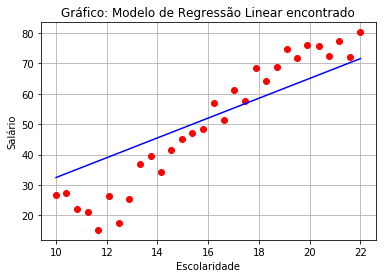

After 1000 iterations b = -0.182342553765, m = 3.2621822676, error = 103.398422917


In [56]:
# @author Veruska Santos
# @version 0.2

# Código baseado na aula de Siraj Raval
# Dados: anos de escolaridade de uma pessoa e o seu salário

from numpy import * # top para ML, multiplicação de matrizes
import matplotlib.pyplot as plt # gráficos

def compute_error_for_line_given_points(b, m, points):
    totalError = 0
    # calcula o erro para todos os dados
    for i in range(0, len(points)):
        x = points['year'][i]
        y = points['salary'][i]
        totalError += (y - (m * x + b)) ** 2
    return totalError / float(len(points))

def step_gradient(b_current, m_current, points, learningRate):
    b_gradient = 0
    m_gradient = 0
    
    # gradient descent
    # cálculo das derivadas parciais
    N = float(len(points))
    for i in range(0, len(points)):
        x = points['year'][i]
        y = points['salary'][i]
        b_gradient += -(2/N) * (y - ((m_current * x) + b_current))
        m_gradient += -(2/N) * x * (y - ((m_current * x) + b_current))
    new_b = b_current - (learningRate * b_gradient)
    new_m = m_current - (learningRate * m_gradient)
    return [new_b, new_m]

def gradient_descent_runner(points, starting_b, starting_m, learning_rate, num_iterations):
    b = starting_b
    m = starting_m
    for i in range(num_iterations):
        b, m = step_gradient(b, m, array(points), learning_rate)
    return [b, m]

def plot_graph(points, m, b):
    x = points['year']
    y = points['salary']
    plt.plot(x, y, 'ro', x, m * x + b, 'b-')
    
    plt.grid(True)
    plt.title(u"Gráfico: Modelo de Regressão Linear encontrado")
    plt.xlabel(u"Escolaridade")
    plt.ylabel(u"Salário")
    
    plt.show()

def run():
    points = genfromtxt("income.csv", delimiter=",", names=['year', 'salary'])
    
    learning_rate = 0.0001 # quão rápido deve ser o processo de aprendizagem
    # y = mx + b é o modelo linear que nós queremos
    initial_b = 0 # intercepta o y
    initial_m = 0 # a inclininação da reta
    num_iterations = 1000 # quantidade de repetições do treinamento
    
    print "Starting gradient descent at b = {0}, m = {1}, error = {2}".format(initial_b, initial_m, compute_error_for_line_given_points(initial_b, initial_m, points))
    print "Running..."
    [b, m] = gradient_descent_runner(points, initial_b, initial_m, learning_rate, num_iterations)
    plot_graph(points, m, b)
    print "After {0} iterations b = {1}, m = {2}, error = {3}".format(num_iterations, b, m, compute_error_for_line_given_points(b, m, points))
    

if __name__ == '__main__':
    run()

O resultado do algoritmo foi a seguinte relação: __y = 3.26x - 0.18__, com erro = 103.4. Com base nesses dados, a cada ano de escolaridade, o salário da pessoa cresce 3.26 unidades.

O gráfico acima nos mostra a relação encontrada (linha azul) a partir dos dados (pontos vermelhos). A partir do erro alto e do gráfico é possível perceber que o modelo encontrado não mostrou bem a relação, crescente e positiva, entre os dados, porque a inclininação da linha está diferente.

### 2. Imprimindo o RSS a cada iteração do gradiente descendente

No processo de aprendizagem, o objeto aprende gradativamente por passos a partir de algo ou alguém. Assim, na aprendizagem de máquina, o algoritmo deve aprender uma função a partir do dados, consultando-os, por diversas vezes, até que o modelo atinja um erro mínimo. Este processo de consultar os dados e diminuir o erro do modelo é denomidado de iteração. A seguir, veremos o erro do modelo para cada uma das 1000 iterações.

In [57]:

def gradient_descent_runner(points, starting_b, starting_m, learning_rate, num_iterations):
    b = starting_b
    m = starting_m
    for i in range(num_iterations):
        b, m = step_gradient(b, m, array(points), learning_rate)
        
        # 2- Impressão do RSS a cada iteração do gradiente descendente
        print "Iteração {0}, RSS = {1} ".format(i+1, compute_error_for_line_given_points(b, m, points))
    return [b, m]

def run():
    points = genfromtxt("income.csv", delimiter=",", names=['year', 'salary'])
    # quão rápido deve ser o processo de aprendizagem
    learning_rate = 0.0001
    # y = mx + b é o modelo linear que nós queremos
    initial_b = 0 # intercepta o y
    initial_m = 0 # a inclininação da reta
    num_iterations = 1000 # quantidade de repetições do treinamento
    print "Starting gradient descent at b = {0}, m = {1}, error = {2}".format(initial_b, initial_m, compute_error_for_line_given_points(initial_b, initial_m, points))
    print "Running..."
    [b, m] = gradient_descent_runner(points, initial_b, initial_m, learning_rate, num_iterations)
    print "After {0} iterations b = {1}, m = {2}, error = {3}".format(num_iterations, b, m, compute_error_for_line_given_points(b, m, points))

if __name__ == '__main__':
    run()

Starting gradient descent at b = 0, m = 0, error = 2946.63449705
Running...
Iteração 1, RSS = 2648.23812663 
Iteração 2, RSS = 2381.17359262 
Iteração 3, RSS = 2142.15101365 
Iteração 4, RSS = 1928.22594993 
Iteração 5, RSS = 1736.76313147 
Iteração 6, RSS = 1565.40399487 
Iteração 7, RSS = 1412.03762879 
Iteração 8, RSS = 1274.7747702 
Iteração 9, RSS = 1151.92453099 
Iteração 10, RSS = 1041.97356839 
Iteração 11, RSS = 943.567442476 
Iteração 12, RSS = 855.493931198 
Iteração 13, RSS = 776.668097302 
Iteração 14, RSS = 706.118923285 
Iteração 15, RSS = 642.977349676 
Iteração 16, RSS = 586.465569318 
Iteração 17, RSS = 535.887445762 
Iteração 18, RSS = 490.619937745 
Iteração 19, RSS = 450.105424102 
Iteração 20, RSS = 413.844834576 
Iteração 21, RSS = 381.391501902 
Iteração 22, RSS = 352.345659429 
Iteração 23, RSS = 326.349516493 
Iteração 24, RSS = 303.082850894 
Iteração 25, RSS = 282.259064154 
Iteração 26, RSS = 263.62165099 
Iteração 27, RSS = 246.941039487 
Iteração 28, RSS 

Iteração 986, RSS = 103.418016839 
Iteração 987, RSS = 103.4166171 
Iteração 988, RSS = 103.415217388 
Iteração 989, RSS = 103.413817702 
Iteração 990, RSS = 103.412418043 
Iteração 991, RSS = 103.411018411 
Iteração 992, RSS = 103.409618805 
Iteração 993, RSS = 103.408219226 
Iteração 994, RSS = 103.406819673 
Iteração 995, RSS = 103.405420148 
Iteração 996, RSS = 103.404020648 
Iteração 997, RSS = 103.402621176 
Iteração 998, RSS = 103.40122173 
Iteração 999, RSS = 103.39982231 
Iteração 1000, RSS = 103.398422917 
After 1000 iterations b = -0.182342553765, m = 3.2621822676, error = 103.398422917


É possível perceber que, na primeira iteração o erro é enorme e, aparentemente, diminui ao longo das iterações, chegando em 103 na última iteração. Para confirmar esse comportamento, veremos um gráfico com o valor do erro ao longo de todas as iterações do processo.

### 3. Comportamento e gráfico do RSS

Starting gradient descent at b = 0, m = 0, error = 2946.63449705
Running...
Iteração 1, RSS = 2648.23812663 
Iteração 2, RSS = 2381.17359262 
Iteração 3, RSS = 2142.15101365 
Iteração 4, RSS = 1928.22594993 
Iteração 5, RSS = 1736.76313147 
Iteração 6, RSS = 1565.40399487 
Iteração 7, RSS = 1412.03762879 
Iteração 8, RSS = 1274.7747702 
Iteração 9, RSS = 1151.92453099 
Iteração 10, RSS = 1041.97356839 
Iteração 11, RSS = 943.567442476 
Iteração 12, RSS = 855.493931198 
Iteração 13, RSS = 776.668097302 
Iteração 14, RSS = 706.118923285 
Iteração 15, RSS = 642.977349676 
Iteração 16, RSS = 586.465569318 
Iteração 17, RSS = 535.887445762 
Iteração 18, RSS = 490.619937745 
Iteração 19, RSS = 450.105424102 
Iteração 20, RSS = 413.844834576 
Iteração 21, RSS = 381.391501902 
Iteração 22, RSS = 352.345659429 
Iteração 23, RSS = 326.349516493 
Iteração 24, RSS = 303.082850894 
Iteração 25, RSS = 282.259064154 
Iteração 26, RSS = 263.62165099 
Iteração 27, RSS = 246.941039487 
Iteração 28, RSS 

Iteração 796, RSS = 103.684450916 
Iteração 797, RSS = 103.683046109 
Iteração 798, RSS = 103.681641329 
Iteração 799, RSS = 103.680236576 
Iteração 800, RSS = 103.678831849 
Iteração 801, RSS = 103.677427149 
Iteração 802, RSS = 103.676022476 
Iteração 803, RSS = 103.67461783 
Iteração 804, RSS = 103.67321321 
Iteração 805, RSS = 103.671808617 
Iteração 806, RSS = 103.670404051 
Iteração 807, RSS = 103.668999511 
Iteração 808, RSS = 103.667594999 
Iteração 809, RSS = 103.666190512 
Iteração 810, RSS = 103.664786053 
Iteração 811, RSS = 103.66338162 
Iteração 812, RSS = 103.661977214 
Iteração 813, RSS = 103.660572835 
Iteração 814, RSS = 103.659168483 
Iteração 815, RSS = 103.657764157 
Iteração 816, RSS = 103.656359858 
Iteração 817, RSS = 103.654955585 
Iteração 818, RSS = 103.65355134 
Iteração 819, RSS = 103.652147121 
Iteração 820, RSS = 103.650742928 
Iteração 821, RSS = 103.649338763 
Iteração 822, RSS = 103.647934624 
Iteração 823, RSS = 103.646530512 
Iteração 824, RSS = 103.

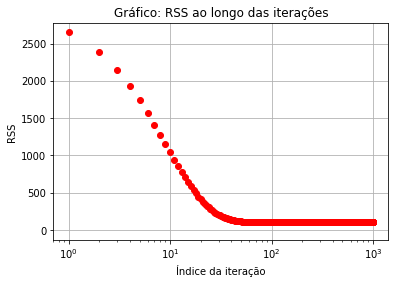

After 1000 iterations b = -0.182342553765, m = 3.2621822676, error = 103.398422917


In [58]:

def rss_graph(rss_values):

    plt.plot(rss_values, 'ro')

    plt.grid(True)
    plt.title(u"Gráfico: RSS ao longo das iterações")
    plt.xlabel(u"Índice da iteração")
    plt.xscale('log')
    plt.ylabel("RSS")
    
    plt.show()

def gradient_descent_runner(points, starting_b, starting_m, learning_rate, num_iterations):
    b = starting_b
    m = starting_m
    rss_values = []
    rss_values.append(0)
    for i in range(num_iterations):
        b, m = step_gradient(b, m, array(points), learning_rate)
        rss = compute_error_for_line_given_points(b, m, points)
        rss_values.append(rss)
        
        # 2- Impressão do RSS a cada iteração do gradiente descendente
        print "Iteração {0}, RSS = {1} ".format(i+1, compute_error_for_line_given_points(b, m, points))
        
    # 3- Comportamento e gráfico do RSS
    rss_graph(rss_values)
    return [b, m]

if __name__ == '__main__':
    run()

Como visto na seção 2 e no Gráfico acima, o RSS diminui ao longo das iterações e estabiliza-se, porque esse é o objetivo do gradiente descente: encontrar o erro mínimo da função. 

### 4. Alterar a quantidade de iterações e a taxa de aprendizagem para encontrar w0 = -39 e w1 = 5  

A quantidade de iterações define quando o algoritmo deve parar de melhorar o modelo, ou seja, parar a execução. A taxa de aprendizagem define a velocidade do aprendizado: se for muito pequeno o algoritmo torna-se lento para encontrar um valor ótimo, e se for muita alta o algoritmo pode perder/passar (d)o valor ótimo. Assim, iremos alterá-los a fim de encontrar os parâmetros m (w0) e b (w1) solicitados.

Starting gradient descent at b = 0, m = 0, error = 2946.63449705, iterações = 100000, taxa de aprendizagem = 0.001
Running...
Iteração 1, RSS = 707.27101659 
Iteração 2, RSS = 232.508779735 
Iteração 3, RSS = 131.846692069 
Iteração 4, RSS = 110.494831064 
Iteração 5, RSS = 105.956950742 
Iteração 6, RSS = 104.983681088 
Iteração 7, RSS = 104.766120491 
Iteração 8, RSS = 104.708774355 
Iteração 9, RSS = 104.685396244 
Iteração 10, RSS = 104.669221579 
Iteração 11, RSS = 104.654576198 
Iteração 12, RSS = 104.640257162 
Iteração 13, RSS = 104.626009445 
Iteração 14, RSS = 104.61177898 
Iteração 15, RSS = 104.597554306 
Iteração 16, RSS = 104.58333299 
Iteração 17, RSS = 104.569114518 
Iteração 18, RSS = 104.554898779 
Iteração 19, RSS = 104.540685751 
Iteração 20, RSS = 104.526475427 
Iteração 21, RSS = 104.512267807 
Iteração 22, RSS = 104.498062889 
Iteração 23, RSS = 104.483860672 
Iteração 24, RSS = 104.469661157 
Iteração 25, RSS = 104.455464343 
Iteração 26, RSS = 104.441270229 
It

Iteração 869, RSS = 93.3867712963 
Iteração 870, RSS = 93.3746824663 
Iteração 871, RSS = 93.3625959356 
Iteração 872, RSS = 93.3505117038 
Iteração 873, RSS = 93.3384297704 
Iteração 874, RSS = 93.326350135 
Iteração 875, RSS = 93.3142727972 
Iteração 876, RSS = 93.3021977565 
Iteração 877, RSS = 93.2901250125 
Iteração 878, RSS = 93.2780545648 
Iteração 879, RSS = 93.2659864129 
Iteração 880, RSS = 93.2539205564 
Iteração 881, RSS = 93.2418569948 
Iteração 882, RSS = 93.2297957277 
Iteração 883, RSS = 93.2177367547 
Iteração 884, RSS = 93.2056800754 
Iteração 885, RSS = 93.1936256892 
Iteração 886, RSS = 93.1815735958 
Iteração 887, RSS = 93.1695237947 
Iteração 888, RSS = 93.1574762856 
Iteração 889, RSS = 93.1454310678 
Iteração 890, RSS = 93.1333881411 
Iteração 891, RSS = 93.121347505 
Iteração 892, RSS = 93.1093091591 
Iteração 893, RSS = 93.0972731028 
Iteração 894, RSS = 93.0852393358 
Iteração 895, RSS = 93.0732078577 
Iteração 896, RSS = 93.061178668 
Iteração 897, RSS = 93.

Iteração 1873, RSS = 82.3371300337 
Iteração 1874, RSS = 82.3271428641 
Iteração 1875, RSS = 82.317157594 
Iteração 1876, RSS = 82.3071742231 
Iteração 1877, RSS = 82.2971927511 
Iteração 1878, RSS = 82.2872131776 
Iteração 1879, RSS = 82.2772355022 
Iteração 1880, RSS = 82.2672597246 
Iteração 1881, RSS = 82.2572858444 
Iteração 1882, RSS = 82.2473138613 
Iteração 1883, RSS = 82.2373437748 
Iteração 1884, RSS = 82.2273755846 
Iteração 1885, RSS = 82.2174092905 
Iteração 1886, RSS = 82.2074448919 
Iteração 1887, RSS = 82.1974823886 
Iteração 1888, RSS = 82.1875217802 
Iteração 1889, RSS = 82.1775630662 
Iteração 1890, RSS = 82.1676062465 
Iteração 1891, RSS = 82.1576513205 
Iteração 1892, RSS = 82.1476982881 
Iteração 1893, RSS = 82.1377471486 
Iteração 1894, RSS = 82.1277979019 
Iteração 1895, RSS = 82.1178505476 
Iteração 1896, RSS = 82.1079050853 
Iteração 1897, RSS = 82.0979615146 
Iteração 1898, RSS = 82.0880198352 
Iteração 1899, RSS = 82.0780800467 
Iteração 1900, RSS = 82.06814

Iteração 2793, RSS = 73.9071922953 
Iteração 2794, RSS = 73.8988085139 
Iteração 2795, RSS = 73.8904263272 
Iteração 2796, RSS = 73.8820457349 
Iteração 2797, RSS = 73.8736667365 
Iteração 2798, RSS = 73.8652893318 
Iteração 2799, RSS = 73.8569135205 
Iteração 2800, RSS = 73.8485393023 
Iteração 2801, RSS = 73.8401666769 
Iteração 2802, RSS = 73.8317956439 
Iteração 2803, RSS = 73.8234262032 
Iteração 2804, RSS = 73.8150583543 
Iteração 2805, RSS = 73.8066920971 
Iteração 2806, RSS = 73.7983274311 
Iteração 2807, RSS = 73.789964356 
Iteração 2808, RSS = 73.7816028717 
Iteração 2809, RSS = 73.7732429777 
Iteração 2810, RSS = 73.7648846738 
Iteração 2811, RSS = 73.7565279596 
Iteração 2812, RSS = 73.7481728349 
Iteração 2813, RSS = 73.7398192994 
Iteração 2814, RSS = 73.7314673527 
Iteração 2815, RSS = 73.7231169946 
Iteração 2816, RSS = 73.7147682247 
Iteração 2817, RSS = 73.7064210427 
Iteração 2818, RSS = 73.6980754485 
Iteração 2819, RSS = 73.6897314415 
Iteração 2820, RSS = 73.68138

Iteração 3779, RSS = 66.3690017012 
Iteração 3780, RSS = 66.3620516964 
Iteração 3781, RSS = 66.3551030135 
Iteração 3782, RSS = 66.3481556523 
Iteração 3783, RSS = 66.3412096125 
Iteração 3784, RSS = 66.3342648938 
Iteração 3785, RSS = 66.327321496 
Iteração 3786, RSS = 66.3203794189 
Iteração 3787, RSS = 66.3134386622 
Iteração 3788, RSS = 66.3064992256 
Iteração 3789, RSS = 66.2995611089 
Iteração 3790, RSS = 66.2926243118 
Iteração 3791, RSS = 66.2856888342 
Iteração 3792, RSS = 66.2787546757 
Iteração 3793, RSS = 66.271821836 
Iteração 3794, RSS = 66.264890315 
Iteração 3795, RSS = 66.2579601124 
Iteração 3796, RSS = 66.2510312279 
Iteração 3797, RSS = 66.2441036613 
Iteração 3798, RSS = 66.2371774124 
Iteração 3799, RSS = 66.2302524808 
Iteração 3800, RSS = 66.2233288664 
Iteração 3801, RSS = 66.2164065688 
Iteração 3802, RSS = 66.2094855879 
Iteração 3803, RSS = 66.2025659234 
Iteração 3804, RSS = 66.195647575 
Iteração 3805, RSS = 66.1887305424 
Iteração 3806, RSS = 66.18181482

Iteração 4683, RSS = 60.5961628038 
Iteração 4684, RSS = 60.5903108027 
Iteração 4685, RSS = 60.5844599147 
Iteração 4686, RSS = 60.5786101395 
Iteração 4687, RSS = 60.5727614769 
Iteração 4688, RSS = 60.5669139268 
Iteração 4689, RSS = 60.5610674889 
Iteração 4690, RSS = 60.555222163 
Iteração 4691, RSS = 60.5493779488 
Iteração 4692, RSS = 60.5435348463 
Iteração 4693, RSS = 60.5376928551 
Iteração 4694, RSS = 60.5318519751 
Iteração 4695, RSS = 60.526012206 
Iteração 4696, RSS = 60.5201735477 
Iteração 4697, RSS = 60.5143359999 
Iteração 4698, RSS = 60.5084995624 
Iteração 4699, RSS = 60.502664235 
Iteração 4700, RSS = 60.4968300175 
Iteração 4701, RSS = 60.4909969096 
Iteração 4702, RSS = 60.4851649113 
Iteração 4703, RSS = 60.4793340221 
Iteração 4704, RSS = 60.4735042421 
Iteração 4705, RSS = 60.4676755708 
Iteração 4706, RSS = 60.4618480082 
Iteração 4707, RSS = 60.456021554 
Iteração 4708, RSS = 60.450196208 
Iteração 4709, RSS = 60.44437197 
Iteração 4710, RSS = 60.4385488398 

Iteração 5500, RSS = 56.1676493946 
Iteração 5501, RSS = 56.1626397042 
Iteração 5502, RSS = 56.1576309667 
Iteração 5503, RSS = 56.1526231818 
Iteração 5504, RSS = 56.1476163494 
Iteração 5505, RSS = 56.1426104693 
Iteração 5506, RSS = 56.1376055414 
Iteração 5507, RSS = 56.1326015654 
Iteração 5508, RSS = 56.1275985411 
Iteração 5509, RSS = 56.1225964685 
Iteração 5510, RSS = 56.1175953472 
Iteração 5511, RSS = 56.1125951772 
Iteração 5512, RSS = 56.1075959582 
Iteração 5513, RSS = 56.10259769 
Iteração 5514, RSS = 56.0976003726 
Iteração 5515, RSS = 56.0926040056 
Iteração 5516, RSS = 56.087608589 
Iteração 5517, RSS = 56.0826141225 
Iteração 5518, RSS = 56.077620606 
Iteração 5519, RSS = 56.0726280392 
Iteração 5520, RSS = 56.067636422 
Iteração 5521, RSS = 56.0626457542 
Iteração 5522, RSS = 56.0576560357 
Iteração 5523, RSS = 56.0526672662 
Iteração 5524, RSS = 56.0476794456 
Iteração 5525, RSS = 56.0426925737 
Iteração 5526, RSS = 56.0377066503 
Iteração 5527, RSS = 56.032721675

Iteração 6276, RSS = 52.5530938568 
Iteração 6277, RSS = 52.548771661 
Iteração 6278, RSS = 52.5444502872 
Iteração 6279, RSS = 52.5401297354 
Iteração 6280, RSS = 52.5358100054 
Iteração 6281, RSS = 52.5314910969 
Iteração 6282, RSS = 52.5271730099 
Iteração 6283, RSS = 52.5228557443 
Iteração 6284, RSS = 52.5185392998 
Iteração 6285, RSS = 52.5142236763 
Iteração 6286, RSS = 52.5099088736 
Iteração 6287, RSS = 52.5055948916 
Iteração 6288, RSS = 52.5012817301 
Iteração 6289, RSS = 52.496969389 
Iteração 6290, RSS = 52.4926578681 
Iteração 6291, RSS = 52.4883471673 
Iteração 6292, RSS = 52.4840372864 
Iteração 6293, RSS = 52.4797282252 
Iteração 6294, RSS = 52.4754199836 
Iteração 6295, RSS = 52.4711125615 
Iteração 6296, RSS = 52.4668059586 
Iteração 6297, RSS = 52.4625001749 
Iteração 6298, RSS = 52.4581952101 
Iteração 6299, RSS = 52.4538910641 
Iteração 6300, RSS = 52.4495877368 
Iteração 6301, RSS = 52.445285228 
Iteração 6302, RSS = 52.4409835375 
Iteração 6303, RSS = 52.4366826

Iteração 7180, RSS = 48.9629754112 
Iteração 7181, RSS = 48.9593360619 
Iteração 7182, RSS = 48.9556974049 
Iteração 7183, RSS = 48.9520594399 
Iteração 7184, RSS = 48.9484221668 
Iteração 7185, RSS = 48.9447855856 
Iteração 7186, RSS = 48.9411496961 
Iteração 7187, RSS = 48.9375144981 
Iteração 7188, RSS = 48.9338799915 
Iteração 7189, RSS = 48.9302461762 
Iteração 7190, RSS = 48.9266130521 
Iteração 7191, RSS = 48.922980619 
Iteração 7192, RSS = 48.9193488768 
Iteração 7193, RSS = 48.9157178253 
Iteração 7194, RSS = 48.9120874645 
Iteração 7195, RSS = 48.9084577942 
Iteração 7196, RSS = 48.9048288143 
Iteração 7197, RSS = 48.9012005246 
Iteração 7198, RSS = 48.897572925 
Iteração 7199, RSS = 48.8939460154 
Iteração 7200, RSS = 48.8903197956 
Iteração 7201, RSS = 48.8866942655 
Iteração 7202, RSS = 48.8830694251 
Iteração 7203, RSS = 48.879445274 
Iteração 7204, RSS = 48.8758218123 
Iteração 7205, RSS = 48.8721990398 
Iteração 7206, RSS = 48.8685769563 
Iteração 7207, RSS = 48.8649555

Iteração 8139, RSS = 45.7723671024 
Iteração 8140, RSS = 45.7693346122 
Iteração 8141, RSS = 45.7663026988 
Iteração 8142, RSS = 45.763271362 
Iteração 8143, RSS = 45.7602406018 
Iteração 8144, RSS = 45.7572104181 
Iteração 8145, RSS = 45.7541808107 
Iteração 8146, RSS = 45.7511517796 
Iteração 8147, RSS = 45.7481233245 
Iteração 8148, RSS = 45.7450954455 
Iteração 8149, RSS = 45.7420681424 
Iteração 8150, RSS = 45.7390414151 
Iteração 8151, RSS = 45.7360152635 
Iteração 8152, RSS = 45.7329896875 
Iteração 8153, RSS = 45.7299646869 
Iteração 8154, RSS = 45.7269402617 
Iteração 8155, RSS = 45.7239164118 
Iteração 8156, RSS = 45.720893137 
Iteração 8157, RSS = 45.7178704372 
Iteração 8158, RSS = 45.7148483123 
Iteração 8159, RSS = 45.7118267623 
Iteração 8160, RSS = 45.708805787 
Iteração 8161, RSS = 45.7057853862 
Iteração 8162, RSS = 45.70276556 
Iteração 8163, RSS = 45.6997463081 
Iteração 8164, RSS = 45.6967276305 
Iteração 8165, RSS = 45.693709527 
Iteração 8166, RSS = 45.6906919976

Iteração 9178, RSS = 42.9131558785 
Iteração 9179, RSS = 42.9106672151 
Iteração 9180, RSS = 42.908179025 
Iteração 9181, RSS = 42.9056913082 
Iteração 9182, RSS = 42.9032040645 
Iteração 9183, RSS = 42.9007172939 
Iteração 9184, RSS = 42.8982309963 
Iteração 9185, RSS = 42.8957451717 
Iteração 9186, RSS = 42.8932598198 
Iteração 9187, RSS = 42.8907749406 
Iteração 9188, RSS = 42.8882905341 
Iteração 9189, RSS = 42.8858066001 
Iteração 9190, RSS = 42.8833231385 
Iteração 9191, RSS = 42.8808401494 
Iteração 9192, RSS = 42.8783576324 
Iteração 9193, RSS = 42.8758755877 
Iteração 9194, RSS = 42.873394015 
Iteração 9195, RSS = 42.8709129144 
Iteração 9196, RSS = 42.8684322856 
Iteração 9197, RSS = 42.8659521287 
Iteração 9198, RSS = 42.8634724435 
Iteração 9199, RSS = 42.86099323 
Iteração 9200, RSS = 42.858514488 
Iteração 9201, RSS = 42.8560362174 
Iteração 9202, RSS = 42.8535584183 
Iteração 9203, RSS = 42.8510810904 
Iteração 9204, RSS = 42.8486042337 
Iteração 9205, RSS = 42.846127848

Iteração 10054, RSS = 40.904848806 
Iteração 10055, RSS = 40.902742126 
Iteração 10056, RSS = 40.9006358466 
Iteração 10057, RSS = 40.8985299679 
Iteração 10058, RSS = 40.8964244897 
Iteração 10059, RSS = 40.894319412 
Iteração 10060, RSS = 40.8922147347 
Iteração 10061, RSS = 40.8901104576 
Iteração 10062, RSS = 40.8880065809 
Iteração 10063, RSS = 40.8859031042 
Iteração 10064, RSS = 40.8838000277 
Iteração 10065, RSS = 40.8816973512 
Iteração 10066, RSS = 40.8795950746 
Iteração 10067, RSS = 40.8774931978 
Iteração 10068, RSS = 40.8753917209 
Iteração 10069, RSS = 40.8732906436 
Iteração 10070, RSS = 40.871189966 
Iteração 10071, RSS = 40.8690896879 
Iteração 10072, RSS = 40.8669898093 
Iteração 10073, RSS = 40.8648903301 
Iteração 10074, RSS = 40.8627912503 
Iteração 10075, RSS = 40.8606925696 
Iteração 10076, RSS = 40.8585942882 
Iteração 10077, RSS = 40.8564964058 
Iteração 10078, RSS = 40.8543989225 
Iteração 10079, RSS = 40.8523018381 
Iteração 10080, RSS = 40.8502051526 
Itera

Iteração 10868, RSS = 39.3160269384 
Iteração 10869, RSS = 39.3142224549 
Iteração 10870, RSS = 39.3124183147 
Iteração 10871, RSS = 39.3106145176 
Iteração 10872, RSS = 39.3088110636 
Iteração 10873, RSS = 39.3070079526 
Iteração 10874, RSS = 39.3052051846 
Iteração 10875, RSS = 39.3034027595 
Iteração 10876, RSS = 39.3016006772 
Iteração 10877, RSS = 39.2997989376 
Iteração 10878, RSS = 39.2979975408 
Iteração 10879, RSS = 39.2961964865 
Iteração 10880, RSS = 39.2943957749 
Iteração 10881, RSS = 39.2925954057 
Iteração 10882, RSS = 39.290795379 
Iteração 10883, RSS = 39.2889956946 
Iteração 10884, RSS = 39.2871963526 
Iteração 10885, RSS = 39.2853973527 
Iteração 10886, RSS = 39.2835986951 
Iteração 10887, RSS = 39.2818003795 
Iteração 10888, RSS = 39.280002406 
Iteração 10889, RSS = 39.2782047745 
Iteração 10890, RSS = 39.2764074849 
Iteração 10891, RSS = 39.2746105372 
Iteração 10892, RSS = 39.2728139312 
Iteração 10893, RSS = 39.2710176669 
Iteração 10894, RSS = 39.2692217443 
Ite

Iteração 11859, RSS = 37.6860676582 
Iteração 11860, RSS = 37.6845731958 
Iteração 11861, RSS = 37.6830790176 
Iteração 11862, RSS = 37.6815851236 
Iteração 11863, RSS = 37.6800915137 
Iteração 11864, RSS = 37.6785981879 
Iteração 11865, RSS = 37.6771051462 
Iteração 11866, RSS = 37.6756123884 
Iteração 11867, RSS = 37.6741199146 
Iteração 11868, RSS = 37.6726277246 
Iteração 11869, RSS = 37.6711358185 
Iteração 11870, RSS = 37.6696441961 
Iteração 11871, RSS = 37.6681528574 
Iteração 11872, RSS = 37.6666618024 
Iteração 11873, RSS = 37.6651710309 
Iteração 11874, RSS = 37.6636805431 
Iteração 11875, RSS = 37.6621903387 
Iteração 11876, RSS = 37.6607004177 
Iteração 11877, RSS = 37.6592107802 
Iteração 11878, RSS = 37.657721426 
Iteração 11879, RSS = 37.656232355 
Iteração 11880, RSS = 37.6547435673 
Iteração 11881, RSS = 37.6532550627 
Iteração 11882, RSS = 37.6517668413 
Iteração 11883, RSS = 37.6502789029 
Iteração 11884, RSS = 37.6487912475 
Iteração 11885, RSS = 37.6473038751 
Ite

Iteração 12789, RSS = 36.4120920349 
Iteração 12790, RSS = 36.4108398848 
Iteração 12791, RSS = 36.4095879728 
Iteração 12792, RSS = 36.4083362989 
Iteração 12793, RSS = 36.4070848631 
Iteração 12794, RSS = 36.4058336654 
Iteração 12795, RSS = 36.4045827056 
Iteração 12796, RSS = 36.4033319837 
Iteração 12797, RSS = 36.4020814998 
Iteração 12798, RSS = 36.4008312536 
Iteração 12799, RSS = 36.3995812453 
Iteração 12800, RSS = 36.3983314748 
Iteração 12801, RSS = 36.3970819419 
Iteração 12802, RSS = 36.3958326467 
Iteração 12803, RSS = 36.3945835891 
Iteração 12804, RSS = 36.3933347691 
Iteração 12805, RSS = 36.3920861866 
Iteração 12806, RSS = 36.3908378416 
Iteração 12807, RSS = 36.3895897341 
Iteração 12808, RSS = 36.3883418639 
Iteração 12809, RSS = 36.3870942311 
Iteração 12810, RSS = 36.3858468356 
Iteração 12811, RSS = 36.3845996773 
Iteração 12812, RSS = 36.3833527563 
Iteração 12813, RSS = 36.3821060724 
Iteração 12814, RSS = 36.3808596256 
Iteração 12815, RSS = 36.3796134159 
I

Iteração 13729, RSS = 35.3341966717 
Iteração 13730, RSS = 35.3331495391 
Iteração 13731, RSS = 35.3321026056 
Iteração 13732, RSS = 35.3310558713 
Iteração 13733, RSS = 35.3300093361 
Iteração 13734, RSS = 35.3289629999 
Iteração 13735, RSS = 35.3279168627 
Iteração 13736, RSS = 35.3268709245 
Iteração 13737, RSS = 35.3258251852 
Iteração 13738, RSS = 35.3247796449 
Iteração 13739, RSS = 35.3237343034 
Iteração 13740, RSS = 35.3226891607 
Iteração 13741, RSS = 35.3216442168 
Iteração 13742, RSS = 35.3205994717 
Iteração 13743, RSS = 35.3195549253 
Iteração 13744, RSS = 35.3185105775 
Iteração 13745, RSS = 35.3174664284 
Iteração 13746, RSS = 35.3164224779 
Iteração 13747, RSS = 35.315378726 
Iteração 13748, RSS = 35.3143351725 
Iteração 13749, RSS = 35.3132918176 
Iteração 13750, RSS = 35.3122486611 
Iteração 13751, RSS = 35.311205703 
Iteração 13752, RSS = 35.3101629433 
Iteração 13753, RSS = 35.3091203819 
Iteração 13754, RSS = 35.3080780189 
Iteração 13755, RSS = 35.307035854 
Iter

Iteração 14597, RSS = 34.4962766282 
Iteração 14598, RSS = 34.4953888694 
Iteração 14599, RSS = 34.4945012794 
Iteração 14600, RSS = 34.4936138583 
Iteração 14601, RSS = 34.4927266059 
Iteração 14602, RSS = 34.4918395223 
Iteração 14603, RSS = 34.4909526074 
Iteração 14604, RSS = 34.4900658612 
Iteração 14605, RSS = 34.4891792837 
Iteração 14606, RSS = 34.4882928748 
Iteração 14607, RSS = 34.4874066345 
Iteração 14608, RSS = 34.4865205628 
Iteração 14609, RSS = 34.4856346596 
Iteração 14610, RSS = 34.4847489249 
Iteração 14611, RSS = 34.4838633586 
Iteração 14612, RSS = 34.4829779608 
Iteração 14613, RSS = 34.4820927314 
Iteração 14614, RSS = 34.4812076704 
Iteração 14615, RSS = 34.4803227777 
Iteração 14616, RSS = 34.4794380533 
Iteração 14617, RSS = 34.4785534972 
Iteração 14618, RSS = 34.4776691094 
Iteração 14619, RSS = 34.4767848897 
Iteração 14620, RSS = 34.4759008382 
Iteração 14621, RSS = 34.4750169549 
Iteração 14622, RSS = 34.4741332397 
Iteração 14623, RSS = 34.4732496926 
I

Iteração 15475, RSS = 33.7783682093 
Iteração 15476, RSS = 33.7776169979 
Iteração 15477, RSS = 33.7768659293 
Iteração 15478, RSS = 33.7761150036 
Iteração 15479, RSS = 33.7753642208 
Iteração 15480, RSS = 33.7746135807 
Iteração 15481, RSS = 33.7738630834 
Iteração 15482, RSS = 33.7731127288 
Iteração 15483, RSS = 33.772362517 
Iteração 15484, RSS = 33.7716124479 
Iteração 15485, RSS = 33.7708625214 
Iteração 15486, RSS = 33.7701127375 
Iteração 15487, RSS = 33.7693630963 
Iteração 15488, RSS = 33.7686135976 
Iteração 15489, RSS = 33.7678642415 
Iteração 15490, RSS = 33.767115028 
Iteração 15491, RSS = 33.7663659569 
Iteração 15492, RSS = 33.7656170283 
Iteração 15493, RSS = 33.7648682422 
Iteração 15494, RSS = 33.7641195985 
Iteração 15495, RSS = 33.7633710971 
Iteração 15496, RSS = 33.7626227382 
Iteração 15497, RSS = 33.7618745215 
Iteração 15498, RSS = 33.7611264472 
Iteração 15499, RSS = 33.7603785152 
Iteração 15500, RSS = 33.7596307254 
Iteração 15501, RSS = 33.7588830779 
Ite

Iteração 16307, RSS = 33.2002540179 
Iteração 16308, RSS = 33.1996127648 
Iteração 16309, RSS = 33.1989716336 
Iteração 16310, RSS = 33.1983306243 
Iteração 16311, RSS = 33.197689737 
Iteração 16312, RSS = 33.1970489716 
Iteração 16313, RSS = 33.1964083281 
Iteração 16314, RSS = 33.1957678064 
Iteração 16315, RSS = 33.1951274065 
Iteração 16316, RSS = 33.1944871285 
Iteração 16317, RSS = 33.1938469722 
Iteração 16318, RSS = 33.1932069377 
Iteração 16319, RSS = 33.1925670249 
Iteração 16320, RSS = 33.1919272338 
Iteração 16321, RSS = 33.1912875645 
Iteração 16322, RSS = 33.1906480167 
Iteração 16323, RSS = 33.1900085907 
Iteração 16324, RSS = 33.1893692862 
Iteração 16325, RSS = 33.1887301034 
Iteração 16326, RSS = 33.1880910421 
Iteração 16327, RSS = 33.1874521024 
Iteração 16328, RSS = 33.1868132842 
Iteração 16329, RSS = 33.1861745875 
Iteração 16330, RSS = 33.1855360122 
Iteração 16331, RSS = 33.1848975585 
Iteração 16332, RSS = 33.1842592262 
Iteração 16333, RSS = 33.1836210153 
It

Iteração 17394, RSS = 32.5704949404 
Iteração 17395, RSS = 32.5699734685 
Iteração 17396, RSS = 32.5694520958 
Iteração 17397, RSS = 32.5689308222 
Iteração 17398, RSS = 32.5684096478 
Iteração 17399, RSS = 32.5678885725 
Iteração 17400, RSS = 32.5673675963 
Iteração 17401, RSS = 32.5668467192 
Iteração 17402, RSS = 32.5663259412 
Iteração 17403, RSS = 32.5658052623 
Iteração 17404, RSS = 32.5652846824 
Iteração 17405, RSS = 32.5647642014 
Iteração 17406, RSS = 32.5642438195 
Iteração 17407, RSS = 32.5637235366 
Iteração 17408, RSS = 32.5632033526 
Iteração 17409, RSS = 32.5626832676 
Iteração 17410, RSS = 32.5621632815 
Iteração 17411, RSS = 32.5616433942 
Iteração 17412, RSS = 32.5611236059 
Iteração 17413, RSS = 32.5606039164 
Iteração 17414, RSS = 32.5600843258 
Iteração 17415, RSS = 32.559564834 
Iteração 17416, RSS = 32.559045441 
Iteração 17417, RSS = 32.5585261468 
Iteração 17418, RSS = 32.5580069514 
Iteração 17419, RSS = 32.5574878547 
Iteração 17420, RSS = 32.5569688568 
Ite

Iteração 18490, RSS = 32.0545564123 
Iteração 18491, RSS = 32.0541330728 
Iteração 18492, RSS = 32.0537098138 
Iteração 18493, RSS = 32.0532866353 
Iteração 18494, RSS = 32.0528635372 
Iteração 18495, RSS = 32.0524405197 
Iteração 18496, RSS = 32.0520175826 
Iteração 18497, RSS = 32.051594726 
Iteração 18498, RSS = 32.0511719497 
Iteração 18499, RSS = 32.0507492539 
Iteração 18500, RSS = 32.0503266385 
Iteração 18501, RSS = 32.0499041035 
Iteração 18502, RSS = 32.0494816488 
Iteração 18503, RSS = 32.0490592745 
Iteração 18504, RSS = 32.0486369806 
Iteração 18505, RSS = 32.0482147669 
Iteração 18506, RSS = 32.0477926336 
Iteração 18507, RSS = 32.0473705805 
Iteração 18508, RSS = 32.0469486078 
Iteração 18509, RSS = 32.0465267152 
Iteração 18510, RSS = 32.046104903 
Iteração 18511, RSS = 32.0456831709 
Iteração 18512, RSS = 32.0452615191 
Iteração 18513, RSS = 32.0448399475 
Iteração 18514, RSS = 32.044418456 
Iteração 18515, RSS = 32.0439970447 
Iteração 18516, RSS = 32.0435757136 
Iter

Iteração 19537, RSS = 31.6526293324 
Iteração 19538, RSS = 31.6522824401 
Iteração 19539, RSS = 31.6519356138 
Iteração 19540, RSS = 31.6515888534 
Iteração 19541, RSS = 31.651242159 
Iteração 19542, RSS = 31.6508955305 
Iteração 19543, RSS = 31.6505489679 
Iteração 19544, RSS = 31.6502024713 
Iteração 19545, RSS = 31.6498560405 
Iteração 19546, RSS = 31.6495096757 
Iteração 19547, RSS = 31.6491633767 
Iteração 19548, RSS = 31.6488171436 
Iteração 19549, RSS = 31.6484709764 
Iteração 19550, RSS = 31.648124875 
Iteração 19551, RSS = 31.6477788394 
Iteração 19552, RSS = 31.6474328697 
Iteração 19553, RSS = 31.6470869657 
Iteração 19554, RSS = 31.6467411276 
Iteração 19555, RSS = 31.6463953552 
Iteração 19556, RSS = 31.6460496486 
Iteração 19557, RSS = 31.6457040077 
Iteração 19558, RSS = 31.6453584326 
Iteração 19559, RSS = 31.6450129232 
Iteração 19560, RSS = 31.6446674795 
Iteração 19561, RSS = 31.6443221016 
Iteração 19562, RSS = 31.6439767893 
Iteração 19563, RSS = 31.6436315427 
Ite

Iteração 20392, RSS = 31.3788729307 
Iteração 20393, RSS = 31.3785781073 
Iteração 20394, RSS = 31.3782833399 
Iteração 20395, RSS = 31.3779886287 
Iteração 20396, RSS = 31.3776939735 
Iteração 20397, RSS = 31.3773993743 
Iteração 20398, RSS = 31.3771048312 
Iteração 20399, RSS = 31.3768103441 
Iteração 20400, RSS = 31.376515913 
Iteração 20401, RSS = 31.3762215379 
Iteração 20402, RSS = 31.3759272188 
Iteração 20403, RSS = 31.3756329557 
Iteração 20404, RSS = 31.3753387485 
Iteração 20405, RSS = 31.3750445974 
Iteração 20406, RSS = 31.3747505021 
Iteração 20407, RSS = 31.3744564628 
Iteração 20408, RSS = 31.3741624794 
Iteração 20409, RSS = 31.373868552 
Iteração 20410, RSS = 31.3735746804 
Iteração 20411, RSS = 31.3732808647 
Iteração 20412, RSS = 31.372987105 
Iteração 20413, RSS = 31.3726934011 
Iteração 20414, RSS = 31.372399753 
Iteração 20415, RSS = 31.3721061608 
Iteração 20416, RSS = 31.3718126245 
Iteração 20417, RSS = 31.371519144 
Iteração 20418, RSS = 31.3712257193 
Iteraç

Iteração 21271, RSS = 31.1402071263 
Iteração 21272, RSS = 31.1399576975 
Iteração 21273, RSS = 31.1397083162 
Iteração 21274, RSS = 31.1394589823 
Iteração 21275, RSS = 31.1392096958 
Iteração 21276, RSS = 31.1389604568 
Iteração 21277, RSS = 31.1387112652 
Iteração 21278, RSS = 31.1384621209 
Iteração 21279, RSS = 31.1382130241 
Iteração 21280, RSS = 31.1379639746 
Iteração 21281, RSS = 31.1377149725 
Iteração 21282, RSS = 31.1374660177 
Iteração 21283, RSS = 31.1372171103 
Iteração 21284, RSS = 31.1369682503 
Iteração 21285, RSS = 31.1367194375 
Iteração 21286, RSS = 31.1364706721 
Iteração 21287, RSS = 31.1362219541 
Iteração 21288, RSS = 31.1359732833 
Iteração 21289, RSS = 31.1357246598 
Iteração 21290, RSS = 31.1354760836 
Iteração 21291, RSS = 31.1352275547 
Iteração 21292, RSS = 31.1349790731 
Iteração 21293, RSS = 31.1347306387 
Iteração 21294, RSS = 31.1344822516 
Iteração 21295, RSS = 31.1342339117 
Iteração 21296, RSS = 31.133985619 
Iteração 21297, RSS = 31.1337373736 
It

Iteração 22225, RSS = 30.9225733389 
Iteração 22226, RSS = 30.9223653045 
Iteração 22227, RSS = 30.9221573096 
Iteração 22228, RSS = 30.9219493543 
Iteração 22229, RSS = 30.9217414385 
Iteração 22230, RSS = 30.9215335623 
Iteração 22231, RSS = 30.9213257256 
Iteração 22232, RSS = 30.9211179285 
Iteração 22233, RSS = 30.9209101708 
Iteração 22234, RSS = 30.9207024527 
Iteração 22235, RSS = 30.9204947741 
Iteração 22236, RSS = 30.920287135 
Iteração 22237, RSS = 30.9200795354 
Iteração 22238, RSS = 30.9198719753 
Iteração 22239, RSS = 30.9196644546 
Iteração 22240, RSS = 30.9194569735 
Iteração 22241, RSS = 30.9192495318 
Iteração 22242, RSS = 30.9190421295 
Iteração 22243, RSS = 30.9188347667 
Iteração 22244, RSS = 30.9186274433 
Iteração 22245, RSS = 30.9184201594 
Iteração 22246, RSS = 30.9182129149 
Iteração 22247, RSS = 30.9180057098 
Iteração 22248, RSS = 30.9177985441 
Iteração 22249, RSS = 30.9175914179 
Iteração 22250, RSS = 30.917384331 
Iteração 22251, RSS = 30.9171772835 
Ite

Iteração 23015, RSS = 30.7699641405 
Iteração 23016, RSS = 30.7697851326 
Iteração 23017, RSS = 30.7696061587 
Iteração 23018, RSS = 30.7694272189 
Iteração 23019, RSS = 30.7692483131 
Iteração 23020, RSS = 30.7690694413 
Iteração 23021, RSS = 30.7688906036 
Iteração 23022, RSS = 30.7687117998 
Iteração 23023, RSS = 30.7685330301 
Iteração 23024, RSS = 30.7683542944 
Iteração 23025, RSS = 30.7681755927 
Iteração 23026, RSS = 30.7679969249 
Iteração 23027, RSS = 30.7678182912 
Iteração 23028, RSS = 30.7676396914 
Iteração 23029, RSS = 30.7674611256 
Iteração 23030, RSS = 30.7672825937 
Iteração 23031, RSS = 30.7671040958 
Iteração 23032, RSS = 30.7669256319 
Iteração 23033, RSS = 30.7667472019 
Iteração 23034, RSS = 30.7665688059 
Iteração 23035, RSS = 30.7663904437 
Iteração 23036, RSS = 30.7662121155 
Iteração 23037, RSS = 30.7660338213 
Iteração 23038, RSS = 30.7658555609 
Iteração 23039, RSS = 30.7656773344 
Iteração 23040, RSS = 30.7654991419 
Iteração 23041, RSS = 30.7653209832 
I

Iteração 23929, RSS = 30.6197699299 
Iteração 23930, RSS = 30.6196194892 
Iteração 23931, RSS = 30.6194690771 
Iteração 23932, RSS = 30.6193186936 
Iteração 23933, RSS = 30.6191683387 
Iteração 23934, RSS = 30.6190180123 
Iteração 23935, RSS = 30.6188677146 
Iteração 23936, RSS = 30.6187174455 
Iteração 23937, RSS = 30.618567205 
Iteração 23938, RSS = 30.618416993 
Iteração 23939, RSS = 30.6182668096 
Iteração 23940, RSS = 30.6181166548 
Iteração 23941, RSS = 30.6179665285 
Iteração 23942, RSS = 30.6178164308 
Iteração 23943, RSS = 30.6176663616 
Iteração 23944, RSS = 30.617516321 
Iteração 23945, RSS = 30.6173663089 
Iteração 23946, RSS = 30.6172163253 
Iteração 23947, RSS = 30.6170663703 
Iteração 23948, RSS = 30.6169164438 
Iteração 23949, RSS = 30.6167665458 
Iteração 23950, RSS = 30.6166166763 
Iteração 23951, RSS = 30.6164668353 
Iteração 23952, RSS = 30.6163170228 
Iteração 23953, RSS = 30.6161672389 
Iteração 23954, RSS = 30.6160174834 
Iteração 23955, RSS = 30.6158677564 
Iter

Iteração 24845, RSS = 30.4932917997 
Iteração 24846, RSS = 30.4931654153 
Iteração 24847, RSS = 30.493039055 
Iteração 24848, RSS = 30.4929127187 
Iteração 24849, RSS = 30.4927864064 
Iteração 24850, RSS = 30.4926601181 
Iteração 24851, RSS = 30.4925338539 
Iteração 24852, RSS = 30.4924076137 
Iteração 24853, RSS = 30.4922813975 
Iteração 24854, RSS = 30.4921552053 
Iteração 24855, RSS = 30.4920290371 
Iteração 24856, RSS = 30.4919028929 
Iteração 24857, RSS = 30.4917767727 
Iteração 24858, RSS = 30.4916506765 
Iteração 24859, RSS = 30.4915246042 
Iteração 24860, RSS = 30.491398556 
Iteração 24861, RSS = 30.4912725317 
Iteração 24862, RSS = 30.4911465314 
Iteração 24863, RSS = 30.491020555 
Iteração 24864, RSS = 30.4908946027 
Iteração 24865, RSS = 30.4907686742 
Iteração 24866, RSS = 30.4906427698 
Iteração 24867, RSS = 30.4905168892 
Iteração 24868, RSS = 30.4903910327 
Iteração 24869, RSS = 30.4902652 
Iteração 24870, RSS = 30.4901393913 
Iteração 24871, RSS = 30.4900136065 
Iteraçã

Iteração 25755, RSS = 30.3876757356 
Iteração 25756, RSS = 30.3875694395 
Iteração 25757, RSS = 30.3874631637 
Iteração 25758, RSS = 30.3873569081 
Iteração 25759, RSS = 30.3872506728 
Iteração 25760, RSS = 30.3871444576 
Iteração 25761, RSS = 30.3870382626 
Iteração 25762, RSS = 30.3869320878 
Iteração 25763, RSS = 30.3868259333 
Iteração 25764, RSS = 30.3867197989 
Iteração 25765, RSS = 30.3866136847 
Iteração 25766, RSS = 30.3865075906 
Iteração 25767, RSS = 30.3864015168 
Iteração 25768, RSS = 30.3862954631 
Iteração 25769, RSS = 30.3861894296 
Iteração 25770, RSS = 30.3860834163 
Iteração 25771, RSS = 30.3859774232 
Iteração 25772, RSS = 30.3858714502 
Iteração 25773, RSS = 30.3857654973 
Iteração 25774, RSS = 30.3856595646 
Iteração 25775, RSS = 30.3855536521 
Iteração 25776, RSS = 30.3854477597 
Iteração 25777, RSS = 30.3853418874 
Iteração 25778, RSS = 30.3852360353 
Iteração 25779, RSS = 30.3851302033 
Iteração 25780, RSS = 30.3850243914 
Iteração 25781, RSS = 30.3849185997 
I

Iteração 26754, RSS = 30.2909565392 
Iteração 26755, RSS = 30.2908686393 
Iteração 26756, RSS = 30.2907807562 
Iteração 26757, RSS = 30.2906928898 
Iteração 26758, RSS = 30.29060504 
Iteração 26759, RSS = 30.290517207 
Iteração 26760, RSS = 30.2904293907 
Iteração 26761, RSS = 30.2903415911 
Iteração 26762, RSS = 30.2902538082 
Iteração 26763, RSS = 30.290166042 
Iteração 26764, RSS = 30.2900782925 
Iteração 26765, RSS = 30.2899905596 
Iteração 26766, RSS = 30.2899028435 
Iteração 26767, RSS = 30.289815144 
Iteração 26768, RSS = 30.2897274613 
Iteração 26769, RSS = 30.2896397952 
Iteração 26770, RSS = 30.2895521458 
Iteração 26771, RSS = 30.289464513 
Iteração 26772, RSS = 30.2893768969 
Iteração 26773, RSS = 30.2892892975 
Iteração 26774, RSS = 30.2892017147 
Iteração 26775, RSS = 30.2891141486 
Iteração 26776, RSS = 30.2890265992 
Iteração 26777, RSS = 30.2889390664 
Iteração 26778, RSS = 30.2888515503 
Iteração 26779, RSS = 30.2887640508 
Iteração 26780, RSS = 30.2886765679 
Iteraçã

Iteração 26986, RSS = 30.2710053015 
Iteração 26987, RSS = 30.2709211964 
Iteração 26988, RSS = 30.2708371072 
Iteração 26989, RSS = 30.2707530341 
Iteração 26990, RSS = 30.270668977 
Iteração 26991, RSS = 30.2705849358 
Iteração 26992, RSS = 30.2705009107 
Iteração 26993, RSS = 30.2704169015 
Iteração 26994, RSS = 30.2703329083 
Iteração 26995, RSS = 30.2702489311 
Iteração 26996, RSS = 30.2701649698 
Iteração 26997, RSS = 30.2700810246 
Iteração 26998, RSS = 30.2699970953 
Iteração 26999, RSS = 30.2699131819 
Iteração 27000, RSS = 30.2698292845 
Iteração 27001, RSS = 30.2697454031 
Iteração 27002, RSS = 30.2696615376 
Iteração 27003, RSS = 30.2695776881 
Iteração 27004, RSS = 30.2694938545 
Iteração 27005, RSS = 30.2694100369 
Iteração 27006, RSS = 30.2693262352 
Iteração 27007, RSS = 30.2692424494 
Iteração 27008, RSS = 30.2691586796 
Iteração 27009, RSS = 30.2690749257 
Iteração 27010, RSS = 30.2689911878 
Iteração 27011, RSS = 30.2689074658 
Iteração 27012, RSS = 30.2688237597 
It

Iteração 27714, RSS = 30.2138217026 
Iteração 27715, RSS = 30.2137484739 
Iteração 27716, RSS = 30.2136752591 
Iteração 27717, RSS = 30.2136020583 
Iteração 27718, RSS = 30.2135288713 
Iteração 27719, RSS = 30.2134556983 
Iteração 27720, RSS = 30.2133825393 
Iteração 27721, RSS = 30.2133093941 
Iteração 27722, RSS = 30.2132362628 
Iteração 27723, RSS = 30.2131631455 
Iteração 27724, RSS = 30.2130900421 
Iteração 27725, RSS = 30.2130169525 
Iteração 27726, RSS = 30.2129438769 
Iteração 27727, RSS = 30.2128708152 
Iteração 27728, RSS = 30.2127977673 
Iteração 27729, RSS = 30.2127247334 
Iteração 27730, RSS = 30.2126517133 
Iteração 27731, RSS = 30.2125787072 
Iteração 27732, RSS = 30.2125057149 
Iteração 27733, RSS = 30.2124327365 
Iteração 27734, RSS = 30.212359772 
Iteração 27735, RSS = 30.2122868214 
Iteração 27736, RSS = 30.2122138846 
Iteração 27737, RSS = 30.2121409617 
Iteração 27738, RSS = 30.2120680527 
Iteração 27739, RSS = 30.2119951576 
Iteração 27740, RSS = 30.2119222763 
It

Iteração 28655, RSS = 30.1507225997 
Iteração 28656, RSS = 30.1506613726 
Iteração 28657, RSS = 30.1506001571 
Iteração 28658, RSS = 30.1505389532 
Iteração 28659, RSS = 30.150477761 
Iteração 28660, RSS = 30.1504165805 
Iteração 28661, RSS = 30.1503554115 
Iteração 28662, RSS = 30.1502942542 
Iteração 28663, RSS = 30.1502331086 
Iteração 28664, RSS = 30.1501719745 
Iteração 28665, RSS = 30.1501108521 
Iteração 28666, RSS = 30.1500497413 
Iteração 28667, RSS = 30.1499886422 
Iteração 28668, RSS = 30.1499275546 
Iteração 28669, RSS = 30.1498664787 
Iteração 28670, RSS = 30.1498054144 
Iteração 28671, RSS = 30.1497443617 
Iteração 28672, RSS = 30.1496833207 
Iteração 28673, RSS = 30.1496222912 
Iteração 28674, RSS = 30.1495612733 
Iteração 28675, RSS = 30.1495002671 
Iteração 28676, RSS = 30.1494392724 
Iteração 28677, RSS = 30.1493782894 
Iteração 28678, RSS = 30.1493173179 
Iteração 28679, RSS = 30.1492563581 
Iteração 28680, RSS = 30.1491954098 
Iteração 28681, RSS = 30.1491344732 
It

Iteração 29471, RSS = 30.1044412654 
Iteração 29472, RSS = 30.1043888411 
Iteração 29473, RSS = 30.1043364267 
Iteração 29474, RSS = 30.1042840223 
Iteração 29475, RSS = 30.1042316278 
Iteração 29476, RSS = 30.1041792434 
Iteração 29477, RSS = 30.1041268688 
Iteração 29478, RSS = 30.1040745043 
Iteração 29479, RSS = 30.1040221497 
Iteração 29480, RSS = 30.1039698051 
Iteração 29481, RSS = 30.1039174704 
Iteração 29482, RSS = 30.1038651457 
Iteração 29483, RSS = 30.1038128309 
Iteração 29484, RSS = 30.1037605261 
Iteração 29485, RSS = 30.1037082312 
Iteração 29486, RSS = 30.1036559463 
Iteração 29487, RSS = 30.1036036713 
Iteração 29488, RSS = 30.1035514062 
Iteração 29489, RSS = 30.1034991511 
Iteração 29490, RSS = 30.103446906 
Iteração 29491, RSS = 30.1033946708 
Iteração 29492, RSS = 30.1033424455 
Iteração 29493, RSS = 30.1032902301 
Iteração 29494, RSS = 30.1032380247 
Iteração 29495, RSS = 30.1031858292 
Iteração 29496, RSS = 30.1031336436 
Iteração 29497, RSS = 30.103081468 
Ite

Iteração 30576, RSS = 30.0521904538 
Iteração 30577, RSS = 30.0521479677 
Iteração 30578, RSS = 30.0521054896 
Iteração 30579, RSS = 30.0520630196 
Iteração 30580, RSS = 30.0520205577 
Iteração 30581, RSS = 30.0519781038 
Iteração 30582, RSS = 30.0519356581 
Iteração 30583, RSS = 30.0518932204 
Iteração 30584, RSS = 30.0518507907 
Iteração 30585, RSS = 30.0518083692 
Iteração 30586, RSS = 30.0517659557 
Iteração 30587, RSS = 30.0517235503 
Iteração 30588, RSS = 30.0516811529 
Iteração 30589, RSS = 30.0516387636 
Iteração 30590, RSS = 30.0515963824 
Iteração 30591, RSS = 30.0515540092 
Iteração 30592, RSS = 30.0515116441 
Iteração 30593, RSS = 30.0514692871 
Iteração 30594, RSS = 30.0514269381 
Iteração 30595, RSS = 30.0513845972 
Iteração 30596, RSS = 30.0513422643 
Iteração 30597, RSS = 30.0512999394 
Iteração 30598, RSS = 30.0512576227 
Iteração 30599, RSS = 30.0512153139 
Iteração 30600, RSS = 30.0511730132 
Iteração 30601, RSS = 30.0511307206 
Iteração 30602, RSS = 30.051088436 
It

Iteração 31540, RSS = 30.0147660048 
Iteração 31541, RSS = 30.0147306368 
Iteração 31542, RSS = 30.0146952756 
Iteração 31543, RSS = 30.0146599211 
Iteração 31544, RSS = 30.0146245733 
Iteração 31545, RSS = 30.0145892322 
Iteração 31546, RSS = 30.0145538979 
Iteração 31547, RSS = 30.0145185703 
Iteração 31548, RSS = 30.0144832493 
Iteração 31549, RSS = 30.0144479352 
Iteração 31550, RSS = 30.0144126277 
Iteração 31551, RSS = 30.0143773269 
Iteração 31552, RSS = 30.0143420329 
Iteração 31553, RSS = 30.0143067456 
Iteração 31554, RSS = 30.014271465 
Iteração 31555, RSS = 30.0142361911 
Iteração 31556, RSS = 30.0142009239 
Iteração 31557, RSS = 30.0141656634 
Iteração 31558, RSS = 30.0141304096 
Iteração 31559, RSS = 30.0140951625 
Iteração 31560, RSS = 30.0140599222 
Iteração 31561, RSS = 30.0140246885 
Iteração 31562, RSS = 30.0139894615 
Iteração 31563, RSS = 30.0139542413 
Iteração 31564, RSS = 30.0139190277 
Iteração 31565, RSS = 30.0138838208 
Iteração 31566, RSS = 30.0138486206 
It

Iteração 32445, RSS = 29.9853587526 
Iteração 32446, RSS = 29.9853289779 
Iteração 32447, RSS = 29.9852992089 
Iteração 32448, RSS = 29.9852694456 
Iteração 32449, RSS = 29.9852396879 
Iteração 32450, RSS = 29.9852099359 
Iteração 32451, RSS = 29.9851801896 
Iteração 32452, RSS = 29.9851504489 
Iteração 32453, RSS = 29.9851207138 
Iteração 32454, RSS = 29.9850909845 
Iteração 32455, RSS = 29.9850612607 
Iteração 32456, RSS = 29.9850315427 
Iteração 32457, RSS = 29.9850018302 
Iteração 32458, RSS = 29.9849721235 
Iteração 32459, RSS = 29.9849424224 
Iteração 32460, RSS = 29.9849127269 
Iteração 32461, RSS = 29.9848830371 
Iteração 32462, RSS = 29.9848533529 
Iteração 32463, RSS = 29.9848236744 
Iteração 32464, RSS = 29.9847940015 
Iteração 32465, RSS = 29.9847643342 
Iteração 32466, RSS = 29.9847346726 
Iteração 32467, RSS = 29.9847050167 
Iteração 32468, RSS = 29.9846753664 
Iteração 32469, RSS = 29.9846457217 
Iteração 32470, RSS = 29.9846160827 
Iteração 32471, RSS = 29.9845864493 
I

Iteração 33514, RSS = 29.95655441 
Iteração 33515, RSS = 29.956530114 
Iteração 33516, RSS = 29.9565058226 
Iteração 33517, RSS = 29.9564815358 
Iteração 33518, RSS = 29.9564572537 
Iteração 33519, RSS = 29.9564329761 
Iteração 33520, RSS = 29.9564087032 
Iteração 33521, RSS = 29.9563844349 
Iteração 33522, RSS = 29.9563601712 
Iteração 33523, RSS = 29.9563359121 
Iteração 33524, RSS = 29.9563116576 
Iteração 33525, RSS = 29.9562874078 
Iteração 33526, RSS = 29.9562631625 
Iteração 33527, RSS = 29.9562389219 
Iteração 33528, RSS = 29.9562146859 
Iteração 33529, RSS = 29.9561904545 
Iteração 33530, RSS = 29.9561662277 
Iteração 33531, RSS = 29.9561420055 
Iteração 33532, RSS = 29.9561177879 
Iteração 33533, RSS = 29.956093575 
Iteração 33534, RSS = 29.9560693666 
Iteração 33535, RSS = 29.9560451628 
Iteração 33536, RSS = 29.9560209637 
Iteração 33537, RSS = 29.9559967691 
Iteração 33538, RSS = 29.9559725791 
Iteração 33539, RSS = 29.9559483938 
Iteração 33540, RSS = 29.955924213 
Iteraç

Iteração 33746, RSS = 29.9510397748 
Iteração 33747, RSS = 29.9510165276 
Iteração 33748, RSS = 29.9509932849 
Iteração 33749, RSS = 29.9509700466 
Iteração 33750, RSS = 29.9509468128 
Iteração 33751, RSS = 29.9509235833 
Iteração 33752, RSS = 29.9509003583 
Iteração 33753, RSS = 29.9508771377 
Iteração 33754, RSS = 29.9508539215 
Iteração 33755, RSS = 29.9508307097 
Iteração 33756, RSS = 29.9508075023 
Iteração 33757, RSS = 29.9507842994 
Iteração 33758, RSS = 29.9507611008 
Iteração 33759, RSS = 29.9507379067 
Iteração 33760, RSS = 29.950714717 
Iteração 33761, RSS = 29.9506915317 
Iteração 33762, RSS = 29.9506683508 
Iteração 33763, RSS = 29.9506451743 
Iteração 33764, RSS = 29.9506220022 
Iteração 33765, RSS = 29.9505988346 
Iteração 33766, RSS = 29.9505756713 
Iteração 33767, RSS = 29.9505525125 
Iteração 33768, RSS = 29.950529358 
Iteração 33769, RSS = 29.950506208 
Iteração 33770, RSS = 29.9504830623 
Iteração 33771, RSS = 29.9504599211 
Iteração 33772, RSS = 29.9504367842 
Iter

Iteração 34486, RSS = 29.9349912677 
Iteração 34487, RSS = 29.934971073 
Iteração 34488, RSS = 29.9349508822 
Iteração 34489, RSS = 29.9349306952 
Iteração 34490, RSS = 29.9349105121 
Iteração 34491, RSS = 29.9348903327 
Iteração 34492, RSS = 29.9348701573 
Iteração 34493, RSS = 29.9348499856 
Iteração 34494, RSS = 29.9348298178 
Iteração 34495, RSS = 29.9348096538 
Iteração 34496, RSS = 29.9347894937 
Iteração 34497, RSS = 29.9347693374 
Iteração 34498, RSS = 29.9347491849 
Iteração 34499, RSS = 29.9347290363 
Iteração 34500, RSS = 29.9347088915 
Iteração 34501, RSS = 29.9346887505 
Iteração 34502, RSS = 29.9346686134 
Iteração 34503, RSS = 29.9346484801 
Iteração 34504, RSS = 29.9346283506 
Iteração 34505, RSS = 29.934608225 
Iteração 34506, RSS = 29.9345881032 
Iteração 34507, RSS = 29.9345679852 
Iteração 34508, RSS = 29.934547871 
Iteração 34509, RSS = 29.9345277606 
Iteração 34510, RSS = 29.9345076541 
Iteração 34511, RSS = 29.9344875514 
Iteração 34512, RSS = 29.9344674526 
Iter

Iteração 35552, RSS = 29.9155041625 
Iteração 35553, RSS = 29.9154876743 
Iteração 35554, RSS = 29.9154711892 
Iteração 35555, RSS = 29.9154547073 
Iteração 35556, RSS = 29.9154382285 
Iteração 35557, RSS = 29.9154217529 
Iteração 35558, RSS = 29.9154052804 
Iteração 35559, RSS = 29.915388811 
Iteração 35560, RSS = 29.9153723447 
Iteração 35561, RSS = 29.9153558816 
Iteração 35562, RSS = 29.9153394216 
Iteração 35563, RSS = 29.9153229647 
Iteração 35564, RSS = 29.915306511 
Iteração 35565, RSS = 29.9152900604 
Iteração 35566, RSS = 29.9152736129 
Iteração 35567, RSS = 29.9152571686 
Iteração 35568, RSS = 29.9152407274 
Iteração 35569, RSS = 29.9152242893 
Iteração 35570, RSS = 29.9152078543 
Iteração 35571, RSS = 29.9151914225 
Iteração 35572, RSS = 29.9151749938 
Iteração 35573, RSS = 29.9151585682 
Iteração 35574, RSS = 29.9151421457 
Iteração 35575, RSS = 29.9151257264 
Iteração 35576, RSS = 29.9151093101 
Iteração 35577, RSS = 29.915092897 
Iteração 35578, RSS = 29.9150764871 
Iter

Iteração 36468, RSS = 29.9016422498 
Iteração 36469, RSS = 29.9016283982 
Iteração 36470, RSS = 29.9016145492 
Iteração 36471, RSS = 29.9016007028 
Iteração 36472, RSS = 29.9015868591 
Iteração 36473, RSS = 29.901573018 
Iteração 36474, RSS = 29.9015591795 
Iteração 36475, RSS = 29.9015453437 
Iteração 36476, RSS = 29.9015315105 
Iteração 36477, RSS = 29.9015176799 
Iteração 36478, RSS = 29.901503852 
Iteração 36479, RSS = 29.9014900267 
Iteração 36480, RSS = 29.901476204 
Iteração 36481, RSS = 29.9014623839 
Iteração 36482, RSS = 29.9014485665 
Iteração 36483, RSS = 29.9014347517 
Iteração 36484, RSS = 29.9014209395 
Iteração 36485, RSS = 29.90140713 
Iteração 36486, RSS = 29.9013933231 
Iteração 36487, RSS = 29.9013795188 
Iteração 36488, RSS = 29.9013657171 
Iteração 36489, RSS = 29.9013519181 
Iteração 36490, RSS = 29.9013381216 
Iteração 36491, RSS = 29.9013243279 
Iteração 36492, RSS = 29.9013105367 
Iteração 36493, RSS = 29.9012967481 
Iteração 36494, RSS = 29.9012829622 
Iteraç

Iteração 36737, RSS = 29.8980095389 
Iteração 36738, RSS = 29.8979963782 
Iteração 36739, RSS = 29.89798322 
Iteração 36740, RSS = 29.8979700643 
Iteração 36741, RSS = 29.8979569111 
Iteração 36742, RSS = 29.8979437605 
Iteração 36743, RSS = 29.8979306123 
Iteração 36744, RSS = 29.8979174666 
Iteração 36745, RSS = 29.8979043234 
Iteração 36746, RSS = 29.8978911827 
Iteração 36747, RSS = 29.8978780446 
Iteração 36748, RSS = 29.8978649089 
Iteração 36749, RSS = 29.8978517757 
Iteração 36750, RSS = 29.897838645 
Iteração 36751, RSS = 29.8978255168 
Iteração 36752, RSS = 29.8978123911 
Iteração 36753, RSS = 29.897799268 
Iteração 36754, RSS = 29.8977861473 
Iteração 36755, RSS = 29.8977730291 
Iteração 36756, RSS = 29.8977599134 
Iteração 36757, RSS = 29.8977468001 
Iteração 36758, RSS = 29.8977336894 
Iteração 36759, RSS = 29.8977205812 
Iteração 36760, RSS = 29.8977074755 
Iteração 36761, RSS = 29.8976943722 
Iteração 36762, RSS = 29.8976812715 
Iteração 36763, RSS = 29.8976681732 
Itera

Iteração 37417, RSS = 29.889614094 
Iteração 37418, RSS = 29.8896025302 
Iteração 37419, RSS = 29.8895909685 
Iteração 37420, RSS = 29.8895794091 
Iteração 37421, RSS = 29.8895678518 
Iteração 37422, RSS = 29.8895562967 
Iteração 37423, RSS = 29.8895447439 
Iteração 37424, RSS = 29.8895331932 
Iteração 37425, RSS = 29.8895216447 
Iteração 37426, RSS = 29.8895100984 
Iteração 37427, RSS = 29.8894985544 
Iteração 37428, RSS = 29.8894870125 
Iteração 37429, RSS = 29.8894754728 
Iteração 37430, RSS = 29.8894639353 
Iteração 37431, RSS = 29.8894524 
Iteração 37432, RSS = 29.8894408669 
Iteração 37433, RSS = 29.889429336 
Iteração 37434, RSS = 29.8894178072 
Iteração 37435, RSS = 29.8894062807 
Iteração 37436, RSS = 29.8893947564 
Iteração 37437, RSS = 29.8893832342 
Iteração 37438, RSS = 29.8893717143 
Iteração 37439, RSS = 29.8893601965 
Iteração 37440, RSS = 29.8893486809 
Iteração 37441, RSS = 29.8893371676 
Iteração 37442, RSS = 29.8893256564 
Iteração 37443, RSS = 29.8893141474 
Iteraç

Iteração 38439, RSS = 29.8788726085 
Iteração 38440, RSS = 29.8788630877 
Iteração 38441, RSS = 29.8788535687 
Iteração 38442, RSS = 29.8788440515 
Iteração 38443, RSS = 29.8788345361 
Iteração 38444, RSS = 29.8788250225 
Iteração 38445, RSS = 29.8788155108 
Iteração 38446, RSS = 29.8788060008 
Iteração 38447, RSS = 29.8787964927 
Iteração 38448, RSS = 29.8787869863 
Iteração 38449, RSS = 29.8787774818 
Iteração 38450, RSS = 29.8787679791 
Iteração 38451, RSS = 29.8787584782 
Iteração 38452, RSS = 29.8787489791 
Iteração 38453, RSS = 29.8787394818 
Iteração 38454, RSS = 29.8787299863 
Iteração 38455, RSS = 29.8787204926 
Iteração 38456, RSS = 29.8787110007 
Iteração 38457, RSS = 29.8787015106 
Iteração 38458, RSS = 29.8786920223 
Iteração 38459, RSS = 29.8786825359 
Iteração 38460, RSS = 29.8786730512 
Iteração 38461, RSS = 29.8786635684 
Iteração 38462, RSS = 29.8786540873 
Iteração 38463, RSS = 29.8786446081 
Iteração 38464, RSS = 29.8786351306 
Iteração 38465, RSS = 29.878625655 
It

Iteração 39459, RSS = 29.8700445599 
Iteração 39460, RSS = 29.8700367182 
Iteração 39461, RSS = 29.870028878 
Iteração 39462, RSS = 29.8700210392 
Iteração 39463, RSS = 29.870013202 
Iteração 39464, RSS = 29.8700053663 
Iteração 39465, RSS = 29.869997532 
Iteração 39466, RSS = 29.8699896993 
Iteração 39467, RSS = 29.869981868 
Iteração 39468, RSS = 29.8699740382 
Iteração 39469, RSS = 29.8699662099 
Iteração 39470, RSS = 29.8699583831 
Iteração 39471, RSS = 29.8699505578 
Iteração 39472, RSS = 29.869942734 
Iteração 39473, RSS = 29.8699349116 
Iteração 39474, RSS = 29.8699270908 
Iteração 39475, RSS = 29.8699192714 
Iteração 39476, RSS = 29.8699114536 
Iteração 39477, RSS = 29.8699036372 
Iteração 39478, RSS = 29.8698958223 
Iteração 39479, RSS = 29.8698880089 
Iteração 39480, RSS = 29.8698801969 
Iteração 39481, RSS = 29.8698723865 
Iteração 39482, RSS = 29.8698645775 
Iteração 39483, RSS = 29.8698567701 
Iteração 39484, RSS = 29.8698489641 
Iteração 39485, RSS = 29.8698411596 
Iteraç

Iteração 40240, RSS = 29.8643528557 
Iteração 40241, RSS = 29.8643460966 
Iteração 40242, RSS = 29.8643393387 
Iteração 40243, RSS = 29.8643325822 
Iteração 40244, RSS = 29.8643258269 
Iteração 40245, RSS = 29.8643190729 
Iteração 40246, RSS = 29.8643123202 
Iteração 40247, RSS = 29.8643055688 
Iteração 40248, RSS = 29.8642988186 
Iteração 40249, RSS = 29.8642920698 
Iteração 40250, RSS = 29.8642853222 
Iteração 40251, RSS = 29.8642785759 
Iteração 40252, RSS = 29.8642718309 
Iteração 40253, RSS = 29.8642650872 
Iteração 40254, RSS = 29.8642583448 
Iteração 40255, RSS = 29.8642516036 
Iteração 40256, RSS = 29.8642448637 
Iteração 40257, RSS = 29.8642381251 
Iteração 40258, RSS = 29.8642313878 
Iteração 40259, RSS = 29.8642246518 
Iteração 40260, RSS = 29.8642179171 
Iteração 40261, RSS = 29.8642111836 
Iteração 40262, RSS = 29.8642044514 
Iteração 40263, RSS = 29.8641977205 
Iteração 40264, RSS = 29.8641909909 
Iteração 40265, RSS = 29.8641842625 
Iteração 40266, RSS = 29.8641775355 
I

Iteração 40463, RSS = 29.8628769505 
Iteração 40464, RSS = 29.862870472 
Iteração 40465, RSS = 29.8628639949 
Iteração 40466, RSS = 29.8628575189 
Iteração 40467, RSS = 29.8628510442 
Iteração 40468, RSS = 29.8628445707 
Iteração 40469, RSS = 29.8628380985 
Iteração 40470, RSS = 29.8628316274 
Iteração 40471, RSS = 29.8628251576 
Iteração 40472, RSS = 29.8628186891 
Iteração 40473, RSS = 29.8628122218 
Iteração 40474, RSS = 29.8628057557 
Iteração 40475, RSS = 29.8627992908 
Iteração 40476, RSS = 29.8627928271 
Iteração 40477, RSS = 29.8627863647 
Iteração 40478, RSS = 29.8627799035 
Iteração 40479, RSS = 29.8627734436 
Iteração 40480, RSS = 29.8627669849 
Iteração 40481, RSS = 29.8627605274 
Iteração 40482, RSS = 29.8627540711 
Iteração 40483, RSS = 29.8627476161 
Iteração 40484, RSS = 29.8627411622 
Iteração 40485, RSS = 29.8627347097 
Iteração 40486, RSS = 29.8627282583 
Iteração 40487, RSS = 29.8627218082 
Iteração 40488, RSS = 29.8627153593 
Iteração 40489, RSS = 29.8627089116 
It

Iteração 41198, RSS = 29.858432775 
Iteração 41199, RSS = 29.8584271419 
Iteração 41200, RSS = 29.8584215098 
Iteração 41201, RSS = 29.8584158788 
Iteração 41202, RSS = 29.8584102489 
Iteração 41203, RSS = 29.8584046201 
Iteração 41204, RSS = 29.8583989923 
Iteração 41205, RSS = 29.8583933656 
Iteração 41206, RSS = 29.85838774 
Iteração 41207, RSS = 29.8583821154 
Iteração 41208, RSS = 29.858376492 
Iteração 41209, RSS = 29.8583708695 
Iteração 41210, RSS = 29.8583652482 
Iteração 41211, RSS = 29.8583596279 
Iteração 41212, RSS = 29.8583540087 
Iteração 41213, RSS = 29.8583483906 
Iteração 41214, RSS = 29.8583427735 
Iteração 41215, RSS = 29.8583371575 
Iteração 41216, RSS = 29.8583315425 
Iteração 41217, RSS = 29.8583259287 
Iteração 41218, RSS = 29.8583203159 
Iteração 41219, RSS = 29.8583147041 
Iteração 41220, RSS = 29.8583090935 
Iteração 41221, RSS = 29.8583034839 
Iteração 41222, RSS = 29.8582978753 
Iteração 41223, RSS = 29.8582922679 
Iteração 41224, RSS = 29.8582866615 
Itera

Iteração 41459, RSS = 29.8569982939 
Iteração 41460, RSS = 29.8569929336 
Iteração 41461, RSS = 29.8569875743 
Iteração 41462, RSS = 29.8569822161 
Iteração 41463, RSS = 29.8569768589 
Iteração 41464, RSS = 29.8569715027 
Iteração 41465, RSS = 29.8569661475 
Iteração 41466, RSS = 29.8569607933 
Iteração 41467, RSS = 29.8569554402 
Iteração 41468, RSS = 29.856950088 
Iteração 41469, RSS = 29.8569447369 
Iteração 41470, RSS = 29.8569393868 
Iteração 41471, RSS = 29.8569340378 
Iteração 41472, RSS = 29.8569286897 
Iteração 41473, RSS = 29.8569233427 
Iteração 41474, RSS = 29.8569179966 
Iteração 41475, RSS = 29.8569126516 
Iteração 41476, RSS = 29.8569073076 
Iteração 41477, RSS = 29.8569019646 
Iteração 41478, RSS = 29.8568966227 
Iteração 41479, RSS = 29.8568912817 
Iteração 41480, RSS = 29.8568859418 
Iteração 41481, RSS = 29.8568806029 
Iteração 41482, RSS = 29.856875265 
Iteração 41483, RSS = 29.8568699281 
Iteração 41484, RSS = 29.8568645923 
Iteração 41485, RSS = 29.8568592574 
Ite

Iteração 42176, RSS = 29.8534052009 
Iteração 42177, RSS = 29.853400524 
Iteração 42178, RSS = 29.8533958481 
Iteração 42179, RSS = 29.853391173 
Iteração 42180, RSS = 29.8533864988 
Iteração 42181, RSS = 29.8533818254 
Iteração 42182, RSS = 29.853377153 
Iteração 42183, RSS = 29.8533724815 
Iteração 42184, RSS = 29.8533678108 
Iteração 42185, RSS = 29.8533631411 
Iteração 42186, RSS = 29.8533584722 
Iteração 42187, RSS = 29.8533538042 
Iteração 42188, RSS = 29.8533491371 
Iteração 42189, RSS = 29.8533444709 
Iteração 42190, RSS = 29.8533398056 
Iteração 42191, RSS = 29.8533351412 
Iteração 42192, RSS = 29.8533304776 
Iteração 42193, RSS = 29.853325815 
Iteração 42194, RSS = 29.8533211532 
Iteração 42195, RSS = 29.8533164923 
Iteração 42196, RSS = 29.8533118323 
Iteração 42197, RSS = 29.8533071732 
Iteração 42198, RSS = 29.853302515 
Iteração 42199, RSS = 29.8532978577 
Iteração 42200, RSS = 29.8532932012 
Iteração 42201, RSS = 29.8532885456 
Iteração 42202, RSS = 29.853283891 
Iteraçã

Iteração 43070, RSS = 29.8495599032 
Iteração 43071, RSS = 29.8495559577 
Iteração 43072, RSS = 29.849552013 
Iteração 43073, RSS = 29.849548069 
Iteração 43074, RSS = 29.8495441257 
Iteração 43075, RSS = 29.8495401833 
Iteração 43076, RSS = 29.8495362415 
Iteração 43077, RSS = 29.8495323005 
Iteração 43078, RSS = 29.8495283603 
Iteração 43079, RSS = 29.8495244208 
Iteração 43080, RSS = 29.8495204821 
Iteração 43081, RSS = 29.8495165441 
Iteração 43082, RSS = 29.8495126068 
Iteração 43083, RSS = 29.8495086704 
Iteração 43084, RSS = 29.8495047346 
Iteração 43085, RSS = 29.8495007996 
Iteração 43086, RSS = 29.8494968654 
Iteração 43087, RSS = 29.8494929319 
Iteração 43088, RSS = 29.8494889991 
Iteração 43089, RSS = 29.8494850671 
Iteração 43090, RSS = 29.8494811359 
Iteração 43091, RSS = 29.8494772054 
Iteração 43092, RSS = 29.8494732756 
Iteração 43093, RSS = 29.8494693466 
Iteração 43094, RSS = 29.8494654183 
Iteração 43095, RSS = 29.8494614908 
Iteração 43096, RSS = 29.849457564 
Iter

Iteração 44036, RSS = 29.8460779044 
Iteração 44037, RSS = 29.8460746212 
Iteração 44038, RSS = 29.8460713386 
Iteração 44039, RSS = 29.8460680567 
Iteração 44040, RSS = 29.8460647753 
Iteração 44041, RSS = 29.8460614946 
Iteração 44042, RSS = 29.8460582145 
Iteração 44043, RSS = 29.8460549351 
Iteração 44044, RSS = 29.8460516562 
Iteração 44045, RSS = 29.846048378 
Iteração 44046, RSS = 29.8460451004 
Iteração 44047, RSS = 29.8460418235 
Iteração 44048, RSS = 29.8460385471 
Iteração 44049, RSS = 29.8460352714 
Iteração 44050, RSS = 29.8460319963 
Iteração 44051, RSS = 29.8460287218 
Iteração 44052, RSS = 29.846025448 
Iteração 44053, RSS = 29.8460221748 
Iteração 44054, RSS = 29.8460189021 
Iteração 44055, RSS = 29.8460156302 
Iteração 44056, RSS = 29.8460123588 
Iteração 44057, RSS = 29.8460090881 
Iteração 44058, RSS = 29.846005818 
Iteração 44059, RSS = 29.8460025485 
Iteração 44060, RSS = 29.8459992796 
Iteração 44061, RSS = 29.8459960113 
Iteração 44062, RSS = 29.8459927437 
Iter

Iteração 44935, RSS = 29.8433646265 
Iteração 44936, RSS = 29.8433618593 
Iteração 44937, RSS = 29.8433590927 
Iteração 44938, RSS = 29.8433563267 
Iteração 44939, RSS = 29.8433535611 
Iteração 44940, RSS = 29.8433507961 
Iteração 44941, RSS = 29.8433480316 
Iteração 44942, RSS = 29.8433452676 
Iteração 44943, RSS = 29.8433425041 
Iteração 44944, RSS = 29.8433397412 
Iteração 44945, RSS = 29.8433369788 
Iteração 44946, RSS = 29.8433342169 
Iteração 44947, RSS = 29.8433314556 
Iteração 44948, RSS = 29.8433286947 
Iteração 44949, RSS = 29.8433259344 
Iteração 44950, RSS = 29.8433231747 
Iteração 44951, RSS = 29.8433204154 
Iteração 44952, RSS = 29.8433176567 
Iteração 44953, RSS = 29.8433148985 
Iteração 44954, RSS = 29.8433121408 
Iteração 44955, RSS = 29.8433093837 
Iteração 44956, RSS = 29.843306627 
Iteração 44957, RSS = 29.8433038709 
Iteração 44958, RSS = 29.8433011153 
Iteração 44959, RSS = 29.8432983603 
Iteração 44960, RSS = 29.8432956058 
Iteração 44961, RSS = 29.8432928518 
It

Iteração 45734, RSS = 29.8413133077 
Iteração 45735, RSS = 29.8413109307 
Iteração 45736, RSS = 29.8413085542 
Iteração 45737, RSS = 29.8413061781 
Iteração 45738, RSS = 29.8413038025 
Iteração 45739, RSS = 29.8413014273 
Iteração 45740, RSS = 29.8412990526 
Iteração 45741, RSS = 29.8412966784 
Iteração 45742, RSS = 29.8412943046 
Iteração 45743, RSS = 29.8412919312 
Iteração 45744, RSS = 29.8412895583 
Iteração 45745, RSS = 29.8412871859 
Iteração 45746, RSS = 29.8412848138 
Iteração 45747, RSS = 29.8412824423 
Iteração 45748, RSS = 29.8412800712 
Iteração 45749, RSS = 29.8412777005 
Iteração 45750, RSS = 29.8412753303 
Iteração 45751, RSS = 29.8412729606 
Iteração 45752, RSS = 29.8412705913 
Iteração 45753, RSS = 29.8412682225 
Iteração 45754, RSS = 29.8412658541 
Iteração 45755, RSS = 29.8412634861 
Iteração 45756, RSS = 29.8412611186 
Iteração 45757, RSS = 29.8412587516 
Iteração 45758, RSS = 29.841256385 
Iteração 45759, RSS = 29.8412540188 
Iteração 45760, RSS = 29.8412516531 
It

Iteração 46058, RSS = 29.8405663502 
Iteração 46059, RSS = 29.8405641153 
Iteração 46060, RSS = 29.8405618808 
Iteração 46061, RSS = 29.8405596467 
Iteração 46062, RSS = 29.8405574131 
Iteração 46063, RSS = 29.8405551799 
Iteração 46064, RSS = 29.8405529471 
Iteração 46065, RSS = 29.8405507148 
Iteração 46066, RSS = 29.8405484829 
Iteração 46067, RSS = 29.8405462514 
Iteração 46068, RSS = 29.8405440203 
Iteração 46069, RSS = 29.8405417896 
Iteração 46070, RSS = 29.8405395594 
Iteração 46071, RSS = 29.8405373296 
Iteração 46072, RSS = 29.8405351002 
Iteração 46073, RSS = 29.8405328713 
Iteração 46074, RSS = 29.8405306428 
Iteração 46075, RSS = 29.8405284146 
Iteração 46076, RSS = 29.840526187 
Iteração 46077, RSS = 29.8405239597 
Iteração 46078, RSS = 29.8405217329 
Iteração 46079, RSS = 29.8405195065 
Iteração 46080, RSS = 29.8405172805 
Iteração 46081, RSS = 29.8405150549 
Iteração 46082, RSS = 29.8405128298 
Iteração 46083, RSS = 29.840510605 
Iteração 46084, RSS = 29.8405083807 
Ite

Iteração 46595, RSS = 29.8394253623 
Iteração 46596, RSS = 29.8394233444 
Iteração 46597, RSS = 29.8394213269 
Iteração 46598, RSS = 29.8394193098 
Iteração 46599, RSS = 29.8394172931 
Iteração 46600, RSS = 29.8394152767 
Iteração 46601, RSS = 29.8394132607 
Iteração 46602, RSS = 29.8394112452 
Iteração 46603, RSS = 29.83940923 
Iteração 46604, RSS = 29.8394072152 
Iteração 46605, RSS = 29.8394052007 
Iteração 46606, RSS = 29.8394031867 
Iteração 46607, RSS = 29.839401173 
Iteração 46608, RSS = 29.8393991597 
Iteração 46609, RSS = 29.8393971468 
Iteração 46610, RSS = 29.8393951343 
Iteração 46611, RSS = 29.8393931222 
Iteração 46612, RSS = 29.8393911104 
Iteração 46613, RSS = 29.8393890991 
Iteração 46614, RSS = 29.8393870881 
Iteração 46615, RSS = 29.8393850775 
Iteração 46616, RSS = 29.8393830673 
Iteração 46617, RSS = 29.8393810574 
Iteração 46618, RSS = 29.839379048 
Iteração 46619, RSS = 29.8393770389 
Iteração 46620, RSS = 29.8393750302 
Iteração 46621, RSS = 29.8393730219 
Itera

Iteração 47012, RSS = 29.8386163368 
Iteração 47013, RSS = 29.8386144727 
Iteração 47014, RSS = 29.8386126091 
Iteração 47015, RSS = 29.8386107458 
Iteração 47016, RSS = 29.8386088829 
Iteração 47017, RSS = 29.8386070203 
Iteração 47018, RSS = 29.8386051581 
Iteração 47019, RSS = 29.8386032962 
Iteração 47020, RSS = 29.8386014347 
Iteração 47021, RSS = 29.8385995735 
Iteração 47022, RSS = 29.8385977127 
Iteração 47023, RSS = 29.8385958522 
Iteração 47024, RSS = 29.8385939921 
Iteração 47025, RSS = 29.8385921324 
Iteração 47026, RSS = 29.838590273 
Iteração 47027, RSS = 29.8385884139 
Iteração 47028, RSS = 29.8385865552 
Iteração 47029, RSS = 29.8385846969 
Iteração 47030, RSS = 29.8385828389 
Iteração 47031, RSS = 29.8385809813 
Iteração 47032, RSS = 29.838579124 
Iteração 47033, RSS = 29.8385772671 
Iteração 47034, RSS = 29.8385754105 
Iteração 47035, RSS = 29.8385735543 
Iteração 47036, RSS = 29.8385716984 
Iteração 47037, RSS = 29.8385698429 
Iteração 47038, RSS = 29.8385679877 
Ite

Iteração 47520, RSS = 29.8377136497 
Iteração 47521, RSS = 29.8377119574 
Iteração 47522, RSS = 29.8377102654 
Iteração 47523, RSS = 29.8377085737 
Iteração 47524, RSS = 29.8377068824 
Iteração 47525, RSS = 29.8377051914 
Iteração 47526, RSS = 29.8377035007 
Iteração 47527, RSS = 29.8377018103 
Iteração 47528, RSS = 29.8377001202 
Iteração 47529, RSS = 29.8376984305 
Iteração 47530, RSS = 29.8376967411 
Iteração 47531, RSS = 29.837695052 
Iteração 47532, RSS = 29.8376933632 
Iteração 47533, RSS = 29.8376916748 
Iteração 47534, RSS = 29.8376899866 
Iteração 47535, RSS = 29.8376882988 
Iteração 47536, RSS = 29.8376866113 
Iteração 47537, RSS = 29.8376849242 
Iteração 47538, RSS = 29.8376832373 
Iteração 47539, RSS = 29.8376815508 
Iteração 47540, RSS = 29.8376798646 
Iteração 47541, RSS = 29.8376781787 
Iteração 47542, RSS = 29.8376764931 
Iteração 47543, RSS = 29.8376748079 
Iteração 47544, RSS = 29.837673123 
Iteração 47545, RSS = 29.8376714384 
Iteração 47546, RSS = 29.8376697541 
Ite

Iteração 47993, RSS = 29.8369480685 
Iteração 47994, RSS = 29.8369465218 
Iteração 47995, RSS = 29.8369449754 
Iteração 47996, RSS = 29.8369434293 
Iteração 47997, RSS = 29.8369418835 
Iteração 47998, RSS = 29.8369403379 
Iteração 47999, RSS = 29.8369387927 
Iteração 48000, RSS = 29.8369372478 
Iteração 48001, RSS = 29.8369357031 
Iteração 48002, RSS = 29.8369341588 
Iteração 48003, RSS = 29.8369326147 
Iteração 48004, RSS = 29.836931071 
Iteração 48005, RSS = 29.8369295275 
Iteração 48006, RSS = 29.8369279844 
Iteração 48007, RSS = 29.8369264415 
Iteração 48008, RSS = 29.8369248989 
Iteração 48009, RSS = 29.8369233566 
Iteração 48010, RSS = 29.8369218146 
Iteração 48011, RSS = 29.8369202729 
Iteração 48012, RSS = 29.8369187315 
Iteração 48013, RSS = 29.8369171904 
Iteração 48014, RSS = 29.8369156496 
Iteração 48015, RSS = 29.836914109 
Iteração 48016, RSS = 29.8369125688 
Iteração 48017, RSS = 29.8369110289 
Iteração 48018, RSS = 29.8369094892 
Iteração 48019, RSS = 29.8369079499 
Ite

Iteração 48475, RSS = 29.8362356489 
Iteração 48476, RSS = 29.8362342377 
Iteração 48477, RSS = 29.8362328268 
Iteração 48478, RSS = 29.8362314161 
Iteração 48479, RSS = 29.8362300057 
Iteração 48480, RSS = 29.8362285956 
Iteração 48481, RSS = 29.8362271857 
Iteração 48482, RSS = 29.8362257762 
Iteração 48483, RSS = 29.8362243669 
Iteração 48484, RSS = 29.8362229578 
Iteração 48485, RSS = 29.836221549 
Iteração 48486, RSS = 29.8362201405 
Iteração 48487, RSS = 29.8362187323 
Iteração 48488, RSS = 29.8362173243 
Iteração 48489, RSS = 29.8362159166 
Iteração 48490, RSS = 29.8362145092 
Iteração 48491, RSS = 29.836213102 
Iteração 48492, RSS = 29.8362116951 
Iteração 48493, RSS = 29.8362102884 
Iteração 48494, RSS = 29.8362088821 
Iteração 48495, RSS = 29.836207476 
Iteração 48496, RSS = 29.8362060701 
Iteração 48497, RSS = 29.8362046646 
Iteração 48498, RSS = 29.8362032593 
Iteração 48499, RSS = 29.8362018542 
Iteração 48500, RSS = 29.8362004495 
Iteração 48501, RSS = 29.836199045 
Itera

Iteração 48930, RSS = 29.8356205 
Iteração 48931, RSS = 29.8356192058 
Iteração 48932, RSS = 29.8356179119 
Iteração 48933, RSS = 29.8356166182 
Iteração 48934, RSS = 29.8356153247 
Iteração 48935, RSS = 29.8356140315 
Iteração 48936, RSS = 29.8356127386 
Iteração 48937, RSS = 29.8356114459 
Iteração 48938, RSS = 29.8356101534 
Iteração 48939, RSS = 29.8356088612 
Iteração 48940, RSS = 29.8356075692 
Iteração 48941, RSS = 29.8356062775 
Iteração 48942, RSS = 29.835604986 
Iteração 48943, RSS = 29.8356036948 
Iteração 48944, RSS = 29.8356024038 
Iteração 48945, RSS = 29.835601113 
Iteração 48946, RSS = 29.8355998225 
Iteração 48947, RSS = 29.8355985323 
Iteração 48948, RSS = 29.8355972422 
Iteração 48949, RSS = 29.8355959525 
Iteração 48950, RSS = 29.835594663 
Iteração 48951, RSS = 29.8355933737 
Iteração 48952, RSS = 29.8355920847 
Iteração 48953, RSS = 29.8355907959 
Iteração 48954, RSS = 29.8355895073 
Iteração 48955, RSS = 29.835588219 
Iteração 48956, RSS = 29.835586931 
Iteração 

Iteração 49369, RSS = 29.8350753743 
Iteração 49370, RSS = 29.8350741838 
Iteração 49371, RSS = 29.8350729935 
Iteração 49372, RSS = 29.8350718035 
Iteração 49373, RSS = 29.8350706136 
Iteração 49374, RSS = 29.835069424 
Iteração 49375, RSS = 29.8350682347 
Iteração 49376, RSS = 29.8350670455 
Iteração 49377, RSS = 29.8350658566 
Iteração 49378, RSS = 29.8350646679 
Iteração 49379, RSS = 29.8350634794 
Iteração 49380, RSS = 29.8350622912 
Iteração 49381, RSS = 29.8350611032 
Iteração 49382, RSS = 29.8350599154 
Iteração 49383, RSS = 29.8350587278 
Iteração 49384, RSS = 29.8350575405 
Iteração 49385, RSS = 29.8350563534 
Iteração 49386, RSS = 29.8350551665 
Iteração 49387, RSS = 29.8350539798 
Iteração 49388, RSS = 29.8350527934 
Iteração 49389, RSS = 29.8350516072 
Iteração 49390, RSS = 29.8350504212 
Iteração 49391, RSS = 29.8350492354 
Iteração 49392, RSS = 29.8350480499 
Iteração 49393, RSS = 29.8350468646 
Iteração 49394, RSS = 29.8350456795 
Iteração 49395, RSS = 29.8350444946 
It

Iteração 49729, RSS = 29.834661098 
Iteração 49730, RSS = 29.8346599863 
Iteração 49731, RSS = 29.8346588748 
Iteração 49732, RSS = 29.8346577635 
Iteração 49733, RSS = 29.8346566524 
Iteração 49734, RSS = 29.8346555416 
Iteração 49735, RSS = 29.8346544309 
Iteração 49736, RSS = 29.8346533205 
Iteração 49737, RSS = 29.8346522103 
Iteração 49738, RSS = 29.8346511002 
Iteração 49739, RSS = 29.8346499904 
Iteração 49740, RSS = 29.8346488808 
Iteração 49741, RSS = 29.8346477714 
Iteração 49742, RSS = 29.8346466623 
Iteração 49743, RSS = 29.8346455533 
Iteração 49744, RSS = 29.8346444446 
Iteração 49745, RSS = 29.834643336 
Iteração 49746, RSS = 29.8346422277 
Iteração 49747, RSS = 29.8346411196 
Iteração 49748, RSS = 29.8346400117 
Iteração 49749, RSS = 29.834638904 
Iteração 49750, RSS = 29.8346377965 
Iteração 49751, RSS = 29.8346366892 
Iteração 49752, RSS = 29.8346355821 
Iteração 49753, RSS = 29.8346344753 
Iteração 49754, RSS = 29.8346333686 
Iteração 49755, RSS = 29.8346322622 
Iter

Iteração 50229, RSS = 29.8341308079 
Iteração 50230, RSS = 29.8341297971 
Iteração 50231, RSS = 29.8341287864 
Iteração 50232, RSS = 29.834127776 
Iteração 50233, RSS = 29.8341267657 
Iteração 50234, RSS = 29.8341257556 
Iteração 50235, RSS = 29.8341247457 
Iteração 50236, RSS = 29.834123736 
Iteração 50237, RSS = 29.8341227265 
Iteração 50238, RSS = 29.8341217172 
Iteração 50239, RSS = 29.8341207081 
Iteração 50240, RSS = 29.8341196992 
Iteração 50241, RSS = 29.8341186904 
Iteração 50242, RSS = 29.8341176819 
Iteração 50243, RSS = 29.8341166736 
Iteração 50244, RSS = 29.8341156654 
Iteração 50245, RSS = 29.8341146574 
Iteração 50246, RSS = 29.8341136496 
Iteração 50247, RSS = 29.8341126421 
Iteração 50248, RSS = 29.8341116347 
Iteração 50249, RSS = 29.8341106275 
Iteração 50250, RSS = 29.8341096205 
Iteração 50251, RSS = 29.8341086136 
Iteração 50252, RSS = 29.834107607 
Iteração 50253, RSS = 29.8341066006 
Iteração 50254, RSS = 29.8341055943 
Iteração 50255, RSS = 29.8341045883 
Iter

Iteração 50728, RSS = 29.8336495488 
Iteração 50729, RSS = 29.8336486295 
Iteração 50730, RSS = 29.8336477103 
Iteração 50731, RSS = 29.8336467914 
Iteração 50732, RSS = 29.8336458726 
Iteração 50733, RSS = 29.833644954 
Iteração 50734, RSS = 29.8336440355 
Iteração 50735, RSS = 29.8336431173 
Iteração 50736, RSS = 29.8336421992 
Iteração 50737, RSS = 29.8336412813 
Iteração 50738, RSS = 29.8336403635 
Iteração 50739, RSS = 29.833639446 
Iteração 50740, RSS = 29.8336385286 
Iteração 50741, RSS = 29.8336376114 
Iteração 50742, RSS = 29.8336366943 
Iteração 50743, RSS = 29.8336357775 
Iteração 50744, RSS = 29.8336348608 
Iteração 50745, RSS = 29.8336339442 
Iteração 50746, RSS = 29.8336330279 
Iteração 50747, RSS = 29.8336321117 
Iteração 50748, RSS = 29.8336311957 
Iteração 50749, RSS = 29.8336302799 
Iteração 50750, RSS = 29.8336293643 
Iteração 50751, RSS = 29.8336284488 
Iteração 50752, RSS = 29.8336275335 
Iteração 50753, RSS = 29.8336266184 
Iteração 50754, RSS = 29.8336257034 
Ite

Iteração 51410, RSS = 29.8330614879 
Iteração 51411, RSS = 29.8330606805 
Iteração 51412, RSS = 29.8330598732 
Iteração 51413, RSS = 29.833059066 
Iteração 51414, RSS = 29.833058259 
Iteração 51415, RSS = 29.8330574522 
Iteração 51416, RSS = 29.8330566455 
Iteração 51417, RSS = 29.8330558389 
Iteração 51418, RSS = 29.8330550325 
Iteração 51419, RSS = 29.8330542263 
Iteração 51420, RSS = 29.8330534202 
Iteração 51421, RSS = 29.8330526143 
Iteração 51422, RSS = 29.8330518085 
Iteração 51423, RSS = 29.8330510029 
Iteração 51424, RSS = 29.8330501974 
Iteração 51425, RSS = 29.8330493921 
Iteração 51426, RSS = 29.833048587 
Iteração 51427, RSS = 29.8330477819 
Iteração 51428, RSS = 29.8330469771 
Iteração 51429, RSS = 29.8330461724 
Iteração 51430, RSS = 29.8330453678 
Iteração 51431, RSS = 29.8330445635 
Iteração 51432, RSS = 29.8330437592 
Iteração 51433, RSS = 29.8330429551 
Iteração 51434, RSS = 29.8330421512 
Iteração 51435, RSS = 29.8330413474 
Iteração 51436, RSS = 29.8330405438 
Iter

Iteração 52092, RSS = 29.8325449749 
Iteração 52093, RSS = 29.8325442656 
Iteração 52094, RSS = 29.8325435566 
Iteração 52095, RSS = 29.8325428476 
Iteração 52096, RSS = 29.8325421388 
Iteração 52097, RSS = 29.8325414301 
Iteração 52098, RSS = 29.8325407216 
Iteração 52099, RSS = 29.8325400132 
Iteração 52100, RSS = 29.8325393049 
Iteração 52101, RSS = 29.8325385967 
Iteração 52102, RSS = 29.8325378887 
Iteração 52103, RSS = 29.8325371809 
Iteração 52104, RSS = 29.8325364731 
Iteração 52105, RSS = 29.8325357655 
Iteração 52106, RSS = 29.8325350581 
Iteração 52107, RSS = 29.8325343507 
Iteração 52108, RSS = 29.8325336435 
Iteração 52109, RSS = 29.8325329365 
Iteração 52110, RSS = 29.8325322295 
Iteração 52111, RSS = 29.8325315227 
Iteração 52112, RSS = 29.8325308161 
Iteração 52113, RSS = 29.8325301096 
Iteração 52114, RSS = 29.8325294032 
Iteração 52115, RSS = 29.8325286969 
Iteração 52116, RSS = 29.8325279908 
Iteração 52117, RSS = 29.8325272848 
Iteração 52118, RSS = 29.8325265789 
I

Iteração 52538, RSS = 29.8322416803 
Iteração 52539, RSS = 29.8322410287 
Iteração 52540, RSS = 29.8322403773 
Iteração 52541, RSS = 29.832239726 
Iteração 52542, RSS = 29.8322390749 
Iteração 52543, RSS = 29.8322384238 
Iteração 52544, RSS = 29.8322377729 
Iteração 52545, RSS = 29.8322371221 
Iteração 52546, RSS = 29.8322364715 
Iteração 52547, RSS = 29.8322358209 
Iteração 52548, RSS = 29.8322351705 
Iteração 52549, RSS = 29.8322345202 
Iteração 52550, RSS = 29.83223387 
Iteração 52551, RSS = 29.83223322 
Iteração 52552, RSS = 29.8322325701 
Iteração 52553, RSS = 29.8322319203 
Iteração 52554, RSS = 29.8322312706 
Iteração 52555, RSS = 29.832230621 
Iteração 52556, RSS = 29.8322299716 
Iteração 52557, RSS = 29.8322293223 
Iteração 52558, RSS = 29.8322286731 
Iteração 52559, RSS = 29.8322280241 
Iteração 52560, RSS = 29.8322273751 
Iteração 52561, RSS = 29.8322267263 
Iteração 52562, RSS = 29.8322260776 
Iteração 52563, RSS = 29.8322254291 
Iteração 52564, RSS = 29.8322247806 
Iteraçã

Iteração 53192, RSS = 29.8318409786 
Iteração 53193, RSS = 29.8318404033 
Iteração 53194, RSS = 29.8318398281 
Iteração 53195, RSS = 29.831839253 
Iteração 53196, RSS = 29.831838678 
Iteração 53197, RSS = 29.8318381031 
Iteração 53198, RSS = 29.8318375284 
Iteração 53199, RSS = 29.8318369537 
Iteração 53200, RSS = 29.8318363792 
Iteração 53201, RSS = 29.8318358047 
Iteração 53202, RSS = 29.8318352304 
Iteração 53203, RSS = 29.8318346562 
Iteração 53204, RSS = 29.831834082 
Iteração 53205, RSS = 29.831833508 
Iteração 53206, RSS = 29.8318329341 
Iteração 53207, RSS = 29.8318323603 
Iteração 53208, RSS = 29.8318317867 
Iteração 53209, RSS = 29.8318312131 
Iteração 53210, RSS = 29.8318306396 
Iteração 53211, RSS = 29.8318300663 
Iteração 53212, RSS = 29.831829493 
Iteração 53213, RSS = 29.8318289199 
Iteração 53214, RSS = 29.8318283469 
Iteração 53215, RSS = 29.831827774 
Iteração 53216, RSS = 29.8318272012 
Iteração 53217, RSS = 29.8318266285 
Iteração 53218, RSS = 29.8318260559 
Iteraçã

Iteração 53542, RSS = 29.8316461554 
Iteração 53543, RSS = 29.8316456172 
Iteração 53544, RSS = 29.831645079 
Iteração 53545, RSS = 29.831644541 
Iteração 53546, RSS = 29.831644003 
Iteração 53547, RSS = 29.8316434652 
Iteração 53548, RSS = 29.8316429274 
Iteração 53549, RSS = 29.8316423898 
Iteração 53550, RSS = 29.8316418522 
Iteração 53551, RSS = 29.8316413148 
Iteração 53552, RSS = 29.8316407774 
Iteração 53553, RSS = 29.8316402402 
Iteração 53554, RSS = 29.8316397031 
Iteração 53555, RSS = 29.831639166 
Iteração 53556, RSS = 29.8316386291 
Iteração 53557, RSS = 29.8316380923 
Iteração 53558, RSS = 29.8316375555 
Iteração 53559, RSS = 29.8316370189 
Iteração 53560, RSS = 29.8316364824 
Iteração 53561, RSS = 29.831635946 
Iteração 53562, RSS = 29.8316354096 
Iteração 53563, RSS = 29.8316348734 
Iteração 53564, RSS = 29.8316343373 
Iteração 53565, RSS = 29.8316338013 
Iteração 53566, RSS = 29.8316332654 
Iteração 53567, RSS = 29.8316327296 
Iteração 53568, RSS = 29.8316321938 
Iteraç

Iteração 54085, RSS = 29.8313684405 
Iteração 54086, RSS = 29.831367955 
Iteração 54087, RSS = 29.8313674697 
Iteração 54088, RSS = 29.8313669844 
Iteração 54089, RSS = 29.8313664993 
Iteração 54090, RSS = 29.8313660142 
Iteração 54091, RSS = 29.8313655292 
Iteração 54092, RSS = 29.8313650443 
Iteração 54093, RSS = 29.8313645595 
Iteração 54094, RSS = 29.8313640748 
Iteração 54095, RSS = 29.8313635902 
Iteração 54096, RSS = 29.8313631057 
Iteração 54097, RSS = 29.8313626213 
Iteração 54098, RSS = 29.831362137 
Iteração 54099, RSS = 29.8313616527 
Iteração 54100, RSS = 29.8313611686 
Iteração 54101, RSS = 29.8313606845 
Iteração 54102, RSS = 29.8313602005 
Iteração 54103, RSS = 29.8313597167 
Iteração 54104, RSS = 29.8313592329 
Iteração 54105, RSS = 29.8313587492 
Iteração 54106, RSS = 29.8313582656 
Iteração 54107, RSS = 29.8313577821 
Iteração 54108, RSS = 29.8313572987 
Iteração 54109, RSS = 29.8313568154 
Iteração 54110, RSS = 29.8313563321 
Iteração 54111, RSS = 29.831355849 
Iter

Iteração 54553, RSS = 29.8311510525 
Iteração 54554, RSS = 29.8311506084 
Iteração 54555, RSS = 29.8311501644 
Iteração 54556, RSS = 29.8311497204 
Iteração 54557, RSS = 29.8311492766 
Iteração 54558, RSS = 29.8311488328 
Iteração 54559, RSS = 29.8311483892 
Iteração 54560, RSS = 29.8311479456 
Iteração 54561, RSS = 29.8311475021 
Iteração 54562, RSS = 29.8311470587 
Iteração 54563, RSS = 29.8311466153 
Iteração 54564, RSS = 29.8311461721 
Iteração 54565, RSS = 29.8311457289 
Iteração 54566, RSS = 29.8311452858 
Iteração 54567, RSS = 29.8311448428 
Iteração 54568, RSS = 29.8311443999 
Iteração 54569, RSS = 29.8311439571 
Iteração 54570, RSS = 29.8311435144 
Iteração 54571, RSS = 29.8311430717 
Iteração 54572, RSS = 29.8311426291 
Iteração 54573, RSS = 29.8311421866 
Iteração 54574, RSS = 29.8311417442 
Iteração 54575, RSS = 29.8311413019 
Iteração 54576, RSS = 29.8311408597 
Iteração 54577, RSS = 29.8311404175 
Iteração 54578, RSS = 29.8311399754 
Iteração 54579, RSS = 29.8311395335 
I

Iteração 55058, RSS = 29.8309372 
Iteração 55059, RSS = 29.8309367966 
Iteração 55060, RSS = 29.8309363932 
Iteração 55061, RSS = 29.83093599 
Iteração 55062, RSS = 29.8309355868 
Iteração 55063, RSS = 29.8309351837 
Iteração 55064, RSS = 29.8309347806 
Iteração 55065, RSS = 29.8309343777 
Iteração 55066, RSS = 29.8309339748 
Iteração 55067, RSS = 29.830933572 
Iteração 55068, RSS = 29.8309331693 
Iteração 55069, RSS = 29.8309327666 
Iteração 55070, RSS = 29.830932364 
Iteração 55071, RSS = 29.8309319615 
Iteração 55072, RSS = 29.8309315591 
Iteração 55073, RSS = 29.8309311568 
Iteração 55074, RSS = 29.8309307545 
Iteração 55075, RSS = 29.8309303523 
Iteração 55076, RSS = 29.8309299502 
Iteração 55077, RSS = 29.8309295482 
Iteração 55078, RSS = 29.8309291462 
Iteração 55079, RSS = 29.8309287443 
Iteração 55080, RSS = 29.8309283425 
Iteração 55081, RSS = 29.8309279408 
Iteração 55082, RSS = 29.8309275391 
Iteração 55083, RSS = 29.8309271375 
Iteração 55084, RSS = 29.830926736 
Iteração 

Iteração 55724, RSS = 29.830684822 
Iteração 55725, RSS = 29.8306844666 
Iteração 55726, RSS = 29.8306841112 
Iteração 55727, RSS = 29.8306837559 
Iteração 55728, RSS = 29.8306834007 
Iteração 55729, RSS = 29.8306830456 
Iteração 55730, RSS = 29.8306826905 
Iteração 55731, RSS = 29.8306823355 
Iteração 55732, RSS = 29.8306819805 
Iteração 55733, RSS = 29.8306816257 
Iteração 55734, RSS = 29.8306812709 
Iteração 55735, RSS = 29.8306809161 
Iteração 55736, RSS = 29.8306805614 
Iteração 55737, RSS = 29.8306802068 
Iteração 55738, RSS = 29.8306798523 
Iteração 55739, RSS = 29.8306794978 
Iteração 55740, RSS = 29.8306791434 
Iteração 55741, RSS = 29.8306787891 
Iteração 55742, RSS = 29.8306784348 
Iteração 55743, RSS = 29.8306780806 
Iteração 55744, RSS = 29.8306777265 
Iteração 55745, RSS = 29.8306773724 
Iteração 55746, RSS = 29.8306770184 
Iteração 55747, RSS = 29.8306766645 
Iteração 55748, RSS = 29.8306763106 
Iteração 55749, RSS = 29.8306759568 
Iteração 55750, RSS = 29.8306756031 
It

Iteração 56059, RSS = 29.8305694612 
Iteração 56060, RSS = 29.8305691277 
Iteração 56061, RSS = 29.8305687943 
Iteração 56062, RSS = 29.8305684609 
Iteração 56063, RSS = 29.8305681277 
Iteração 56064, RSS = 29.8305677944 
Iteração 56065, RSS = 29.8305674613 
Iteração 56066, RSS = 29.8305671282 
Iteração 56067, RSS = 29.8305667952 
Iteração 56068, RSS = 29.8305664622 
Iteração 56069, RSS = 29.8305661293 
Iteração 56070, RSS = 29.8305657965 
Iteração 56071, RSS = 29.8305654637 
Iteração 56072, RSS = 29.830565131 
Iteração 56073, RSS = 29.8305647983 
Iteração 56074, RSS = 29.8305644657 
Iteração 56075, RSS = 29.8305641332 
Iteração 56076, RSS = 29.8305638007 
Iteração 56077, RSS = 29.8305634684 
Iteração 56078, RSS = 29.830563136 
Iteração 56079, RSS = 29.8305628037 
Iteração 56080, RSS = 29.8305624715 
Iteração 56081, RSS = 29.8305621394 
Iteração 56082, RSS = 29.8305618073 
Iteração 56083, RSS = 29.8305614753 
Iteração 56084, RSS = 29.8305611433 
Iteração 56085, RSS = 29.8305608115 
Ite

Iteração 56950, RSS = 29.8302961254 
Iteração 56951, RSS = 29.8302958439 
Iteração 56952, RSS = 29.8302955625 
Iteração 56953, RSS = 29.8302952811 
Iteração 56954, RSS = 29.8302949998 
Iteração 56955, RSS = 29.8302947185 
Iteração 56956, RSS = 29.8302944373 
Iteração 56957, RSS = 29.8302941561 
Iteração 56958, RSS = 29.830293875 
Iteração 56959, RSS = 29.8302935939 
Iteração 56960, RSS = 29.8302933129 
Iteração 56961, RSS = 29.830293032 
Iteração 56962, RSS = 29.8302927511 
Iteração 56963, RSS = 29.8302924702 
Iteração 56964, RSS = 29.8302921895 
Iteração 56965, RSS = 29.8302919087 
Iteração 56966, RSS = 29.830291628 
Iteração 56967, RSS = 29.8302913474 
Iteração 56968, RSS = 29.8302910668 
Iteração 56969, RSS = 29.8302907863 
Iteração 56970, RSS = 29.8302905058 
Iteração 56971, RSS = 29.8302902254 
Iteração 56972, RSS = 29.8302899451 
Iteração 56973, RSS = 29.8302896648 
Iteração 56974, RSS = 29.8302893845 
Iteração 56975, RSS = 29.8302891043 
Iteração 56976, RSS = 29.8302888241 
Iter

Iteração 57222, RSS = 29.8302215015 
Iteração 57223, RSS = 29.8302212342 
Iteração 57224, RSS = 29.8302209669 
Iteração 57225, RSS = 29.8302206997 
Iteração 57226, RSS = 29.8302204326 
Iteração 57227, RSS = 29.8302201655 
Iteração 57228, RSS = 29.8302198985 
Iteração 57229, RSS = 29.8302196315 
Iteração 57230, RSS = 29.8302193646 
Iteração 57231, RSS = 29.8302190977 
Iteração 57232, RSS = 29.8302188308 
Iteração 57233, RSS = 29.8302185641 
Iteração 57234, RSS = 29.8302182973 
Iteração 57235, RSS = 29.8302180306 
Iteração 57236, RSS = 29.830217764 
Iteração 57237, RSS = 29.8302174974 
Iteração 57238, RSS = 29.8302172309 
Iteração 57239, RSS = 29.8302169644 
Iteração 57240, RSS = 29.830216698 
Iteração 57241, RSS = 29.8302164316 
Iteração 57242, RSS = 29.8302161653 
Iteração 57243, RSS = 29.830215899 
Iteração 57244, RSS = 29.8302156328 
Iteração 57245, RSS = 29.8302153666 
Iteração 57246, RSS = 29.8302151005 
Iteração 57247, RSS = 29.8302148344 
Iteração 57248, RSS = 29.8302145684 
Iter

Iteração 58013, RSS = 29.8300251931 
Iteração 58014, RSS = 29.8300249632 
Iteração 58015, RSS = 29.8300247333 
Iteração 58016, RSS = 29.8300245034 
Iteração 58017, RSS = 29.8300242736 
Iteração 58018, RSS = 29.8300240438 
Iteração 58019, RSS = 29.8300238141 
Iteração 58020, RSS = 29.8300235844 
Iteração 58021, RSS = 29.8300233547 
Iteração 58022, RSS = 29.8300231251 
Iteração 58023, RSS = 29.8300228956 
Iteração 58024, RSS = 29.8300226661 
Iteração 58025, RSS = 29.8300224366 
Iteração 58026, RSS = 29.8300222072 
Iteração 58027, RSS = 29.8300219778 
Iteração 58028, RSS = 29.8300217484 
Iteração 58029, RSS = 29.8300215191 
Iteração 58030, RSS = 29.8300212899 
Iteração 58031, RSS = 29.8300210607 
Iteração 58032, RSS = 29.8300208315 
Iteração 58033, RSS = 29.8300206024 
Iteração 58034, RSS = 29.8300203733 
Iteração 58035, RSS = 29.8300201443 
Iteração 58036, RSS = 29.8300199153 
Iteração 58037, RSS = 29.8300196863 
Iteração 58038, RSS = 29.8300194574 
Iteração 58039, RSS = 29.8300192286 
I

Iteração 58958, RSS = 29.8298262805 
Iteração 58959, RSS = 29.8298260884 
Iteração 58960, RSS = 29.8298258963 
Iteração 58961, RSS = 29.8298257043 
Iteração 58962, RSS = 29.8298255123 
Iteração 58963, RSS = 29.8298253203 
Iteração 58964, RSS = 29.8298251283 
Iteração 58965, RSS = 29.8298249364 
Iteração 58966, RSS = 29.8298247446 
Iteração 58967, RSS = 29.8298245528 
Iteração 58968, RSS = 29.829824361 
Iteração 58969, RSS = 29.8298241692 
Iteração 58970, RSS = 29.8298239775 
Iteração 58971, RSS = 29.8298237858 
Iteração 58972, RSS = 29.8298235942 
Iteração 58973, RSS = 29.8298234026 
Iteração 58974, RSS = 29.829823211 
Iteração 58975, RSS = 29.8298230195 
Iteração 58976, RSS = 29.829822828 
Iteração 58977, RSS = 29.8298226365 
Iteração 58978, RSS = 29.8298224451 
Iteração 58979, RSS = 29.8298222537 
Iteração 58980, RSS = 29.8298220623 
Iteração 58981, RSS = 29.829821871 
Iteração 58982, RSS = 29.8298216797 
Iteração 58983, RSS = 29.8298214885 
Iteração 58984, RSS = 29.8298212973 
Itera

Iteração 59316, RSS = 29.8297597851 
Iteração 59317, RSS = 29.8297596056 
Iteração 59318, RSS = 29.8297594262 
Iteração 59319, RSS = 29.8297592468 
Iteração 59320, RSS = 29.8297590674 
Iteração 59321, RSS = 29.8297588881 
Iteração 59322, RSS = 29.8297587088 
Iteração 59323, RSS = 29.8297585295 
Iteração 59324, RSS = 29.8297583503 
Iteração 59325, RSS = 29.8297581711 
Iteração 59326, RSS = 29.8297579919 
Iteração 59327, RSS = 29.8297578128 
Iteração 59328, RSS = 29.8297576337 
Iteração 59329, RSS = 29.8297574546 
Iteração 59330, RSS = 29.8297572756 
Iteração 59331, RSS = 29.8297570966 
Iteração 59332, RSS = 29.8297569177 
Iteração 59333, RSS = 29.8297567387 
Iteração 59334, RSS = 29.8297565598 
Iteração 59335, RSS = 29.829756381 
Iteração 59336, RSS = 29.8297562022 
Iteração 59337, RSS = 29.8297560234 
Iteração 59338, RSS = 29.8297558446 
Iteração 59339, RSS = 29.8297556659 
Iteração 59340, RSS = 29.8297554872 
Iteração 59341, RSS = 29.8297553086 
Iteração 59342, RSS = 29.8297551299 
It

Iteração 60020, RSS = 29.8296415204 
Iteração 60021, RSS = 29.8296413634 
Iteração 60022, RSS = 29.8296412065 
Iteração 60023, RSS = 29.8296410496 
Iteração 60024, RSS = 29.8296408927 
Iteração 60025, RSS = 29.8296407358 
Iteração 60026, RSS = 29.829640579 
Iteração 60027, RSS = 29.8296404222 
Iteração 60028, RSS = 29.8296402654 
Iteração 60029, RSS = 29.8296401087 
Iteração 60030, RSS = 29.829639952 
Iteração 60031, RSS = 29.8296397953 
Iteração 60032, RSS = 29.8296396387 
Iteração 60033, RSS = 29.829639482 
Iteração 60034, RSS = 29.8296393255 
Iteração 60035, RSS = 29.8296391689 
Iteração 60036, RSS = 29.8296390124 
Iteração 60037, RSS = 29.8296388559 
Iteração 60038, RSS = 29.8296386994 
Iteração 60039, RSS = 29.829638543 
Iteração 60040, RSS = 29.8296383865 
Iteração 60041, RSS = 29.8296382302 
Iteração 60042, RSS = 29.8296380738 
Iteração 60043, RSS = 29.8296379175 
Iteração 60044, RSS = 29.8296377612 
Iteração 60045, RSS = 29.8296376049 
Iteração 60046, RSS = 29.8296374487 
Itera

Iteração 61090, RSS = 29.8294895305 
Iteração 61091, RSS = 29.8294894024 
Iteração 61092, RSS = 29.8294892744 
Iteração 61093, RSS = 29.8294891464 
Iteração 61094, RSS = 29.8294890184 
Iteração 61095, RSS = 29.8294888904 
Iteração 61096, RSS = 29.8294887624 
Iteração 61097, RSS = 29.8294886345 
Iteração 61098, RSS = 29.8294885066 
Iteração 61099, RSS = 29.8294883787 
Iteração 61100, RSS = 29.8294882509 
Iteração 61101, RSS = 29.8294881231 
Iteração 61102, RSS = 29.8294879953 
Iteração 61103, RSS = 29.8294878675 
Iteração 61104, RSS = 29.8294877397 
Iteração 61105, RSS = 29.829487612 
Iteração 61106, RSS = 29.8294874843 
Iteração 61107, RSS = 29.8294873566 
Iteração 61108, RSS = 29.829487229 
Iteração 61109, RSS = 29.8294871013 
Iteração 61110, RSS = 29.8294869737 
Iteração 61111, RSS = 29.8294868462 
Iteração 61112, RSS = 29.8294867186 
Iteração 61113, RSS = 29.8294865911 
Iteração 61114, RSS = 29.8294864635 
Iteração 61115, RSS = 29.8294863361 
Iteração 61116, RSS = 29.8294862086 
Ite

Iteração 62218, RSS = 29.8293595035 
Iteração 62219, RSS = 29.8293594001 
Iteração 62220, RSS = 29.8293592968 
Iteração 62221, RSS = 29.8293591935 
Iteração 62222, RSS = 29.8293590902 
Iteração 62223, RSS = 29.829358987 
Iteração 62224, RSS = 29.8293588837 
Iteração 62225, RSS = 29.8293587805 
Iteração 62226, RSS = 29.8293586773 
Iteração 62227, RSS = 29.8293585741 
Iteração 62228, RSS = 29.829358471 
Iteração 62229, RSS = 29.8293583678 
Iteração 62230, RSS = 29.8293582647 
Iteração 62231, RSS = 29.8293581616 
Iteração 62232, RSS = 29.8293580585 
Iteração 62233, RSS = 29.8293579555 
Iteração 62234, RSS = 29.8293578524 
Iteração 62235, RSS = 29.8293577494 
Iteração 62236, RSS = 29.8293576464 
Iteração 62237, RSS = 29.8293575434 
Iteração 62238, RSS = 29.8293574404 
Iteração 62239, RSS = 29.8293573375 
Iteração 62240, RSS = 29.8293572346 
Iteração 62241, RSS = 29.8293571317 
Iteração 62242, RSS = 29.8293570288 
Iteração 62243, RSS = 29.8293569259 
Iteração 62244, RSS = 29.8293568231 
Ite

Iteração 63217, RSS = 29.8292654763 
Iteração 63218, RSS = 29.8292653909 
Iteração 63219, RSS = 29.8292653054 
Iteração 63220, RSS = 29.82926522 
Iteração 63221, RSS = 29.8292651346 
Iteração 63222, RSS = 29.8292650492 
Iteração 63223, RSS = 29.8292649638 
Iteração 63224, RSS = 29.8292648785 
Iteração 63225, RSS = 29.8292647931 
Iteração 63226, RSS = 29.8292647078 
Iteração 63227, RSS = 29.8292646225 
Iteração 63228, RSS = 29.8292645372 
Iteração 63229, RSS = 29.8292644519 
Iteração 63230, RSS = 29.8292643667 
Iteração 63231, RSS = 29.8292642814 
Iteração 63232, RSS = 29.8292641962 
Iteração 63233, RSS = 29.829264111 
Iteração 63234, RSS = 29.8292640258 
Iteração 63235, RSS = 29.8292639406 
Iteração 63236, RSS = 29.8292638555 
Iteração 63237, RSS = 29.8292637703 
Iteração 63238, RSS = 29.8292636852 
Iteração 63239, RSS = 29.8292636001 
Iteração 63240, RSS = 29.829263515 
Iteração 63241, RSS = 29.8292634299 
Iteração 63242, RSS = 29.8292633448 
Iteração 63243, RSS = 29.8292632598 
Itera

Iteração 63598, RSS = 29.8292340674 
Iteração 63599, RSS = 29.8292339879 
Iteração 63600, RSS = 29.8292339085 
Iteração 63601, RSS = 29.829233829 
Iteração 63602, RSS = 29.8292337496 
Iteração 63603, RSS = 29.8292336702 
Iteração 63604, RSS = 29.8292335908 
Iteração 63605, RSS = 29.8292335114 
Iteração 63606, RSS = 29.829233432 
Iteração 63607, RSS = 29.8292333526 
Iteração 63608, RSS = 29.8292332733 
Iteração 63609, RSS = 29.829233194 
Iteração 63610, RSS = 29.8292331147 
Iteração 63611, RSS = 29.8292330354 
Iteração 63612, RSS = 29.8292329561 
Iteração 63613, RSS = 29.8292328768 
Iteração 63614, RSS = 29.8292327976 
Iteração 63615, RSS = 29.8292327183 
Iteração 63616, RSS = 29.8292326391 
Iteração 63617, RSS = 29.8292325599 
Iteração 63618, RSS = 29.8292324807 
Iteração 63619, RSS = 29.8292324015 
Iteração 63620, RSS = 29.8292323224 
Iteração 63621, RSS = 29.8292322432 
Iteração 63622, RSS = 29.8292321641 
Iteração 63623, RSS = 29.829232085 
Iteração 63624, RSS = 29.8292320059 
Itera

Iteração 64216, RSS = 29.829187722 
Iteração 64217, RSS = 29.8291876513 
Iteração 64218, RSS = 29.8291875807 
Iteração 64219, RSS = 29.82918751 
Iteração 64220, RSS = 29.8291874394 
Iteração 64221, RSS = 29.8291873688 
Iteração 64222, RSS = 29.8291872982 
Iteração 64223, RSS = 29.8291872276 
Iteração 64224, RSS = 29.8291871571 
Iteração 64225, RSS = 29.8291870865 
Iteração 64226, RSS = 29.829187016 
Iteração 64227, RSS = 29.8291869454 
Iteração 64228, RSS = 29.8291868749 
Iteração 64229, RSS = 29.8291868044 
Iteração 64230, RSS = 29.8291867339 
Iteração 64231, RSS = 29.8291866634 
Iteração 64232, RSS = 29.829186593 
Iteração 64233, RSS = 29.8291865225 
Iteração 64234, RSS = 29.8291864521 
Iteração 64235, RSS = 29.8291863817 
Iteração 64236, RSS = 29.8291863113 
Iteração 64237, RSS = 29.8291862409 
Iteração 64238, RSS = 29.8291861705 
Iteração 64239, RSS = 29.8291861001 
Iteração 64240, RSS = 29.8291860298 
Iteração 64241, RSS = 29.8291859594 
Iteração 64242, RSS = 29.8291858891 
Iteraç

Iteração 64644, RSS = 29.8291586733 
Iteração 64645, RSS = 29.8291586082 
Iteração 64646, RSS = 29.8291585431 
Iteração 64647, RSS = 29.8291584779 
Iteração 64648, RSS = 29.8291584128 
Iteração 64649, RSS = 29.8291583478 
Iteração 64650, RSS = 29.8291582827 
Iteração 64651, RSS = 29.8291582176 
Iteração 64652, RSS = 29.8291581526 
Iteração 64653, RSS = 29.8291580875 
Iteração 64654, RSS = 29.8291580225 
Iteração 64655, RSS = 29.8291579575 
Iteração 64656, RSS = 29.8291578925 
Iteração 64657, RSS = 29.8291578275 
Iteração 64658, RSS = 29.8291577625 
Iteração 64659, RSS = 29.8291576975 
Iteração 64660, RSS = 29.8291576326 
Iteração 64661, RSS = 29.8291575676 
Iteração 64662, RSS = 29.8291575027 
Iteração 64663, RSS = 29.8291574378 
Iteração 64664, RSS = 29.8291573729 
Iteração 64665, RSS = 29.829157308 
Iteração 64666, RSS = 29.8291572431 
Iteração 64667, RSS = 29.8291571783 
Iteração 64668, RSS = 29.8291571134 
Iteração 64669, RSS = 29.8291570486 
Iteração 64670, RSS = 29.8291569837 
It

Iteração 65215, RSS = 29.8291234243 
Iteração 65216, RSS = 29.8291233658 
Iteração 65217, RSS = 29.8291233074 
Iteração 65218, RSS = 29.829123249 
Iteração 65219, RSS = 29.8291231906 
Iteração 65220, RSS = 29.8291231322 
Iteração 65221, RSS = 29.8291230738 
Iteração 65222, RSS = 29.8291230154 
Iteração 65223, RSS = 29.8291229571 
Iteração 65224, RSS = 29.8291228987 
Iteração 65225, RSS = 29.8291228404 
Iteração 65226, RSS = 29.8291227821 
Iteração 65227, RSS = 29.8291227238 
Iteração 65228, RSS = 29.8291226655 
Iteração 65229, RSS = 29.8291226072 
Iteração 65230, RSS = 29.8291225489 
Iteração 65231, RSS = 29.8291224906 
Iteração 65232, RSS = 29.8291224324 
Iteração 65233, RSS = 29.8291223741 
Iteração 65234, RSS = 29.8291223159 
Iteração 65235, RSS = 29.8291222577 
Iteração 65236, RSS = 29.8291221995 
Iteração 65237, RSS = 29.8291221413 
Iteração 65238, RSS = 29.8291220831 
Iteração 65239, RSS = 29.8291220249 
Iteração 65240, RSS = 29.8291219667 
Iteração 65241, RSS = 29.8291219086 
It

Iteração 65714, RSS = 29.8290956038 
Iteração 65715, RSS = 29.8290955506 
Iteração 65716, RSS = 29.8290954975 
Iteração 65717, RSS = 29.8290954444 
Iteração 65718, RSS = 29.8290953913 
Iteração 65719, RSS = 29.8290953382 
Iteração 65720, RSS = 29.8290952851 
Iteração 65721, RSS = 29.829095232 
Iteração 65722, RSS = 29.8290951789 
Iteração 65723, RSS = 29.8290951259 
Iteração 65724, RSS = 29.8290950728 
Iteração 65725, RSS = 29.8290950198 
Iteração 65726, RSS = 29.8290949667 
Iteração 65727, RSS = 29.8290949137 
Iteração 65728, RSS = 29.8290948607 
Iteração 65729, RSS = 29.8290948077 
Iteração 65730, RSS = 29.8290947547 
Iteração 65731, RSS = 29.8290947017 
Iteração 65732, RSS = 29.8290946487 
Iteração 65733, RSS = 29.8290945958 
Iteração 65734, RSS = 29.8290945428 
Iteração 65735, RSS = 29.8290944899 
Iteração 65736, RSS = 29.829094437 
Iteração 65737, RSS = 29.829094384 
Iteração 65738, RSS = 29.8290943311 
Iteração 65739, RSS = 29.8290942782 
Iteração 65740, RSS = 29.8290942253 
Iter

Iteração 66214, RSS = 29.8290702542 
Iteração 66215, RSS = 29.8290702059 
Iteração 66216, RSS = 29.8290701576 
Iteração 66217, RSS = 29.8290701093 
Iteração 66218, RSS = 29.829070061 
Iteração 66219, RSS = 29.8290700127 
Iteração 66220, RSS = 29.8290699644 
Iteração 66221, RSS = 29.8290699162 
Iteração 66222, RSS = 29.8290698679 
Iteração 66223, RSS = 29.8290698197 
Iteração 66224, RSS = 29.8290697714 
Iteração 66225, RSS = 29.8290697232 
Iteração 66226, RSS = 29.829069675 
Iteração 66227, RSS = 29.8290696268 
Iteração 66228, RSS = 29.8290695786 
Iteração 66229, RSS = 29.8290695304 
Iteração 66230, RSS = 29.8290694822 
Iteração 66231, RSS = 29.829069434 
Iteração 66232, RSS = 29.8290693858 
Iteração 66233, RSS = 29.8290693377 
Iteração 66234, RSS = 29.8290692895 
Iteração 66235, RSS = 29.8290692414 
Iteração 66236, RSS = 29.8290691933 
Iteração 66237, RSS = 29.8290691451 
Iteração 66238, RSS = 29.829069097 
Iteração 66239, RSS = 29.8290690489 
Iteração 66240, RSS = 29.8290690008 
Itera

Iteração 66713, RSS = 29.8290472485 
Iteração 66714, RSS = 29.8290472046 
Iteração 66715, RSS = 29.8290471606 
Iteração 66716, RSS = 29.8290471167 
Iteração 66717, RSS = 29.8290470728 
Iteração 66718, RSS = 29.8290470289 
Iteração 66719, RSS = 29.829046985 
Iteração 66720, RSS = 29.8290469411 
Iteração 66721, RSS = 29.8290468972 
Iteração 66722, RSS = 29.8290468533 
Iteração 66723, RSS = 29.8290468094 
Iteração 66724, RSS = 29.8290467656 
Iteração 66725, RSS = 29.8290467217 
Iteração 66726, RSS = 29.8290466779 
Iteração 66727, RSS = 29.829046634 
Iteração 66728, RSS = 29.8290465902 
Iteração 66729, RSS = 29.8290465464 
Iteração 66730, RSS = 29.8290465026 
Iteração 66731, RSS = 29.8290464588 
Iteração 66732, RSS = 29.829046415 
Iteração 66733, RSS = 29.8290463712 
Iteração 66734, RSS = 29.8290463274 
Iteração 66735, RSS = 29.8290462836 
Iteração 66736, RSS = 29.8290462399 
Iteração 66737, RSS = 29.8290461961 
Iteração 66738, RSS = 29.8290461524 
Iteração 66739, RSS = 29.8290461086 
Iter

Iteração 67213, RSS = 29.8290262861 
Iteração 67214, RSS = 29.8290262461 
Iteração 67215, RSS = 29.8290262062 
Iteração 67216, RSS = 29.8290261662 
Iteração 67217, RSS = 29.8290261263 
Iteração 67218, RSS = 29.8290260864 
Iteração 67219, RSS = 29.8290260464 
Iteração 67220, RSS = 29.8290260065 
Iteração 67221, RSS = 29.8290259666 
Iteração 67222, RSS = 29.8290259267 
Iteração 67223, RSS = 29.8290258868 
Iteração 67224, RSS = 29.8290258469 
Iteração 67225, RSS = 29.8290258071 
Iteração 67226, RSS = 29.8290257672 
Iteração 67227, RSS = 29.8290257273 
Iteração 67228, RSS = 29.8290256875 
Iteração 67229, RSS = 29.8290256476 
Iteração 67230, RSS = 29.8290256078 
Iteração 67231, RSS = 29.829025568 
Iteração 67232, RSS = 29.8290255282 
Iteração 67233, RSS = 29.8290254883 
Iteração 67234, RSS = 29.8290254485 
Iteração 67235, RSS = 29.8290254087 
Iteração 67236, RSS = 29.8290253689 
Iteração 67237, RSS = 29.8290253292 
Iteração 67238, RSS = 29.8290252894 
Iteração 67239, RSS = 29.8290252496 
It

Iteração 67684, RSS = 29.8290082822 
Iteração 67685, RSS = 29.8290082457 
Iteração 67686, RSS = 29.8290082091 
Iteração 67687, RSS = 29.8290081726 
Iteração 67688, RSS = 29.8290081361 
Iteração 67689, RSS = 29.8290080996 
Iteração 67690, RSS = 29.8290080631 
Iteração 67691, RSS = 29.8290080266 
Iteração 67692, RSS = 29.8290079901 
Iteração 67693, RSS = 29.8290079536 
Iteração 67694, RSS = 29.8290079172 
Iteração 67695, RSS = 29.8290078807 
Iteração 67696, RSS = 29.8290078442 
Iteração 67697, RSS = 29.8290078078 
Iteração 67698, RSS = 29.8290077713 
Iteração 67699, RSS = 29.8290077349 
Iteração 67700, RSS = 29.8290076985 
Iteração 67701, RSS = 29.8290076621 
Iteração 67702, RSS = 29.8290076256 
Iteração 67703, RSS = 29.8290075892 
Iteração 67704, RSS = 29.8290075528 
Iteração 67705, RSS = 29.8290075164 
Iteração 67706, RSS = 29.82900748 
Iteração 67707, RSS = 29.8290074437 
Iteração 67708, RSS = 29.8290074073 
Iteração 67709, RSS = 29.8290073709 
Iteração 67710, RSS = 29.8290073346 
Ite

Iteração 68207, RSS = 29.8289900926 
Iteração 68208, RSS = 29.8289900595 
Iteração 68209, RSS = 29.8289900265 
Iteração 68210, RSS = 29.8289899934 
Iteração 68211, RSS = 29.8289899603 
Iteração 68212, RSS = 29.8289899273 
Iteração 68213, RSS = 29.8289898943 
Iteração 68214, RSS = 29.8289898612 
Iteração 68215, RSS = 29.8289898282 
Iteração 68216, RSS = 29.8289897952 
Iteração 68217, RSS = 29.8289897621 
Iteração 68218, RSS = 29.8289897291 
Iteração 68219, RSS = 29.8289896961 
Iteração 68220, RSS = 29.8289896631 
Iteração 68221, RSS = 29.8289896301 
Iteração 68222, RSS = 29.8289895971 
Iteração 68223, RSS = 29.8289895642 
Iteração 68224, RSS = 29.8289895312 
Iteração 68225, RSS = 29.8289894982 
Iteração 68226, RSS = 29.8289894653 
Iteração 68227, RSS = 29.8289894323 
Iteração 68228, RSS = 29.8289893994 
Iteração 68229, RSS = 29.8289893664 
Iteração 68230, RSS = 29.8289893335 
Iteração 68231, RSS = 29.8289893005 
Iteração 68232, RSS = 29.8289892676 
Iteração 68233, RSS = 29.8289892347 
I

Iteração 68711, RSS = 29.8289741955 
Iteração 68712, RSS = 29.8289741655 
Iteração 68713, RSS = 29.8289741354 
Iteração 68714, RSS = 29.8289741054 
Iteração 68715, RSS = 29.8289740753 
Iteração 68716, RSS = 29.8289740453 
Iteração 68717, RSS = 29.8289740153 
Iteração 68718, RSS = 29.8289739853 
Iteração 68719, RSS = 29.8289739553 
Iteração 68720, RSS = 29.8289739252 
Iteração 68721, RSS = 29.8289738952 
Iteração 68722, RSS = 29.8289738653 
Iteração 68723, RSS = 29.8289738353 
Iteração 68724, RSS = 29.8289738053 
Iteração 68725, RSS = 29.8289737753 
Iteração 68726, RSS = 29.8289737453 
Iteração 68727, RSS = 29.8289737154 
Iteração 68728, RSS = 29.8289736854 
Iteração 68729, RSS = 29.8289736555 
Iteração 68730, RSS = 29.8289736255 
Iteração 68731, RSS = 29.8289735956 
Iteração 68732, RSS = 29.8289735656 
Iteração 68733, RSS = 29.8289735357 
Iteração 68734, RSS = 29.8289735058 
Iteração 68735, RSS = 29.8289734758 
Iteração 68736, RSS = 29.8289734459 
Iteração 68737, RSS = 29.828973416 
It

Iteração 69211, RSS = 29.828959861 
Iteração 69212, RSS = 29.8289598336 
Iteração 69213, RSS = 29.8289598063 
Iteração 69214, RSS = 29.828959779 
Iteração 69215, RSS = 29.8289597517 
Iteração 69216, RSS = 29.8289597244 
Iteração 69217, RSS = 29.8289596971 
Iteração 69218, RSS = 29.8289596698 
Iteração 69219, RSS = 29.8289596425 
Iteração 69220, RSS = 29.8289596152 
Iteração 69221, RSS = 29.8289595879 
Iteração 69222, RSS = 29.8289595607 
Iteração 69223, RSS = 29.8289595334 
Iteração 69224, RSS = 29.8289595061 
Iteração 69225, RSS = 29.8289594789 
Iteração 69226, RSS = 29.8289594516 
Iteração 69227, RSS = 29.8289594244 
Iteração 69228, RSS = 29.8289593971 
Iteração 69229, RSS = 29.8289593699 
Iteração 69230, RSS = 29.8289593427 
Iteração 69231, RSS = 29.8289593154 
Iteração 69232, RSS = 29.8289592882 
Iteração 69233, RSS = 29.828959261 
Iteração 69234, RSS = 29.8289592338 
Iteração 69235, RSS = 29.8289592066 
Iteração 69236, RSS = 29.8289591794 
Iteração 69237, RSS = 29.8289591522 
Iter

Iteração 69710, RSS = 29.8289468518 
Iteração 69711, RSS = 29.8289468269 
Iteração 69712, RSS = 29.8289468021 
Iteração 69713, RSS = 29.8289467773 
Iteração 69714, RSS = 29.8289467524 
Iteração 69715, RSS = 29.8289467276 
Iteração 69716, RSS = 29.8289467028 
Iteração 69717, RSS = 29.8289466779 
Iteração 69718, RSS = 29.8289466531 
Iteração 69719, RSS = 29.8289466283 
Iteração 69720, RSS = 29.8289466035 
Iteração 69721, RSS = 29.8289465787 
Iteração 69722, RSS = 29.8289465539 
Iteração 69723, RSS = 29.8289465291 
Iteração 69724, RSS = 29.8289465043 
Iteração 69725, RSS = 29.8289464795 
Iteração 69726, RSS = 29.8289464548 
Iteração 69727, RSS = 29.82894643 
Iteração 69728, RSS = 29.8289464052 
Iteração 69729, RSS = 29.8289463804 
Iteração 69730, RSS = 29.8289463557 
Iteração 69731, RSS = 29.8289463309 
Iteração 69732, RSS = 29.8289463062 
Iteração 69733, RSS = 29.8289462814 
Iteração 69734, RSS = 29.8289462567 
Iteração 69735, RSS = 29.8289462319 
Iteração 69736, RSS = 29.8289462072 
Ite

Iteração 70210, RSS = 29.8289349981 
Iteração 70211, RSS = 29.8289349755 
Iteração 70212, RSS = 29.8289349529 
Iteração 70213, RSS = 29.8289349303 
Iteração 70214, RSS = 29.8289349077 
Iteração 70215, RSS = 29.8289348851 
Iteração 70216, RSS = 29.8289348625 
Iteração 70217, RSS = 29.82893484 
Iteração 70218, RSS = 29.8289348174 
Iteração 70219, RSS = 29.8289347948 
Iteração 70220, RSS = 29.8289347723 
Iteração 70221, RSS = 29.8289347497 
Iteração 70222, RSS = 29.8289347272 
Iteração 70223, RSS = 29.8289347046 
Iteração 70224, RSS = 29.8289346821 
Iteração 70225, RSS = 29.8289346596 
Iteração 70226, RSS = 29.828934637 
Iteração 70227, RSS = 29.8289346145 
Iteração 70228, RSS = 29.828934592 
Iteração 70229, RSS = 29.8289345695 
Iteração 70230, RSS = 29.828934547 
Iteração 70231, RSS = 29.8289345244 
Iteração 70232, RSS = 29.8289345019 
Iteração 70233, RSS = 29.8289344794 
Iteração 70234, RSS = 29.8289344569 
Iteração 70235, RSS = 29.8289344344 
Iteração 70236, RSS = 29.828934412 
Iteraçã

Iteração 70709, RSS = 29.8289242403 
Iteração 70710, RSS = 29.8289242198 
Iteração 70711, RSS = 29.8289241992 
Iteração 70712, RSS = 29.8289241787 
Iteração 70713, RSS = 29.8289241582 
Iteração 70714, RSS = 29.8289241376 
Iteração 70715, RSS = 29.8289241171 
Iteração 70716, RSS = 29.8289240966 
Iteração 70717, RSS = 29.828924076 
Iteração 70718, RSS = 29.8289240555 
Iteração 70719, RSS = 29.828924035 
Iteração 70720, RSS = 29.8289240145 
Iteração 70721, RSS = 29.828923994 
Iteração 70722, RSS = 29.8289239735 
Iteração 70723, RSS = 29.828923953 
Iteração 70724, RSS = 29.8289239325 
Iteração 70725, RSS = 29.828923912 
Iteração 70726, RSS = 29.8289238915 
Iteração 70727, RSS = 29.828923871 
Iteração 70728, RSS = 29.8289238506 
Iteração 70729, RSS = 29.8289238301 
Iteração 70730, RSS = 29.8289238096 
Iteração 70731, RSS = 29.8289237891 
Iteração 70732, RSS = 29.8289237687 
Iteração 70733, RSS = 29.8289237482 
Iteração 70734, RSS = 29.8289237278 
Iteração 70735, RSS = 29.8289237073 
Iteraçã

Iteração 71209, RSS = 29.8289144381 
Iteração 71210, RSS = 29.8289144194 
Iteração 71211, RSS = 29.8289144007 
Iteração 71212, RSS = 29.828914382 
Iteração 71213, RSS = 29.8289143633 
Iteração 71214, RSS = 29.8289143447 
Iteração 71215, RSS = 29.828914326 
Iteração 71216, RSS = 29.8289143073 
Iteração 71217, RSS = 29.8289142887 
Iteração 71218, RSS = 29.82891427 
Iteração 71219, RSS = 29.8289142514 
Iteração 71220, RSS = 29.8289142327 
Iteração 71221, RSS = 29.8289142141 
Iteração 71222, RSS = 29.8289141954 
Iteração 71223, RSS = 29.8289141768 
Iteração 71224, RSS = 29.8289141582 
Iteração 71225, RSS = 29.8289141395 
Iteração 71226, RSS = 29.8289141209 
Iteração 71227, RSS = 29.8289141023 
Iteração 71228, RSS = 29.8289140837 
Iteração 71229, RSS = 29.828914065 
Iteração 71230, RSS = 29.8289140464 
Iteração 71231, RSS = 29.8289140278 
Iteração 71232, RSS = 29.8289140092 
Iteração 71233, RSS = 29.8289139906 
Iteração 71234, RSS = 29.828913972 
Iteração 71235, RSS = 29.8289139534 
Iteraçã

Iteração 71708, RSS = 29.8289055421 
Iteração 71709, RSS = 29.8289055251 
Iteração 71710, RSS = 29.8289055081 
Iteração 71711, RSS = 29.8289054912 
Iteração 71712, RSS = 29.8289054742 
Iteração 71713, RSS = 29.8289054572 
Iteração 71714, RSS = 29.8289054402 
Iteração 71715, RSS = 29.8289054232 
Iteração 71716, RSS = 29.8289054063 
Iteração 71717, RSS = 29.8289053893 
Iteração 71718, RSS = 29.8289053723 
Iteração 71719, RSS = 29.8289053554 
Iteração 71720, RSS = 29.8289053384 
Iteração 71721, RSS = 29.8289053215 
Iteração 71722, RSS = 29.8289053045 
Iteração 71723, RSS = 29.8289052876 
Iteração 71724, RSS = 29.8289052706 
Iteração 71725, RSS = 29.8289052537 
Iteração 71726, RSS = 29.8289052367 
Iteração 71727, RSS = 29.8289052198 
Iteração 71728, RSS = 29.8289052029 
Iteração 71729, RSS = 29.8289051859 
Iteração 71730, RSS = 29.828905169 
Iteração 71731, RSS = 29.8289051521 
Iteração 71732, RSS = 29.8289051352 
Iteração 71733, RSS = 29.8289051183 
Iteração 71734, RSS = 29.8289051013 
It

Iteração 72208, RSS = 29.8288974363 
Iteração 72209, RSS = 29.8288974208 
Iteração 72210, RSS = 29.8288974054 
Iteração 72211, RSS = 29.8288973899 
Iteração 72212, RSS = 29.8288973745 
Iteração 72213, RSS = 29.8288973591 
Iteração 72214, RSS = 29.8288973436 
Iteração 72215, RSS = 29.8288973282 
Iteração 72216, RSS = 29.8288973128 
Iteração 72217, RSS = 29.8288972973 
Iteração 72218, RSS = 29.8288972819 
Iteração 72219, RSS = 29.8288972665 
Iteração 72220, RSS = 29.8288972511 
Iteração 72221, RSS = 29.8288972357 
Iteração 72222, RSS = 29.8288972202 
Iteração 72223, RSS = 29.8288972048 
Iteração 72224, RSS = 29.8288971894 
Iteração 72225, RSS = 29.828897174 
Iteração 72226, RSS = 29.8288971586 
Iteração 72227, RSS = 29.8288971432 
Iteração 72228, RSS = 29.8288971278 
Iteração 72229, RSS = 29.8288971124 
Iteração 72230, RSS = 29.828897097 
Iteração 72231, RSS = 29.8288970816 
Iteração 72232, RSS = 29.8288970663 
Iteração 72233, RSS = 29.8288970509 
Iteração 72234, RSS = 29.8288970355 
Ite

Iteração 72700, RSS = 29.8288901784 
Iteração 72701, RSS = 29.8288901643 
Iteração 72702, RSS = 29.8288901502 
Iteração 72703, RSS = 29.8288901362 
Iteração 72704, RSS = 29.8288901221 
Iteração 72705, RSS = 29.828890108 
Iteração 72706, RSS = 29.828890094 
Iteração 72707, RSS = 29.8288900799 
Iteração 72708, RSS = 29.8288900659 
Iteração 72709, RSS = 29.8288900518 
Iteração 72710, RSS = 29.8288900378 
Iteração 72711, RSS = 29.8288900237 
Iteração 72712, RSS = 29.8288900097 
Iteração 72713, RSS = 29.8288899957 
Iteração 72714, RSS = 29.8288899816 
Iteração 72715, RSS = 29.8288899676 
Iteração 72716, RSS = 29.8288899536 
Iteração 72717, RSS = 29.8288899395 
Iteração 72718, RSS = 29.8288899255 
Iteração 72719, RSS = 29.8288899115 
Iteração 72720, RSS = 29.8288898975 
Iteração 72721, RSS = 29.8288898834 
Iteração 72722, RSS = 29.8288898694 
Iteração 72723, RSS = 29.8288898554 
Iteração 72724, RSS = 29.8288898414 
Iteração 72725, RSS = 29.8288898274 
Iteração 72726, RSS = 29.8288898134 
Ite

Iteração 73155, RSS = 29.8288840447 
Iteração 73156, RSS = 29.8288840318 
Iteração 73157, RSS = 29.8288840189 
Iteração 73158, RSS = 29.828884006 
Iteração 73159, RSS = 29.8288839931 
Iteração 73160, RSS = 29.8288839802 
Iteração 73161, RSS = 29.8288839673 
Iteração 73162, RSS = 29.8288839544 
Iteração 73163, RSS = 29.8288839416 
Iteração 73164, RSS = 29.8288839287 
Iteração 73165, RSS = 29.8288839158 
Iteração 73166, RSS = 29.8288839029 
Iteração 73167, RSS = 29.82888389 
Iteração 73168, RSS = 29.8288838772 
Iteração 73169, RSS = 29.8288838643 
Iteração 73170, RSS = 29.8288838514 
Iteração 73171, RSS = 29.8288838385 
Iteração 73172, RSS = 29.8288838257 
Iteração 73173, RSS = 29.8288838128 
Iteração 73174, RSS = 29.8288838 
Iteração 73175, RSS = 29.8288837871 
Iteração 73176, RSS = 29.8288837742 
Iteração 73177, RSS = 29.8288837614 
Iteração 73178, RSS = 29.8288837485 
Iteração 73179, RSS = 29.8288837357 
Iteração 73180, RSS = 29.8288837228 
Iteração 73181, RSS = 29.82888371 
Iteração 

Iteração 73676, RSS = 29.8288776433 
Iteração 73677, RSS = 29.8288776317 
Iteração 73678, RSS = 29.82887762 
Iteração 73679, RSS = 29.8288776083 
Iteração 73680, RSS = 29.8288775966 
Iteração 73681, RSS = 29.8288775849 
Iteração 73682, RSS = 29.8288775733 
Iteração 73683, RSS = 29.8288775616 
Iteração 73684, RSS = 29.8288775499 
Iteração 73685, RSS = 29.8288775382 
Iteração 73686, RSS = 29.8288775266 
Iteração 73687, RSS = 29.8288775149 
Iteração 73688, RSS = 29.8288775032 
Iteração 73689, RSS = 29.8288774916 
Iteração 73690, RSS = 29.8288774799 
Iteração 73691, RSS = 29.8288774683 
Iteração 73692, RSS = 29.8288774566 
Iteração 73693, RSS = 29.828877445 
Iteração 73694, RSS = 29.8288774333 
Iteração 73695, RSS = 29.8288774217 
Iteração 73696, RSS = 29.82887741 
Iteração 73697, RSS = 29.8288773984 
Iteração 73698, RSS = 29.8288773867 
Iteração 73699, RSS = 29.8288773751 
Iteração 73700, RSS = 29.8288773635 
Iteração 73701, RSS = 29.8288773518 
Iteração 73702, RSS = 29.8288773402 
Iteraç

Iteração 74206, RSS = 29.8288717508 
Iteração 74207, RSS = 29.8288717402 
Iteração 74208, RSS = 29.8288717296 
Iteração 74209, RSS = 29.8288717191 
Iteração 74210, RSS = 29.8288717085 
Iteração 74211, RSS = 29.828871698 
Iteração 74212, RSS = 29.8288716874 
Iteração 74213, RSS = 29.8288716768 
Iteração 74214, RSS = 29.8288716663 
Iteração 74215, RSS = 29.8288716557 
Iteração 74216, RSS = 29.8288716452 
Iteração 74217, RSS = 29.8288716347 
Iteração 74218, RSS = 29.8288716241 
Iteração 74219, RSS = 29.8288716136 
Iteração 74220, RSS = 29.828871603 
Iteração 74221, RSS = 29.8288715925 
Iteração 74222, RSS = 29.828871582 
Iteração 74223, RSS = 29.8288715714 
Iteração 74224, RSS = 29.8288715609 
Iteração 74225, RSS = 29.8288715504 
Iteração 74226, RSS = 29.8288715398 
Iteração 74227, RSS = 29.8288715293 
Iteração 74228, RSS = 29.8288715188 
Iteração 74229, RSS = 29.8288715083 
Iteração 74230, RSS = 29.8288714977 
Iteração 74231, RSS = 29.8288714872 
Iteração 74232, RSS = 29.8288714767 
Iter

Iteração 74705, RSS = 29.8288667203 
Iteração 74706, RSS = 29.8288667107 
Iteração 74707, RSS = 29.8288667011 
Iteração 74708, RSS = 29.8288666915 
Iteração 74709, RSS = 29.8288666819 
Iteração 74710, RSS = 29.8288666723 
Iteração 74711, RSS = 29.8288666627 
Iteração 74712, RSS = 29.8288666531 
Iteração 74713, RSS = 29.8288666435 
Iteração 74714, RSS = 29.8288666339 
Iteração 74715, RSS = 29.8288666243 
Iteração 74716, RSS = 29.8288666147 
Iteração 74717, RSS = 29.8288666051 
Iteração 74718, RSS = 29.8288665956 
Iteração 74719, RSS = 29.828866586 
Iteração 74720, RSS = 29.8288665764 
Iteração 74721, RSS = 29.8288665668 
Iteração 74722, RSS = 29.8288665572 
Iteração 74723, RSS = 29.8288665476 
Iteração 74724, RSS = 29.8288665381 
Iteração 74725, RSS = 29.8288665285 
Iteração 74726, RSS = 29.8288665189 
Iteração 74727, RSS = 29.8288665094 
Iteração 74728, RSS = 29.8288664998 
Iteração 74729, RSS = 29.8288664902 
Iteração 74730, RSS = 29.8288664806 
Iteração 74731, RSS = 29.8288664711 
It

Iteração 75170, RSS = 29.8288624435 
Iteração 75171, RSS = 29.8288624347 
Iteração 75172, RSS = 29.828862426 
Iteração 75173, RSS = 29.8288624172 
Iteração 75174, RSS = 29.8288624084 
Iteração 75175, RSS = 29.8288623996 
Iteração 75176, RSS = 29.8288623908 
Iteração 75177, RSS = 29.828862382 
Iteração 75178, RSS = 29.8288623732 
Iteração 75179, RSS = 29.8288623644 
Iteração 75180, RSS = 29.8288623557 
Iteração 75181, RSS = 29.8288623469 
Iteração 75182, RSS = 29.8288623381 
Iteração 75183, RSS = 29.8288623293 
Iteração 75184, RSS = 29.8288623206 
Iteração 75185, RSS = 29.8288623118 
Iteração 75186, RSS = 29.828862303 
Iteração 75187, RSS = 29.8288622942 
Iteração 75188, RSS = 29.8288622855 
Iteração 75189, RSS = 29.8288622767 
Iteração 75190, RSS = 29.8288622679 
Iteração 75191, RSS = 29.8288622592 
Iteração 75192, RSS = 29.8288622504 
Iteração 75193, RSS = 29.8288622417 
Iteração 75194, RSS = 29.8288622329 
Iteração 75195, RSS = 29.8288622241 
Iteração 75196, RSS = 29.8288622154 
Iter

Iteração 75704, RSS = 29.8288579768 
Iteração 75705, RSS = 29.8288579689 
Iteração 75706, RSS = 29.828857961 
Iteração 75707, RSS = 29.828857953 
Iteração 75708, RSS = 29.8288579451 
Iteração 75709, RSS = 29.8288579371 
Iteração 75710, RSS = 29.8288579292 
Iteração 75711, RSS = 29.8288579213 
Iteração 75712, RSS = 29.8288579133 
Iteração 75713, RSS = 29.8288579054 
Iteração 75714, RSS = 29.8288578974 
Iteração 75715, RSS = 29.8288578895 
Iteração 75716, RSS = 29.8288578816 
Iteração 75717, RSS = 29.8288578737 
Iteração 75718, RSS = 29.8288578657 
Iteração 75719, RSS = 29.8288578578 
Iteração 75720, RSS = 29.8288578499 
Iteração 75721, RSS = 29.828857842 
Iteração 75722, RSS = 29.828857834 
Iteração 75723, RSS = 29.8288578261 
Iteração 75724, RSS = 29.8288578182 
Iteração 75725, RSS = 29.8288578103 
Iteração 75726, RSS = 29.8288578024 
Iteração 75727, RSS = 29.8288577945 
Iteração 75728, RSS = 29.8288577866 
Iteração 75729, RSS = 29.8288577786 
Iteração 75730, RSS = 29.8288577707 
Itera

Iteração 76204, RSS = 29.8288541865 
Iteração 76205, RSS = 29.8288541792 
Iteração 76206, RSS = 29.828854172 
Iteração 76207, RSS = 29.8288541648 
Iteração 76208, RSS = 29.8288541576 
Iteração 76209, RSS = 29.8288541504 
Iteração 76210, RSS = 29.8288541431 
Iteração 76211, RSS = 29.8288541359 
Iteração 76212, RSS = 29.8288541287 
Iteração 76213, RSS = 29.8288541215 
Iteração 76214, RSS = 29.8288541143 
Iteração 76215, RSS = 29.8288541071 
Iteração 76216, RSS = 29.8288540999 
Iteração 76217, RSS = 29.8288540926 
Iteração 76218, RSS = 29.8288540854 
Iteração 76219, RSS = 29.8288540782 
Iteração 76220, RSS = 29.828854071 
Iteração 76221, RSS = 29.8288540638 
Iteração 76222, RSS = 29.8288540566 
Iteração 76223, RSS = 29.8288540494 
Iteração 76224, RSS = 29.8288540422 
Iteração 76225, RSS = 29.828854035 
Iteração 76226, RSS = 29.8288540278 
Iteração 76227, RSS = 29.8288540206 
Iteração 76228, RSS = 29.8288540134 
Iteração 76229, RSS = 29.8288540062 
Iteração 76230, RSS = 29.8288539991 
Iter

Iteração 76703, RSS = 29.8288507465 
Iteração 76704, RSS = 29.82885074 
Iteração 76705, RSS = 29.8288507334 
Iteração 76706, RSS = 29.8288507268 
Iteração 76707, RSS = 29.8288507203 
Iteração 76708, RSS = 29.8288507137 
Iteração 76709, RSS = 29.8288507071 
Iteração 76710, RSS = 29.8288507006 
Iteração 76711, RSS = 29.828850694 
Iteração 76712, RSS = 29.8288506875 
Iteração 76713, RSS = 29.8288506809 
Iteração 76714, RSS = 29.8288506743 
Iteração 76715, RSS = 29.8288506678 
Iteração 76716, RSS = 29.8288506612 
Iteração 76717, RSS = 29.8288506547 
Iteração 76718, RSS = 29.8288506481 
Iteração 76719, RSS = 29.8288506416 
Iteração 76720, RSS = 29.828850635 
Iteração 76721, RSS = 29.8288506285 
Iteração 76722, RSS = 29.8288506219 
Iteração 76723, RSS = 29.8288506154 
Iteração 76724, RSS = 29.8288506088 
Iteração 76725, RSS = 29.8288506023 
Iteração 76726, RSS = 29.8288505957 
Iteração 76727, RSS = 29.8288505892 
Iteração 76728, RSS = 29.8288505826 
Iteração 76729, RSS = 29.8288505761 
Itera

Iteração 77203, RSS = 29.8288476122 
Iteração 77204, RSS = 29.8288476062 
Iteração 77205, RSS = 29.8288476002 
Iteração 77206, RSS = 29.8288475942 
Iteração 77207, RSS = 29.8288475883 
Iteração 77208, RSS = 29.8288475823 
Iteração 77209, RSS = 29.8288475763 
Iteração 77210, RSS = 29.8288475704 
Iteração 77211, RSS = 29.8288475644 
Iteração 77212, RSS = 29.8288475584 
Iteração 77213, RSS = 29.8288475525 
Iteração 77214, RSS = 29.8288475465 
Iteração 77215, RSS = 29.8288475405 
Iteração 77216, RSS = 29.8288475346 
Iteração 77217, RSS = 29.8288475286 
Iteração 77218, RSS = 29.8288475227 
Iteração 77219, RSS = 29.8288475167 
Iteração 77220, RSS = 29.8288475107 
Iteração 77221, RSS = 29.8288475048 
Iteração 77222, RSS = 29.8288474988 
Iteração 77223, RSS = 29.8288474929 
Iteração 77224, RSS = 29.8288474869 
Iteração 77225, RSS = 29.828847481 
Iteração 77226, RSS = 29.828847475 
Iteração 77227, RSS = 29.8288474691 
Iteração 77228, RSS = 29.8288474631 
Iteração 77229, RSS = 29.8288474572 
Ite

Iteração 77702, RSS = 29.8288447676 
Iteração 77703, RSS = 29.8288447621 
Iteração 77704, RSS = 29.8288447567 
Iteração 77705, RSS = 29.8288447513 
Iteração 77706, RSS = 29.8288447458 
Iteração 77707, RSS = 29.8288447404 
Iteração 77708, RSS = 29.828844735 
Iteração 77709, RSS = 29.8288447296 
Iteração 77710, RSS = 29.8288447241 
Iteração 77711, RSS = 29.8288447187 
Iteração 77712, RSS = 29.8288447133 
Iteração 77713, RSS = 29.8288447079 
Iteração 77714, RSS = 29.8288447024 
Iteração 77715, RSS = 29.828844697 
Iteração 77716, RSS = 29.8288446916 
Iteração 77717, RSS = 29.8288446862 
Iteração 77718, RSS = 29.8288446808 
Iteração 77719, RSS = 29.8288446753 
Iteração 77720, RSS = 29.8288446699 
Iteração 77721, RSS = 29.8288446645 
Iteração 77722, RSS = 29.8288446591 
Iteração 77723, RSS = 29.8288446537 
Iteração 77724, RSS = 29.8288446483 
Iteração 77725, RSS = 29.8288446429 
Iteração 77726, RSS = 29.8288446374 
Iteração 77727, RSS = 29.828844632 
Iteração 77728, RSS = 29.8288446266 
Iter

Iteração 78191, RSS = 29.82884223 
Iteração 78192, RSS = 29.8288422251 
Iteração 78193, RSS = 29.8288422201 
Iteração 78194, RSS = 29.8288422152 
Iteração 78195, RSS = 29.8288422102 
Iteração 78196, RSS = 29.8288422053 
Iteração 78197, RSS = 29.8288422003 
Iteração 78198, RSS = 29.8288421954 
Iteração 78199, RSS = 29.8288421905 
Iteração 78200, RSS = 29.8288421855 
Iteração 78201, RSS = 29.8288421806 
Iteração 78202, RSS = 29.8288421756 
Iteração 78203, RSS = 29.8288421707 
Iteração 78204, RSS = 29.8288421657 
Iteração 78205, RSS = 29.8288421608 
Iteração 78206, RSS = 29.8288421559 
Iteração 78207, RSS = 29.8288421509 
Iteração 78208, RSS = 29.828842146 
Iteração 78209, RSS = 29.8288421411 
Iteração 78210, RSS = 29.8288421361 
Iteração 78211, RSS = 29.8288421312 
Iteração 78212, RSS = 29.8288421263 
Iteração 78213, RSS = 29.8288421213 
Iteração 78214, RSS = 29.8288421164 
Iteração 78215, RSS = 29.8288421115 
Iteração 78216, RSS = 29.8288421065 
Iteração 78217, RSS = 29.8288421016 
Iter

Iteração 78701, RSS = 29.8288398233 
Iteração 78702, RSS = 29.8288398188 
Iteração 78703, RSS = 29.8288398144 
Iteração 78704, RSS = 29.8288398099 
Iteração 78705, RSS = 29.8288398054 
Iteração 78706, RSS = 29.8288398009 
Iteração 78707, RSS = 29.8288397964 
Iteração 78708, RSS = 29.8288397919 
Iteração 78709, RSS = 29.8288397874 
Iteração 78710, RSS = 29.8288397829 
Iteração 78711, RSS = 29.8288397784 
Iteração 78712, RSS = 29.828839774 
Iteração 78713, RSS = 29.8288397695 
Iteração 78714, RSS = 29.828839765 
Iteração 78715, RSS = 29.8288397605 
Iteração 78716, RSS = 29.828839756 
Iteração 78717, RSS = 29.8288397515 
Iteração 78718, RSS = 29.8288397471 
Iteração 78719, RSS = 29.8288397426 
Iteração 78720, RSS = 29.8288397381 
Iteração 78721, RSS = 29.8288397336 
Iteração 78722, RSS = 29.8288397292 
Iteração 78723, RSS = 29.8288397247 
Iteração 78724, RSS = 29.8288397202 
Iteração 78725, RSS = 29.8288397157 
Iteração 78726, RSS = 29.8288397113 
Iteração 78727, RSS = 29.8288397068 
Iter

Iteração 79201, RSS = 29.82883768 
Iteração 79202, RSS = 29.8288376759 
Iteração 79203, RSS = 29.8288376718 
Iteração 79204, RSS = 29.8288376677 
Iteração 79205, RSS = 29.8288376636 
Iteração 79206, RSS = 29.8288376596 
Iteração 79207, RSS = 29.8288376555 
Iteração 79208, RSS = 29.8288376514 
Iteração 79209, RSS = 29.8288376473 
Iteração 79210, RSS = 29.8288376432 
Iteração 79211, RSS = 29.8288376392 
Iteração 79212, RSS = 29.8288376351 
Iteração 79213, RSS = 29.828837631 
Iteração 79214, RSS = 29.8288376269 
Iteração 79215, RSS = 29.8288376228 
Iteração 79216, RSS = 29.8288376188 
Iteração 79217, RSS = 29.8288376147 
Iteração 79218, RSS = 29.8288376106 
Iteração 79219, RSS = 29.8288376066 
Iteração 79220, RSS = 29.8288376025 
Iteração 79221, RSS = 29.8288375984 
Iteração 79222, RSS = 29.8288375943 
Iteração 79223, RSS = 29.8288375903 
Iteração 79224, RSS = 29.8288375862 
Iteração 79225, RSS = 29.8288375821 
Iteração 79226, RSS = 29.8288375781 
Iteração 79227, RSS = 29.828837574 
Itera

Iteração 79700, RSS = 29.8288357348 
Iteração 79701, RSS = 29.8288357311 
Iteração 79702, RSS = 29.8288357274 
Iteração 79703, RSS = 29.8288357236 
Iteração 79704, RSS = 29.8288357199 
Iteração 79705, RSS = 29.8288357162 
Iteração 79706, RSS = 29.8288357125 
Iteração 79707, RSS = 29.8288357088 
Iteração 79708, RSS = 29.8288357051 
Iteração 79709, RSS = 29.8288357014 
Iteração 79710, RSS = 29.8288356977 
Iteração 79711, RSS = 29.828835694 
Iteração 79712, RSS = 29.8288356902 
Iteração 79713, RSS = 29.8288356865 
Iteração 79714, RSS = 29.8288356828 
Iteração 79715, RSS = 29.8288356791 
Iteração 79716, RSS = 29.8288356754 
Iteração 79717, RSS = 29.8288356717 
Iteração 79718, RSS = 29.828835668 
Iteração 79719, RSS = 29.8288356643 
Iteração 79720, RSS = 29.8288356606 
Iteração 79721, RSS = 29.8288356569 
Iteração 79722, RSS = 29.8288356532 
Iteração 79723, RSS = 29.8288356495 
Iteração 79724, RSS = 29.8288356458 
Iteração 79725, RSS = 29.8288356421 
Iteração 79726, RSS = 29.8288356384 
Ite

Iteração 80200, RSS = 29.8288339624 
Iteração 80201, RSS = 29.828833959 
Iteração 80202, RSS = 29.8288339556 
Iteração 80203, RSS = 29.8288339522 
Iteração 80204, RSS = 29.8288339489 
Iteração 80205, RSS = 29.8288339455 
Iteração 80206, RSS = 29.8288339421 
Iteração 80207, RSS = 29.8288339387 
Iteração 80208, RSS = 29.8288339354 
Iteração 80209, RSS = 29.828833932 
Iteração 80210, RSS = 29.8288339286 
Iteração 80211, RSS = 29.8288339252 
Iteração 80212, RSS = 29.8288339219 
Iteração 80213, RSS = 29.8288339185 
Iteração 80214, RSS = 29.8288339151 
Iteração 80215, RSS = 29.8288339118 
Iteração 80216, RSS = 29.8288339084 
Iteração 80217, RSS = 29.828833905 
Iteração 80218, RSS = 29.8288339016 
Iteração 80219, RSS = 29.8288338983 
Iteração 80220, RSS = 29.8288338949 
Iteração 80221, RSS = 29.8288338915 
Iteração 80222, RSS = 29.8288338882 
Iteração 80223, RSS = 29.8288338848 
Iteração 80224, RSS = 29.8288338815 
Iteração 80225, RSS = 29.8288338781 
Iteração 80226, RSS = 29.8288338747 
Iter

Iteração 80699, RSS = 29.8288323538 
Iteração 80700, RSS = 29.8288323507 
Iteração 80701, RSS = 29.8288323477 
Iteração 80702, RSS = 29.8288323446 
Iteração 80703, RSS = 29.8288323415 
Iteração 80704, RSS = 29.8288323385 
Iteração 80705, RSS = 29.8288323354 
Iteração 80706, RSS = 29.8288323323 
Iteração 80707, RSS = 29.8288323293 
Iteração 80708, RSS = 29.8288323262 
Iteração 80709, RSS = 29.8288323231 
Iteração 80710, RSS = 29.8288323201 
Iteração 80711, RSS = 29.828832317 
Iteração 80712, RSS = 29.8288323139 
Iteração 80713, RSS = 29.8288323109 
Iteração 80714, RSS = 29.8288323078 
Iteração 80715, RSS = 29.8288323047 
Iteração 80716, RSS = 29.8288323017 
Iteração 80717, RSS = 29.8288322986 
Iteração 80718, RSS = 29.8288322955 
Iteração 80719, RSS = 29.8288322925 
Iteração 80720, RSS = 29.8288322894 
Iteração 80721, RSS = 29.8288322864 
Iteração 80722, RSS = 29.8288322833 
Iteração 80723, RSS = 29.8288322802 
Iteração 80724, RSS = 29.8288322772 
Iteração 80725, RSS = 29.8288322741 
It

Iteração 81170, RSS = 29.8288309694 
Iteração 81171, RSS = 29.8288309666 
Iteração 81172, RSS = 29.8288309638 
Iteração 81173, RSS = 29.828830961 
Iteração 81174, RSS = 29.8288309582 
Iteração 81175, RSS = 29.8288309554 
Iteração 81176, RSS = 29.8288309526 
Iteração 81177, RSS = 29.8288309497 
Iteração 81178, RSS = 29.8288309469 
Iteração 81179, RSS = 29.8288309441 
Iteração 81180, RSS = 29.8288309413 
Iteração 81181, RSS = 29.8288309385 
Iteração 81182, RSS = 29.8288309357 
Iteração 81183, RSS = 29.8288309329 
Iteração 81184, RSS = 29.8288309301 
Iteração 81185, RSS = 29.8288309273 
Iteração 81186, RSS = 29.8288309245 
Iteração 81187, RSS = 29.8288309217 
Iteração 81188, RSS = 29.8288309189 
Iteração 81189, RSS = 29.8288309161 
Iteração 81190, RSS = 29.8288309133 
Iteração 81191, RSS = 29.8288309105 
Iteração 81192, RSS = 29.8288309077 
Iteração 81193, RSS = 29.8288309049 
Iteração 81194, RSS = 29.8288309021 
Iteração 81195, RSS = 29.8288308993 
Iteração 81196, RSS = 29.8288308965 
It

Iteração 81698, RSS = 29.828829558 
Iteração 81699, RSS = 29.8288295554 
Iteração 81700, RSS = 29.8288295529 
Iteração 81701, RSS = 29.8288295504 
Iteração 81702, RSS = 29.8288295478 
Iteração 81703, RSS = 29.8288295453 
Iteração 81704, RSS = 29.8288295427 
Iteração 81705, RSS = 29.8288295402 
Iteração 81706, RSS = 29.8288295377 
Iteração 81707, RSS = 29.8288295351 
Iteração 81708, RSS = 29.8288295326 
Iteração 81709, RSS = 29.8288295301 
Iteração 81710, RSS = 29.8288295275 
Iteração 81711, RSS = 29.828829525 
Iteração 81712, RSS = 29.8288295225 
Iteração 81713, RSS = 29.8288295199 
Iteração 81714, RSS = 29.8288295174 
Iteração 81715, RSS = 29.8288295149 
Iteração 81716, RSS = 29.8288295123 
Iteração 81717, RSS = 29.8288295098 
Iteração 81718, RSS = 29.8288295073 
Iteração 81719, RSS = 29.8288295047 
Iteração 81720, RSS = 29.8288295022 
Iteração 81721, RSS = 29.8288294997 
Iteração 81722, RSS = 29.8288294971 
Iteração 81723, RSS = 29.8288294946 
Iteração 81724, RSS = 29.8288294921 
Ite

Iteração 82198, RSS = 29.828828346 
Iteração 82199, RSS = 29.8288283437 
Iteração 82200, RSS = 29.8288283413 
Iteração 82201, RSS = 29.828828339 
Iteração 82202, RSS = 29.8288283367 
Iteração 82203, RSS = 29.8288283344 
Iteração 82204, RSS = 29.8288283321 
Iteração 82205, RSS = 29.8288283298 
Iteração 82206, RSS = 29.8288283275 
Iteração 82207, RSS = 29.8288283252 
Iteração 82208, RSS = 29.8288283229 
Iteração 82209, RSS = 29.8288283206 
Iteração 82210, RSS = 29.8288283183 
Iteração 82211, RSS = 29.828828316 
Iteração 82212, RSS = 29.8288283137 
Iteração 82213, RSS = 29.8288283114 
Iteração 82214, RSS = 29.8288283091 
Iteração 82215, RSS = 29.8288283067 
Iteração 82216, RSS = 29.8288283044 
Iteração 82217, RSS = 29.8288283021 
Iteração 82218, RSS = 29.8288282998 
Iteração 82219, RSS = 29.8288282975 
Iteração 82220, RSS = 29.8288282952 
Iteração 82221, RSS = 29.8288282929 
Iteração 82222, RSS = 29.8288282906 
Iteração 82223, RSS = 29.8288282883 
Iteração 82224, RSS = 29.828828286 
Itera

Iteração 82944, RSS = 29.828826739 
Iteração 82945, RSS = 29.828826737 
Iteração 82946, RSS = 29.828826735 
Iteração 82947, RSS = 29.828826733 
Iteração 82948, RSS = 29.828826731 
Iteração 82949, RSS = 29.828826729 
Iteração 82950, RSS = 29.828826727 
Iteração 82951, RSS = 29.828826725 
Iteração 82952, RSS = 29.828826723 
Iteração 82953, RSS = 29.8288267209 
Iteração 82954, RSS = 29.8288267189 
Iteração 82955, RSS = 29.8288267169 
Iteração 82956, RSS = 29.8288267149 
Iteração 82957, RSS = 29.8288267129 
Iteração 82958, RSS = 29.8288267109 
Iteração 82959, RSS = 29.8288267089 
Iteração 82960, RSS = 29.8288267069 
Iteração 82961, RSS = 29.8288267049 
Iteração 82962, RSS = 29.828826703 
Iteração 82963, RSS = 29.828826701 
Iteração 82964, RSS = 29.828826699 
Iteração 82965, RSS = 29.828826697 
Iteração 82966, RSS = 29.828826695 
Iteração 82967, RSS = 29.828826693 
Iteração 82968, RSS = 29.828826691 
Iteração 82969, RSS = 29.828826689 
Iteração 82970, RSS = 29.828826687 
Iteração 82971, RSS

Iteração 83250, RSS = 29.828826143 
Iteração 83251, RSS = 29.8288261411 
Iteração 83252, RSS = 29.8288261392 
Iteração 83253, RSS = 29.8288261373 
Iteração 83254, RSS = 29.8288261354 
Iteração 83255, RSS = 29.8288261335 
Iteração 83256, RSS = 29.8288261316 
Iteração 83257, RSS = 29.8288261298 
Iteração 83258, RSS = 29.8288261279 
Iteração 83259, RSS = 29.828826126 
Iteração 83260, RSS = 29.8288261241 
Iteração 83261, RSS = 29.8288261222 
Iteração 83262, RSS = 29.8288261203 
Iteração 83263, RSS = 29.8288261184 
Iteração 83264, RSS = 29.8288261165 
Iteração 83265, RSS = 29.8288261147 
Iteração 83266, RSS = 29.8288261128 
Iteração 83267, RSS = 29.8288261109 
Iteração 83268, RSS = 29.828826109 
Iteração 83269, RSS = 29.8288261071 
Iteração 83270, RSS = 29.8288261052 
Iteração 83271, RSS = 29.8288261033 
Iteração 83272, RSS = 29.8288261015 
Iteração 83273, RSS = 29.8288260996 
Iteração 83274, RSS = 29.8288260977 
Iteração 83275, RSS = 29.8288260958 
Iteração 83276, RSS = 29.8288260939 
Iter

Iteração 84075, RSS = 29.8288246988 
Iteração 84076, RSS = 29.8288246971 
Iteração 84077, RSS = 29.8288246955 
Iteração 84078, RSS = 29.8288246939 
Iteração 84079, RSS = 29.8288246923 
Iteração 84080, RSS = 29.8288246907 
Iteração 84081, RSS = 29.8288246891 
Iteração 84082, RSS = 29.8288246874 
Iteração 84083, RSS = 29.8288246858 
Iteração 84084, RSS = 29.8288246842 
Iteração 84085, RSS = 29.8288246826 
Iteração 84086, RSS = 29.828824681 
Iteração 84087, RSS = 29.8288246794 
Iteração 84088, RSS = 29.8288246778 
Iteração 84089, RSS = 29.8288246761 
Iteração 84090, RSS = 29.8288246745 
Iteração 84091, RSS = 29.8288246729 
Iteração 84092, RSS = 29.8288246713 
Iteração 84093, RSS = 29.8288246697 
Iteração 84094, RSS = 29.8288246681 
Iteração 84095, RSS = 29.8288246665 
Iteração 84096, RSS = 29.8288246649 
Iteração 84097, RSS = 29.8288246633 
Iteração 84098, RSS = 29.8288246616 
Iteração 84099, RSS = 29.82882466 
Iteração 84100, RSS = 29.8288246584 
Iteração 84101, RSS = 29.8288246568 
Iter

Iteração 85030, RSS = 29.8288232868 
Iteração 85031, RSS = 29.8288232855 
Iteração 85032, RSS = 29.8288232841 
Iteração 85033, RSS = 29.8288232828 
Iteração 85034, RSS = 29.8288232814 
Iteração 85035, RSS = 29.8288232801 
Iteração 85036, RSS = 29.8288232787 
Iteração 85037, RSS = 29.8288232774 
Iteração 85038, RSS = 29.828823276 
Iteração 85039, RSS = 29.8288232747 
Iteração 85040, RSS = 29.8288232733 
Iteração 85041, RSS = 29.828823272 
Iteração 85042, RSS = 29.8288232707 
Iteração 85043, RSS = 29.8288232693 
Iteração 85044, RSS = 29.828823268 
Iteração 85045, RSS = 29.8288232666 
Iteração 85046, RSS = 29.8288232653 
Iteração 85047, RSS = 29.8288232639 
Iteração 85048, RSS = 29.8288232626 
Iteração 85049, RSS = 29.8288232612 
Iteração 85050, RSS = 29.8288232599 
Iteração 85051, RSS = 29.8288232586 
Iteração 85052, RSS = 29.8288232572 
Iteração 85053, RSS = 29.8288232559 
Iteração 85054, RSS = 29.8288232545 
Iteração 85055, RSS = 29.8288232532 
Iteração 85056, RSS = 29.8288232518 
Iter

Iteração 86066, RSS = 29.8288220191 
Iteração 86067, RSS = 29.8288220179 
Iteração 86068, RSS = 29.8288220168 
Iteração 86069, RSS = 29.8288220157 
Iteração 86070, RSS = 29.8288220146 
Iteração 86071, RSS = 29.8288220135 
Iteração 86072, RSS = 29.8288220124 
Iteração 86073, RSS = 29.8288220113 
Iteração 86074, RSS = 29.8288220102 
Iteração 86075, RSS = 29.8288220091 
Iteração 86076, RSS = 29.828822008 
Iteração 86077, RSS = 29.8288220069 
Iteração 86078, RSS = 29.8288220058 
Iteração 86079, RSS = 29.8288220047 
Iteração 86080, RSS = 29.8288220036 
Iteração 86081, RSS = 29.8288220025 
Iteração 86082, RSS = 29.8288220014 
Iteração 86083, RSS = 29.8288220003 
Iteração 86084, RSS = 29.8288219992 
Iteração 86085, RSS = 29.8288219981 
Iteração 86086, RSS = 29.828821997 
Iteração 86087, RSS = 29.8288219959 
Iteração 86088, RSS = 29.8288219948 
Iteração 86089, RSS = 29.8288219936 
Iteração 86090, RSS = 29.8288219925 
Iteração 86091, RSS = 29.8288219914 
Iteração 86092, RSS = 29.8288219903 
Ite

Iteração 87057, RSS = 29.8288210191 
Iteração 87058, RSS = 29.8288210182 
Iteração 87059, RSS = 29.8288210173 
Iteração 87060, RSS = 29.8288210164 
Iteração 87061, RSS = 29.8288210155 
Iteração 87062, RSS = 29.8288210146 
Iteração 87063, RSS = 29.8288210136 
Iteração 87064, RSS = 29.8288210127 
Iteração 87065, RSS = 29.8288210118 
Iteração 87066, RSS = 29.8288210109 
Iteração 87067, RSS = 29.82882101 
Iteração 87068, RSS = 29.8288210091 
Iteração 87069, RSS = 29.8288210081 
Iteração 87070, RSS = 29.8288210072 
Iteração 87071, RSS = 29.8288210063 
Iteração 87072, RSS = 29.8288210054 
Iteração 87073, RSS = 29.8288210045 
Iteração 87074, RSS = 29.8288210036 
Iteração 87075, RSS = 29.8288210027 
Iteração 87076, RSS = 29.8288210017 
Iteração 87077, RSS = 29.8288210008 
Iteração 87078, RSS = 29.8288209999 
Iteração 87079, RSS = 29.828820999 
Iteração 87080, RSS = 29.8288209981 
Iteração 87081, RSS = 29.8288209972 
Iteração 87082, RSS = 29.8288209963 
Iteração 87083, RSS = 29.8288209954 
Iter

Iteração 88164, RSS = 29.8288201039 
Iteração 88165, RSS = 29.8288201031 
Iteração 88166, RSS = 29.8288201024 
Iteração 88167, RSS = 29.8288201017 
Iteração 88168, RSS = 29.8288201009 
Iteração 88169, RSS = 29.8288201002 
Iteração 88170, RSS = 29.8288200994 
Iteração 88171, RSS = 29.8288200987 
Iteração 88172, RSS = 29.828820098 
Iteração 88173, RSS = 29.8288200972 
Iteração 88174, RSS = 29.8288200965 
Iteração 88175, RSS = 29.8288200957 
Iteração 88176, RSS = 29.828820095 
Iteração 88177, RSS = 29.8288200942 
Iteração 88178, RSS = 29.8288200935 
Iteração 88179, RSS = 29.8288200928 
Iteração 88180, RSS = 29.828820092 
Iteração 88181, RSS = 29.8288200913 
Iteração 88182, RSS = 29.8288200905 
Iteração 88183, RSS = 29.8288200898 
Iteração 88184, RSS = 29.8288200891 
Iteração 88185, RSS = 29.8288200883 
Iteração 88186, RSS = 29.8288200876 
Iteração 88187, RSS = 29.8288200868 
Iteração 88188, RSS = 29.8288200861 
Iteração 88189, RSS = 29.8288200854 
Iteração 88190, RSS = 29.8288200846 
Iter

Iteração 89100, RSS = 29.828819467 
Iteração 89101, RSS = 29.8288194664 
Iteração 89102, RSS = 29.8288194658 
Iteração 89103, RSS = 29.8288194652 
Iteração 89104, RSS = 29.8288194645 
Iteração 89105, RSS = 29.8288194639 
Iteração 89106, RSS = 29.8288194633 
Iteração 89107, RSS = 29.8288194627 
Iteração 89108, RSS = 29.828819462 
Iteração 89109, RSS = 29.8288194614 
Iteração 89110, RSS = 29.8288194608 
Iteração 89111, RSS = 29.8288194602 
Iteração 89112, RSS = 29.8288194596 
Iteração 89113, RSS = 29.8288194589 
Iteração 89114, RSS = 29.8288194583 
Iteração 89115, RSS = 29.8288194577 
Iteração 89116, RSS = 29.8288194571 
Iteração 89117, RSS = 29.8288194565 
Iteração 89118, RSS = 29.8288194558 
Iteração 89119, RSS = 29.8288194552 
Iteração 89120, RSS = 29.8288194546 
Iteração 89121, RSS = 29.828819454 
Iteração 89122, RSS = 29.8288194534 
Iteração 89123, RSS = 29.8288194528 
Iteração 89124, RSS = 29.8288194521 
Iteração 89125, RSS = 29.8288194515 
Iteração 89126, RSS = 29.8288194509 
Iter

Iteração 90177, RSS = 29.8288188616 
Iteração 90178, RSS = 29.8288188611 
Iteração 90179, RSS = 29.8288188606 
Iteração 90180, RSS = 29.8288188601 
Iteração 90181, RSS = 29.8288188596 
Iteração 90182, RSS = 29.8288188591 
Iteração 90183, RSS = 29.8288188586 
Iteração 90184, RSS = 29.8288188581 
Iteração 90185, RSS = 29.8288188576 
Iteração 90186, RSS = 29.8288188571 
Iteração 90187, RSS = 29.8288188566 
Iteração 90188, RSS = 29.8288188561 
Iteração 90189, RSS = 29.8288188556 
Iteração 90190, RSS = 29.8288188551 
Iteração 90191, RSS = 29.8288188546 
Iteração 90192, RSS = 29.8288188541 
Iteração 90193, RSS = 29.8288188535 
Iteração 90194, RSS = 29.828818853 
Iteração 90195, RSS = 29.8288188525 
Iteração 90196, RSS = 29.828818852 
Iteração 90197, RSS = 29.8288188515 
Iteração 90198, RSS = 29.828818851 
Iteração 90199, RSS = 29.8288188505 
Iteração 90200, RSS = 29.82881885 
Iteração 90201, RSS = 29.8288188495 
Iteração 90202, RSS = 29.828818849 
Iteração 90203, RSS = 29.8288188485 
Iteraçã

Iteração 91198, RSS = 29.8288183916 
Iteração 91199, RSS = 29.8288183912 
Iteração 91200, RSS = 29.8288183908 
Iteração 91201, RSS = 29.8288183904 
Iteração 91202, RSS = 29.82881839 
Iteração 91203, RSS = 29.8288183895 
Iteração 91204, RSS = 29.8288183891 
Iteração 91205, RSS = 29.8288183887 
Iteração 91206, RSS = 29.8288183883 
Iteração 91207, RSS = 29.8288183879 
Iteração 91208, RSS = 29.8288183875 
Iteração 91209, RSS = 29.8288183871 
Iteração 91210, RSS = 29.8288183866 
Iteração 91211, RSS = 29.8288183862 
Iteração 91212, RSS = 29.8288183858 
Iteração 91213, RSS = 29.8288183854 
Iteração 91214, RSS = 29.828818385 
Iteração 91215, RSS = 29.8288183846 
Iteração 91216, RSS = 29.8288183841 
Iteração 91217, RSS = 29.8288183837 
Iteração 91218, RSS = 29.8288183833 
Iteração 91219, RSS = 29.8288183829 
Iteração 91220, RSS = 29.8288183825 
Iteração 91221, RSS = 29.8288183821 
Iteração 91222, RSS = 29.8288183816 
Iteração 91223, RSS = 29.8288183812 
Iteração 91224, RSS = 29.8288183808 
Iter

Iteração 92188, RSS = 29.8288180153 
Iteração 92189, RSS = 29.8288180149 
Iteração 92190, RSS = 29.8288180146 
Iteração 92191, RSS = 29.8288180142 
Iteração 92192, RSS = 29.8288180139 
Iteração 92193, RSS = 29.8288180135 
Iteração 92194, RSS = 29.8288180132 
Iteração 92195, RSS = 29.8288180129 
Iteração 92196, RSS = 29.8288180125 
Iteração 92197, RSS = 29.8288180122 
Iteração 92198, RSS = 29.8288180118 
Iteração 92199, RSS = 29.8288180115 
Iteração 92200, RSS = 29.8288180111 
Iteração 92201, RSS = 29.8288180108 
Iteração 92202, RSS = 29.8288180104 
Iteração 92203, RSS = 29.8288180101 
Iteração 92204, RSS = 29.8288180098 
Iteração 92205, RSS = 29.8288180094 
Iteração 92206, RSS = 29.8288180091 
Iteração 92207, RSS = 29.8288180087 
Iteração 92208, RSS = 29.8288180084 
Iteração 92209, RSS = 29.828818008 
Iteração 92210, RSS = 29.8288180077 
Iteração 92211, RSS = 29.8288180073 
Iteração 92212, RSS = 29.828818007 
Iteração 92213, RSS = 29.8288180067 
Iteração 92214, RSS = 29.8288180063 
Ite

Iteração 93439, RSS = 29.8288176306 
Iteração 93440, RSS = 29.8288176304 
Iteração 93441, RSS = 29.8288176301 
Iteração 93442, RSS = 29.8288176298 
Iteração 93443, RSS = 29.8288176296 
Iteração 93444, RSS = 29.8288176293 
Iteração 93445, RSS = 29.828817629 
Iteração 93446, RSS = 29.8288176287 
Iteração 93447, RSS = 29.8288176285 
Iteração 93448, RSS = 29.8288176282 
Iteração 93449, RSS = 29.8288176279 
Iteração 93450, RSS = 29.8288176277 
Iteração 93451, RSS = 29.8288176274 
Iteração 93452, RSS = 29.8288176271 
Iteração 93453, RSS = 29.8288176268 
Iteração 93454, RSS = 29.8288176266 
Iteração 93455, RSS = 29.8288176263 
Iteração 93456, RSS = 29.828817626 
Iteração 93457, RSS = 29.8288176257 
Iteração 93458, RSS = 29.8288176255 
Iteração 93459, RSS = 29.8288176252 
Iteração 93460, RSS = 29.8288176249 
Iteração 93461, RSS = 29.8288176247 
Iteração 93462, RSS = 29.8288176244 
Iteração 93463, RSS = 29.8288176241 
Iteração 93464, RSS = 29.8288176239 
Iteração 93465, RSS = 29.8288176236 
Ite

Iteração 94503, RSS = 29.8288173683 
Iteração 94504, RSS = 29.8288173681 
Iteração 94505, RSS = 29.8288173679 
Iteração 94506, RSS = 29.8288173677 
Iteração 94507, RSS = 29.8288173674 
Iteração 94508, RSS = 29.8288173672 
Iteração 94509, RSS = 29.828817367 
Iteração 94510, RSS = 29.8288173668 
Iteração 94511, RSS = 29.8288173666 
Iteração 94512, RSS = 29.8288173663 
Iteração 94513, RSS = 29.8288173661 
Iteração 94514, RSS = 29.8288173659 
Iteração 94515, RSS = 29.8288173657 
Iteração 94516, RSS = 29.8288173654 
Iteração 94517, RSS = 29.8288173652 
Iteração 94518, RSS = 29.828817365 
Iteração 94519, RSS = 29.8288173648 
Iteração 94520, RSS = 29.8288173646 
Iteração 94521, RSS = 29.8288173643 
Iteração 94522, RSS = 29.8288173641 
Iteração 94523, RSS = 29.8288173639 
Iteração 94524, RSS = 29.8288173637 
Iteração 94525, RSS = 29.8288173634 
Iteração 94526, RSS = 29.8288173632 
Iteração 94527, RSS = 29.828817363 
Iteração 94528, RSS = 29.8288173628 
Iteração 94529, RSS = 29.8288173626 
Iter

Iteração 95551, RSS = 29.828817157 
Iteração 95552, RSS = 29.8288171568 
Iteração 95553, RSS = 29.8288171566 
Iteração 95554, RSS = 29.8288171564 
Iteração 95555, RSS = 29.8288171563 
Iteração 95556, RSS = 29.8288171561 
Iteração 95557, RSS = 29.8288171559 
Iteração 95558, RSS = 29.8288171557 
Iteração 95559, RSS = 29.8288171555 
Iteração 95560, RSS = 29.8288171554 
Iteração 95561, RSS = 29.8288171552 
Iteração 95562, RSS = 29.828817155 
Iteração 95563, RSS = 29.8288171548 
Iteração 95564, RSS = 29.8288171546 
Iteração 95565, RSS = 29.8288171544 
Iteração 95566, RSS = 29.8288171543 
Iteração 95567, RSS = 29.8288171541 
Iteração 95568, RSS = 29.8288171539 
Iteração 95569, RSS = 29.8288171537 
Iteração 95570, RSS = 29.8288171535 
Iteração 95571, RSS = 29.8288171534 
Iteração 95572, RSS = 29.8288171532 
Iteração 95573, RSS = 29.828817153 
Iteração 95574, RSS = 29.8288171528 
Iteração 95575, RSS = 29.8288171526 
Iteração 95576, RSS = 29.8288171524 
Iteração 95577, RSS = 29.8288171523 
Iter

Iteração 96507, RSS = 29.8288169977 
Iteração 96508, RSS = 29.8288169975 
Iteração 96509, RSS = 29.8288169974 
Iteração 96510, RSS = 29.8288169972 
Iteração 96511, RSS = 29.8288169971 
Iteração 96512, RSS = 29.8288169969 
Iteração 96513, RSS = 29.8288169968 
Iteração 96514, RSS = 29.8288169966 
Iteração 96515, RSS = 29.8288169965 
Iteração 96516, RSS = 29.8288169963 
Iteração 96517, RSS = 29.8288169962 
Iteração 96518, RSS = 29.828816996 
Iteração 96519, RSS = 29.8288169959 
Iteração 96520, RSS = 29.8288169957 
Iteração 96521, RSS = 29.8288169956 
Iteração 96522, RSS = 29.8288169954 
Iteração 96523, RSS = 29.8288169953 
Iteração 96524, RSS = 29.8288169951 
Iteração 96525, RSS = 29.828816995 
Iteração 96526, RSS = 29.8288169948 
Iteração 96527, RSS = 29.8288169947 
Iteração 96528, RSS = 29.8288169945 
Iteração 96529, RSS = 29.8288169944 
Iteração 96530, RSS = 29.8288169942 
Iteração 96531, RSS = 29.8288169941 
Iteração 96532, RSS = 29.8288169939 
Iteração 96533, RSS = 29.8288169938 
Ite

Iteração 97577, RSS = 29.8288168506 
Iteração 97578, RSS = 29.8288168505 
Iteração 97579, RSS = 29.8288168504 
Iteração 97580, RSS = 29.8288168502 
Iteração 97581, RSS = 29.8288168501 
Iteração 97582, RSS = 29.82881685 
Iteração 97583, RSS = 29.8288168499 
Iteração 97584, RSS = 29.8288168497 
Iteração 97585, RSS = 29.8288168496 
Iteração 97586, RSS = 29.8288168495 
Iteração 97587, RSS = 29.8288168494 
Iteração 97588, RSS = 29.8288168493 
Iteração 97589, RSS = 29.8288168491 
Iteração 97590, RSS = 29.828816849 
Iteração 97591, RSS = 29.8288168489 
Iteração 97592, RSS = 29.8288168488 
Iteração 97593, RSS = 29.8288168486 
Iteração 97594, RSS = 29.8288168485 
Iteração 97595, RSS = 29.8288168484 
Iteração 97596, RSS = 29.8288168483 
Iteração 97597, RSS = 29.8288168481 
Iteração 97598, RSS = 29.828816848 
Iteração 97599, RSS = 29.8288168479 
Iteração 97600, RSS = 29.8288168478 
Iteração 97601, RSS = 29.8288168476 
Iteração 97602, RSS = 29.8288168475 
Iteração 97603, RSS = 29.8288168474 
Itera

Iteração 98626, RSS = 29.8288167327 
Iteração 98627, RSS = 29.8288167326 
Iteração 98628, RSS = 29.8288167325 
Iteração 98629, RSS = 29.8288167324 
Iteração 98630, RSS = 29.8288167323 
Iteração 98631, RSS = 29.8288167322 
Iteração 98632, RSS = 29.8288167321 
Iteração 98633, RSS = 29.828816732 
Iteração 98634, RSS = 29.8288167319 
Iteração 98635, RSS = 29.8288167318 
Iteração 98636, RSS = 29.8288167317 
Iteração 98637, RSS = 29.8288167316 
Iteração 98638, RSS = 29.8288167315 
Iteração 98639, RSS = 29.8288167314 
Iteração 98640, RSS = 29.8288167313 
Iteração 98641, RSS = 29.8288167312 
Iteração 98642, RSS = 29.8288167311 
Iteração 98643, RSS = 29.828816731 
Iteração 98644, RSS = 29.8288167309 
Iteração 98645, RSS = 29.8288167308 
Iteração 98646, RSS = 29.8288167307 
Iteração 98647, RSS = 29.8288167306 
Iteração 98648, RSS = 29.8288167305 
Iteração 98649, RSS = 29.8288167304 
Iteração 98650, RSS = 29.8288167303 
Iteração 98651, RSS = 29.8288167302 
Iteração 98652, RSS = 29.8288167301 
Ite

Iteração 99653, RSS = 29.828816638 
Iteração 99654, RSS = 29.8288166379 
Iteração 99655, RSS = 29.8288166379 
Iteração 99656, RSS = 29.8288166378 
Iteração 99657, RSS = 29.8288166377 
Iteração 99658, RSS = 29.8288166376 
Iteração 99659, RSS = 29.8288166375 
Iteração 99660, RSS = 29.8288166374 
Iteração 99661, RSS = 29.8288166374 
Iteração 99662, RSS = 29.8288166373 
Iteração 99663, RSS = 29.8288166372 
Iteração 99664, RSS = 29.8288166371 
Iteração 99665, RSS = 29.828816637 
Iteração 99666, RSS = 29.8288166369 
Iteração 99667, RSS = 29.8288166369 
Iteração 99668, RSS = 29.8288166368 
Iteração 99669, RSS = 29.8288166367 
Iteração 99670, RSS = 29.8288166366 
Iteração 99671, RSS = 29.8288166365 
Iteração 99672, RSS = 29.8288166364 
Iteração 99673, RSS = 29.8288166364 
Iteração 99674, RSS = 29.8288166363 
Iteração 99675, RSS = 29.8288166362 
Iteração 99676, RSS = 29.8288166361 
Iteração 99677, RSS = 29.828816636 
Iteração 99678, RSS = 29.8288166359 
Iteração 99679, RSS = 29.8288166359 
Iter

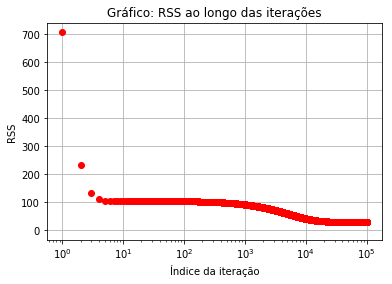

After 100000 iterations b = -39.4433220441, m = 5.5993081813, error = 29.82881661


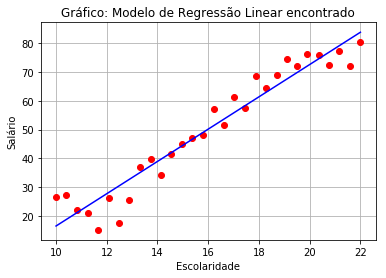

In [59]:

def run():
    points = genfromtxt("income.csv", delimiter=",", names=['year', 'salary'])
    # quão rápido deve ser o processo de aprendizagem
    learning_rate = 0.001
    # y = mx + b é o modelo linear que nós queremos
    initial_b = 0 # intercepta o y
    initial_m = 0 # a inclininação da reta
    num_iterations = 100000 # quantidade de repetições do treinamento
    print "Starting gradient descent at b = {0}, m = {1}, error = {2}, iterações = {3}, taxa de aprendizagem = {4}".format(initial_b, initial_m, compute_error_for_line_given_points(initial_b, initial_m, points), num_iterations, learning_rate)
    print "Running..."
    [b, m] = gradient_descent_runner(points, initial_b, initial_m, learning_rate, num_iterations)
    print "After {0} iterations b = {1}, m = {2}, error = {3}".format(num_iterations, b, m, compute_error_for_line_given_points(b, m, points))
    plot_graph(points, m, b)

if __name__ == '__main__':
    run()

Os parâmetros w0 = -39 e w1 = 5 foram encontradas com __100000 iterações (i)__ e __taxa de aprendizagem (t) 0.001__. Foram feitos 4 testes até encontrar estes valores: i = 1000 e t = 0.0001, i = 10000 e t = 0.001, i = 10000 e t = 0.01, i = 100000 e t = 0.001.

O último gráfico acima mostra que, com esses valores de parâmetros, o modelo apresenta um erro bem menor (29) e representa bem a relação existente nos dados.

### 5. Alterar critério de parada para o tamanho do gradiente

Como dito anteriormente, o critério de parada do algoritmo era o número de iterações que ele deveria executar. Agora, iremos alterá-lo para ser o tamanho do gradiente, ou seja, o algoritmo só irá parar quando o gradiente for menor do que um valor de tolerância predefinido (= 0.05).

Starting gradient descent at b = 0, m = 0, error = 2946.63449705, taxa de aprendizagem = 0.001
Running...
Iteração 1, gradient_length = 1751.19875011 
Iteração 2, gradient_length = 806.324471027 
Iteração 3, gradient_length = 371.277120022 
Iteração 4, gradient_length = 170.982741862 
Iteração 5, gradient_length = 78.7981473381 
Iteração 6, gradient_length = 36.4360175799 
Iteração 7, gradient_length = 17.1077929715 
Iteração 8, gradient_length = 8.55987486048 
Iteração 9, gradient_length = 5.17250950776 
Iteração 10, gradient_length = 4.10987554975 
Iteração 11, gradient_length = 3.84679036876 
Iteração 12, gradient_length = 3.78838772747 
Iteração 13, gradient_length = 3.77560769218 
Iteração 14, gradient_length = 3.77261009045 
Iteração 15, gradient_length = 3.77169163115 
Iteração 16, gradient_length = 3.77121425086 
Iteração 17, gradient_length = 3.77083042647 
Iteração 18, gradient_length = 3.7704664654 
Iteração 19, gradient_length = 3.7701067427 
Iteração 20, gradient_length = 

Iteração 201, gradient_length = 3.70540748312 
Iteração 202, gradient_length = 3.705055079 
Iteração 203, gradient_length = 3.70470270839 
Iteração 204, gradient_length = 3.70435037129 
Iteração 205, gradient_length = 3.7039980677 
Iteração 206, gradient_length = 3.70364579761 
Iteração 207, gradient_length = 3.70329356103 
Iteração 208, gradient_length = 3.70294135795 
Iteração 209, gradient_length = 3.70258918836 
Iteração 210, gradient_length = 3.70223705227 
Iteração 211, gradient_length = 3.70188494967 
Iteração 212, gradient_length = 3.70153288055 
Iteração 213, gradient_length = 3.70118084492 
Iteração 214, gradient_length = 3.70082884277 
Iteração 215, gradient_length = 3.7004768741 
Iteração 216, gradient_length = 3.7001249389 
Iteração 217, gradient_length = 3.69977303717 
Iteração 218, gradient_length = 3.69942116891 
Iteração 219, gradient_length = 3.69906933411 
Iteração 220, gradient_length = 3.69871753277 
Iteração 221, gradient_length = 3.6983657649 
Iteração 222, gradi

Iteração 1360, gradient_length = 3.31865929957 
Iteração 1361, gradient_length = 3.31834367727 
Iteração 1362, gradient_length = 3.31802808498 
Iteração 1363, gradient_length = 3.31771252271 
Iteração 1364, gradient_length = 3.31739699046 
Iteração 1365, gradient_length = 3.31708148821 
Iteração 1366, gradient_length = 3.31676601597 
Iteração 1367, gradient_length = 3.31645057373 
Iteração 1368, gradient_length = 3.31613516149 
Iteração 1369, gradient_length = 3.31581977925 
Iteração 1370, gradient_length = 3.315504427 
Iteração 1371, gradient_length = 3.31518910475 
Iteração 1372, gradient_length = 3.31487381248 
Iteração 1373, gradient_length = 3.3145585502 
Iteração 1374, gradient_length = 3.3142433179 
Iteração 1375, gradient_length = 3.31392811559 
Iteração 1376, gradient_length = 3.31361294325 
Iteração 1377, gradient_length = 3.31329780088 
Iteração 1378, gradient_length = 3.31298268849 
Iteração 1379, gradient_length = 3.31266760606 
Iteração 1380, gradient_length = 3.312352553

Iteração 1630, gradient_length = 3.23452215646 
Iteração 1631, gradient_length = 3.23421453606 
Iteração 1632, gradient_length = 3.23390694491 
Iteração 1633, gradient_length = 3.23359938301 
Iteração 1634, gradient_length = 3.23329185036 
Iteração 1635, gradient_length = 3.23298434697 
Iteração 1636, gradient_length = 3.23267687281 
Iteração 1637, gradient_length = 3.2323694279 
Iteração 1638, gradient_length = 3.23206201223 
Iteração 1639, gradient_length = 3.2317546258 
Iteração 1640, gradient_length = 3.2314472686 
Iteração 1641, gradient_length = 3.23113994063 
Iteração 1642, gradient_length = 3.23083264189 
Iteração 1643, gradient_length = 3.23052537238 
Iteração 1644, gradient_length = 3.23021813208 
Iteração 1645, gradient_length = 3.22991092101 
Iteração 1646, gradient_length = 3.22960373916 
Iteração 1647, gradient_length = 3.22929658652 
Iteração 1648, gradient_length = 3.22898946309 
Iteração 1649, gradient_length = 3.22868236888 
Iteração 1650, gradient_length = 3.22837530

Iteração 2668, gradient_length = 2.93045336782 
Iteração 2669, gradient_length = 2.93017466598 
Iteração 2670, gradient_length = 2.92989599065 
Iteração 2671, gradient_length = 2.92961734183 
Iteração 2672, gradient_length = 2.92933871951 
Iteração 2673, gradient_length = 2.92906012368 
Iteração 2674, gradient_length = 2.92878155435 
Iteração 2675, gradient_length = 2.92850301152 
Iteração 2676, gradient_length = 2.92822449517 
Iteração 2677, gradient_length = 2.92794600532 
Iteração 2678, gradient_length = 2.92766754195 
Iteração 2679, gradient_length = 2.92738910506 
Iteração 2680, gradient_length = 2.92711069465 
Iteração 2681, gradient_length = 2.92683231072 
Iteração 2682, gradient_length = 2.92655395327 
Iteração 2683, gradient_length = 2.92627562229 
Iteração 2684, gradient_length = 2.92599731779 
Iteração 2685, gradient_length = 2.92571903975 
Iteração 2686, gradient_length = 2.92544078817 
Iteração 2687, gradient_length = 2.92516256306 
Iteração 2688, gradient_length = 2.92488

Iteração 2873, gradient_length = 2.87387018339 
Iteração 2874, gradient_length = 2.87359686292 
Iteração 2875, gradient_length = 2.87332356845 
Iteração 2876, gradient_length = 2.87305029997 
Iteração 2877, gradient_length = 2.87277705747 
Iteração 2878, gradient_length = 2.87250384096 
Iteração 2879, gradient_length = 2.87223065044 
Iteração 2880, gradient_length = 2.8719574859 
Iteração 2881, gradient_length = 2.87168434734 
Iteração 2882, gradient_length = 2.87141123475 
Iteração 2883, gradient_length = 2.87113814814 
Iteração 2884, gradient_length = 2.8708650875 
Iteração 2885, gradient_length = 2.87059205283 
Iteração 2886, gradient_length = 2.87031904413 
Iteração 2887, gradient_length = 2.8700460614 
Iteração 2888, gradient_length = 2.86977310462 
Iteração 2889, gradient_length = 2.8695001738 
Iteração 2890, gradient_length = 2.86922726895 
Iteração 2891, gradient_length = 2.86895439004 
Iteração 2892, gradient_length = 2.86868153709 
Iteração 2893, gradient_length = 2.868408710

Iteração 4077, gradient_length = 2.56292020564 
Iteração 4078, gradient_length = 2.56267645818 
Iteração 4079, gradient_length = 2.5624327339 
Iteração 4080, gradient_length = 2.5621890328 
Iteração 4081, gradient_length = 2.56194535488 
Iteração 4082, gradient_length = 2.56170170014 
Iteração 4083, gradient_length = 2.56145806856 
Iteração 4084, gradient_length = 2.56121446016 
Iteração 4085, gradient_length = 2.56097087493 
Iteração 4086, gradient_length = 2.56072731286 
Iteração 4087, gradient_length = 2.56048377396 
Iteração 4088, gradient_length = 2.56024025822 
Iteração 4089, gradient_length = 2.55999676564 
Iteração 4090, gradient_length = 2.55975329621 
Iteração 4091, gradient_length = 2.55950984994 
Iteração 4092, gradient_length = 2.55926642683 
Iteração 4093, gradient_length = 2.55902302686 
Iteração 4094, gradient_length = 2.55877965005 
Iteração 4095, gradient_length = 2.55853629638 
Iteração 4096, gradient_length = 2.55829296585 
Iteração 4097, gradient_length = 2.5580496

Iteração 5655, gradient_length = 2.20574189463 
Iteração 5656, gradient_length = 2.20553211674 
Iteração 5657, gradient_length = 2.20532235881 
Iteração 5658, gradient_length = 2.20511262082 
Iteração 5659, gradient_length = 2.20490290278 
Iteração 5660, gradient_length = 2.20469320469 
Iteração 5661, gradient_length = 2.20448352654 
Iteração 5662, gradient_length = 2.20427386833 
Iteração 5663, gradient_length = 2.20406423006 
Iteração 5664, gradient_length = 2.20385461173 
Iteração 5665, gradient_length = 2.20364501334 
Iteração 5666, gradient_length = 2.20343543488 
Iteração 5667, gradient_length = 2.20322587635 
Iteração 5668, gradient_length = 2.20301633775 
Iteração 5669, gradient_length = 2.20280681908 
Iteração 5670, gradient_length = 2.20259732034 
Iteração 5671, gradient_length = 2.20238784152 
Iteração 5672, gradient_length = 2.20217838262 
Iteração 5673, gradient_length = 2.20196894364 
Iteração 5674, gradient_length = 2.20175952458 
Iteração 5675, gradient_length = 2.20155

Iteração 7156, gradient_length = 1.91229477254 
Iteração 7157, gradient_length = 1.91211290305 
Iteração 7158, gradient_length = 1.91193105086 
Iteração 7159, gradient_length = 1.91174921596 
Iteração 7160, gradient_length = 1.91156739835 
Iteração 7161, gradient_length = 1.91138559804 
Iteração 7162, gradient_length = 1.91120381502 
Iteração 7163, gradient_length = 1.91102204928 
Iteração 7164, gradient_length = 1.91084030083 
Iteração 7165, gradient_length = 1.91065856967 
Iteração 7166, gradient_length = 1.91047685579 
Iteração 7167, gradient_length = 1.9102951592 
Iteração 7168, gradient_length = 1.91011347988 
Iteração 7169, gradient_length = 1.90993181784 
Iteração 7170, gradient_length = 1.90975017308 
Iteração 7171, gradient_length = 1.9095685456 
Iteração 7172, gradient_length = 1.90938693539 
Iteração 7173, gradient_length = 1.90920534245 
Iteração 7174, gradient_length = 1.90902376678 
Iteração 7175, gradient_length = 1.90884220838 
Iteração 7176, gradient_length = 1.9086606

Iteração 8428, gradient_length = 1.69439237641 
Iteração 8429, gradient_length = 1.69423123061 
Iteração 8430, gradient_length = 1.69407010013 
Iteração 8431, gradient_length = 1.69390898498 
Iteração 8432, gradient_length = 1.69374788515 
Iteração 8433, gradient_length = 1.69358680064 
Iteração 8434, gradient_length = 1.69342573145 
Iteração 8435, gradient_length = 1.69326467758 
Iteração 8436, gradient_length = 1.69310363903 
Iteração 8437, gradient_length = 1.69294261579 
Iteração 8438, gradient_length = 1.69278160787 
Iteração 8439, gradient_length = 1.69262061526 
Iteração 8440, gradient_length = 1.69245963796 
Iteração 8441, gradient_length = 1.69229867597 
Iteração 8442, gradient_length = 1.69213772928 
Iteração 8443, gradient_length = 1.69197679791 
Iteração 8444, gradient_length = 1.69181588184 
Iteração 8445, gradient_length = 1.69165498108 
Iteração 8446, gradient_length = 1.69149409561 
Iteração 8447, gradient_length = 1.69133322545 
Iteração 8448, gradient_length = 1.69117

Iteração 9733, gradient_length = 1.49661485493 
Iteração 9734, gradient_length = 1.49647251882 
Iteração 9735, gradient_length = 1.49633019626 
Iteração 9736, gradient_length = 1.49618788723 
Iteração 9737, gradient_length = 1.49604559174 
Iteração 9738, gradient_length = 1.49590330978 
Iteração 9739, gradient_length = 1.49576104135 
Iteração 9740, gradient_length = 1.49561878645 
Iteração 9741, gradient_length = 1.49547654508 
Iteração 9742, gradient_length = 1.49533431724 
Iteração 9743, gradient_length = 1.49519210293 
Iteração 9744, gradient_length = 1.49504990214 
Iteração 9745, gradient_length = 1.49490771487 
Iteração 9746, gradient_length = 1.49476554113 
Iteração 9747, gradient_length = 1.49462338091 
Iteração 9748, gradient_length = 1.49448123421 
Iteração 9749, gradient_length = 1.49433910103 
Iteração 9750, gradient_length = 1.49419698136 
Iteração 9751, gradient_length = 1.49405487522 
Iteração 9752, gradient_length = 1.49391278258 
Iteração 9753, gradient_length = 1.49377

Iteração 11152, gradient_length = 1.30766730295 
Iteração 11153, gradient_length = 1.30754293677 
Iteração 11154, gradient_length = 1.30741858242 
Iteração 11155, gradient_length = 1.3072942399 
Iteração 11156, gradient_length = 1.30716990921 
Iteração 11157, gradient_length = 1.30704559034 
Iteração 11158, gradient_length = 1.30692128329 
Iteração 11159, gradient_length = 1.30679698807 
Iteração 11160, gradient_length = 1.30667270467 
Iteração 11161, gradient_length = 1.30654843308 
Iteração 11162, gradient_length = 1.30642417332 
Iteração 11163, gradient_length = 1.30629992537 
Iteração 11164, gradient_length = 1.30617568924 
Iteração 11165, gradient_length = 1.30605146493 
Iteração 11166, gradient_length = 1.30592725243 
Iteração 11167, gradient_length = 1.30580305174 
Iteração 11168, gradient_length = 1.30567886287 
Iteração 11169, gradient_length = 1.3055546858 
Iteração 11170, gradient_length = 1.30543052055 
Iteração 11171, gradient_length = 1.30530636711 
Iteração 11172, gradie

Iteração 12447, gradient_length = 1.15612923829 
Iteração 12448, gradient_length = 1.1560192842 
Iteração 12449, gradient_length = 1.15590934056 
Iteração 12450, gradient_length = 1.15579940738 
Iteração 12451, gradient_length = 1.15568948466 
Iteração 12452, gradient_length = 1.15557957239 
Iteração 12453, gradient_length = 1.15546967057 
Iteração 12454, gradient_length = 1.15535977921 
Iteração 12455, gradient_length = 1.1552498983 
Iteração 12456, gradient_length = 1.15514002784 
Iteração 12457, gradient_length = 1.15503016782 
Iteração 12458, gradient_length = 1.15492031826 
Iteração 12459, gradient_length = 1.15481047914 
Iteração 12460, gradient_length = 1.15470065047 
Iteração 12461, gradient_length = 1.15459083225 
Iteração 12462, gradient_length = 1.15448102446 
Iteração 12463, gradient_length = 1.15437122713 
Iteração 12464, gradient_length = 1.15426144023 
Iteração 12465, gradient_length = 1.15415166378 
Iteração 12466, gradient_length = 1.15404189776 
Iteração 12467, gradie

Iteração 14035, gradient_length = 0.994060769089 
Iteração 14036, gradient_length = 0.993966228578 
Iteração 14037, gradient_length = 0.993871697058 
Iteração 14038, gradient_length = 0.993777174528 
Iteração 14039, gradient_length = 0.993682660989 
Iteração 14040, gradient_length = 0.993588156437 
Iteração 14041, gradient_length = 0.993493660874 
Iteração 14042, gradient_length = 0.993399174298 
Iteração 14043, gradient_length = 0.993304696708 
Iteração 14044, gradient_length = 0.993210228103 
Iteração 14045, gradient_length = 0.993115768483 
Iteração 14046, gradient_length = 0.993021317847 
Iteração 14047, gradient_length = 0.992926876193 
Iteração 14048, gradient_length = 0.992832443521 
Iteração 14049, gradient_length = 0.99273801983 
Iteração 14050, gradient_length = 0.992643605119 
Iteração 14051, gradient_length = 0.992549199388 
Iteração 14052, gradient_length = 0.992454802635 
Iteração 14053, gradient_length = 0.99236041486 
Iteração 14054, gradient_length = 0.992266036062 
It

Iteração 15597, gradient_length = 0.856827570979 
Iteração 15598, gradient_length = 0.856746082081 
Iteração 15599, gradient_length = 0.856664600933 
Iteração 15600, gradient_length = 0.856583127534 
Iteração 15601, gradient_length = 0.856501661884 
Iteração 15602, gradient_length = 0.856420203982 
Iteração 15603, gradient_length = 0.856338753827 
Iteração 15604, gradient_length = 0.856257311418 
Iteração 15605, gradient_length = 0.856175876755 
Iteração 15606, gradient_length = 0.856094449836 
Iteração 15607, gradient_length = 0.856013030662 
Iteração 15608, gradient_length = 0.855931619231 
Iteração 15609, gradient_length = 0.855850215543 
Iteração 15610, gradient_length = 0.855768819597 
Iteração 15611, gradient_length = 0.855687431392 
Iteração 15612, gradient_length = 0.855606050927 
Iteração 15613, gradient_length = 0.855524678203 
Iteração 15614, gradient_length = 0.855443313217 
Iteração 15615, gradient_length = 0.855361955969 
Iteração 15616, gradient_length = 0.855280606459 


Iteração 17022, gradient_length = 0.748226028186 
Iteração 17023, gradient_length = 0.748154867877 
Iteração 17024, gradient_length = 0.748083714336 
Iteração 17025, gradient_length = 0.748012567562 
Iteração 17026, gradient_length = 0.747941427555 
Iteração 17027, gradient_length = 0.747870294313 
Iteração 17028, gradient_length = 0.747799167837 
Iteração 17029, gradient_length = 0.747728048125 
Iteração 17030, gradient_length = 0.747656935177 
Iteração 17031, gradient_length = 0.747585828992 
Iteração 17032, gradient_length = 0.747514729569 
Iteração 17033, gradient_length = 0.747443636909 
Iteração 17034, gradient_length = 0.74737255101 
Iteração 17035, gradient_length = 0.747301471871 
Iteração 17036, gradient_length = 0.747230399493 
Iteração 17037, gradient_length = 0.747159333874 
Iteração 17038, gradient_length = 0.747088275014 
Iteração 17039, gradient_length = 0.747017222911 
Iteração 17040, gradient_length = 0.746946177566 
Iteração 17041, gradient_length = 0.746875138978 
I

Iteração 18657, gradient_length = 0.640468823087 
Iteração 18658, gradient_length = 0.640407911067 
Iteração 18659, gradient_length = 0.640347004839 
Iteração 18660, gradient_length = 0.640286104404 
Iteração 18661, gradient_length = 0.640225209761 
Iteração 18662, gradient_length = 0.64016432091 
Iteração 18663, gradient_length = 0.640103437849 
Iteração 18664, gradient_length = 0.640042560579 
Iteração 18665, gradient_length = 0.639981689098 
Iteração 18666, gradient_length = 0.639920823406 
Iteração 18667, gradient_length = 0.639859963504 
Iteração 18668, gradient_length = 0.639799109389 
Iteração 18669, gradient_length = 0.639738261062 
Iteração 18670, gradient_length = 0.639677418522 
Iteração 18671, gradient_length = 0.639616581768 
Iteração 18672, gradient_length = 0.6395557508 
Iteração 18673, gradient_length = 0.639494925618 
Iteração 18674, gradient_length = 0.63943410622 
Iteração 18675, gradient_length = 0.639373292607 
Iteração 18676, gradient_length = 0.639312484777 
Iter

Iteração 19760, gradient_length = 0.576683874872 
Iteração 19761, gradient_length = 0.576629029142 
Iteração 19762, gradient_length = 0.576574188629 
Iteração 19763, gradient_length = 0.576519353331 
Iteração 19764, gradient_length = 0.576464523248 
Iteração 19765, gradient_length = 0.576409698379 
Iteração 19766, gradient_length = 0.576354878725 
Iteração 19767, gradient_length = 0.576300064285 
Iteração 19768, gradient_length = 0.576245255057 
Iteração 19769, gradient_length = 0.576190451043 
Iteração 19770, gradient_length = 0.57613565224 
Iteração 19771, gradient_length = 0.576080858649 
Iteração 19772, gradient_length = 0.57602607027 
Iteração 19773, gradient_length = 0.575971287101 
Iteração 19774, gradient_length = 0.575916509142 
Iteração 19775, gradient_length = 0.575861736393 
Iteração 19776, gradient_length = 0.575806968853 
Iteração 19777, gradient_length = 0.575752206521 
Iteração 19778, gradient_length = 0.575697449398 
Iteração 19779, gradient_length = 0.575642697483 
It

Iteração 21155, gradient_length = 0.505029047396 
Iteração 21156, gradient_length = 0.504981016425 
Iteração 21157, gradient_length = 0.504932990021 
Iteração 21158, gradient_length = 0.504884968186 
Iteração 21159, gradient_length = 0.504836950917 
Iteração 21160, gradient_length = 0.504788938215 
Iteração 21161, gradient_length = 0.504740930079 
Iteração 21162, gradient_length = 0.504692926509 
Iteração 21163, gradient_length = 0.504644927505 
Iteração 21164, gradient_length = 0.504596933065 
Iteração 21165, gradient_length = 0.504548943191 
Iteração 21166, gradient_length = 0.50450095788 
Iteração 21167, gradient_length = 0.504452977132 
Iteração 21168, gradient_length = 0.504405000949 
Iteração 21169, gradient_length = 0.504357029327 
Iteração 21170, gradient_length = 0.504309062269 
Iteração 21171, gradient_length = 0.504261099772 
Iteração 21172, gradient_length = 0.504213141836 
Iteração 21173, gradient_length = 0.504165188462 
Iteração 21174, gradient_length = 0.504117239648 
I

Iteração 22603, gradient_length = 0.440053729185 
Iteração 22604, gradient_length = 0.440011877715 
Iteração 22605, gradient_length = 0.439970030225 
Iteração 22606, gradient_length = 0.439928186715 
Iteração 22607, gradient_length = 0.439886347185 
Iteração 22608, gradient_length = 0.439844511634 
Iteração 22609, gradient_length = 0.439802680061 
Iteração 22610, gradient_length = 0.439760852467 
Iteração 22611, gradient_length = 0.439719028851 
Iteração 22612, gradient_length = 0.439677209213 
Iteração 22613, gradient_length = 0.439635393552 
Iteração 22614, gradient_length = 0.439593581868 
Iteração 22615, gradient_length = 0.439551774161 
Iteração 22616, gradient_length = 0.439509970429 
Iteração 22617, gradient_length = 0.439468170673 
Iteração 22618, gradient_length = 0.439426374893 
Iteração 22619, gradient_length = 0.439384583088 
Iteração 22620, gradient_length = 0.439342795257 
Iteração 22621, gradient_length = 0.439301011401 
Iteração 22622, gradient_length = 0.439259231518 


Iteração 23970, gradient_length = 0.386403289727 
Iteração 23971, gradient_length = 0.386366540702 
Iteração 23972, gradient_length = 0.386329795171 
Iteração 23973, gradient_length = 0.386293053136 
Iteração 23974, gradient_length = 0.386256314594 
Iteração 23975, gradient_length = 0.386219579547 
Iteração 23976, gradient_length = 0.386182847993 
Iteração 23977, gradient_length = 0.386146119933 
Iteração 23978, gradient_length = 0.386109395366 
Iteração 23979, gradient_length = 0.386072674291 
Iteração 23980, gradient_length = 0.386035956709 
Iteração 23981, gradient_length = 0.385999242619 
Iteração 23982, gradient_length = 0.38596253202 
Iteração 23983, gradient_length = 0.385925824913 
Iteração 23984, gradient_length = 0.385889121297 
Iteração 23985, gradient_length = 0.385852421172 
Iteração 23986, gradient_length = 0.385815724537 
Iteração 23987, gradient_length = 0.385779031392 
Iteração 23988, gradient_length = 0.385742341737 
Iteração 23989, gradient_length = 0.385705655571 
I

Iteração 25352, gradient_length = 0.338810092954 
Iteração 25353, gradient_length = 0.338777870297 
Iteração 25354, gradient_length = 0.338745650705 
Iteração 25355, gradient_length = 0.338713434176 
Iteração 25356, gradient_length = 0.338681220712 
Iteração 25357, gradient_length = 0.338649010311 
Iteração 25358, gradient_length = 0.338616802974 
Iteração 25359, gradient_length = 0.338584598699 
Iteração 25360, gradient_length = 0.338552397488 
Iteração 25361, gradient_length = 0.338520199339 
Iteração 25362, gradient_length = 0.338488004252 
Iteração 25363, gradient_length = 0.338455812227 
Iteração 25364, gradient_length = 0.338423623264 
Iteração 25365, gradient_length = 0.338391437362 
Iteração 25366, gradient_length = 0.338359254521 
Iteração 25367, gradient_length = 0.338327074741 
Iteração 25368, gradient_length = 0.338294898022 
Iteração 25369, gradient_length = 0.338262724362 
Iteração 25370, gradient_length = 0.338230553763 
Iteração 25371, gradient_length = 0.338198386223 


Iteração 26726, gradient_length = 0.297305065522 
Iteração 26727, gradient_length = 0.297276790215 
Iteração 26728, gradient_length = 0.297248517598 
Iteração 26729, gradient_length = 0.29722024767 
Iteração 26730, gradient_length = 0.29719198043 
Iteração 26731, gradient_length = 0.297163715878 
Iteração 26732, gradient_length = 0.297135454015 
Iteração 26733, gradient_length = 0.29710719484 
Iteração 26734, gradient_length = 0.297078938352 
Iteração 26735, gradient_length = 0.297050684551 
Iteração 26736, gradient_length = 0.297022433438 
Iteração 26737, gradient_length = 0.296994185011 
Iteração 26738, gradient_length = 0.296965939271 
Iteração 26739, gradient_length = 0.296937696217 
Iteração 26740, gradient_length = 0.29690945585 
Iteração 26741, gradient_length = 0.296881218168 
Iteração 26742, gradient_length = 0.296852983171 
Iteração 26743, gradient_length = 0.29682475086 
Iteração 26744, gradient_length = 0.296796521235 
Iteração 26745, gradient_length = 0.296768294293 
Itera

Iteração 28153, gradient_length = 0.259572736966 
Iteração 28154, gradient_length = 0.259548050206 
Iteração 28155, gradient_length = 0.259523365794 
Iteração 28156, gradient_length = 0.25949868373 
Iteração 28157, gradient_length = 0.259474004013 
Iteração 28158, gradient_length = 0.259449326644 
Iteração 28159, gradient_length = 0.259424651621 
Iteração 28160, gradient_length = 0.259399978945 
Iteração 28161, gradient_length = 0.259375308616 
Iteração 28162, gradient_length = 0.259350640633 
Iteração 28163, gradient_length = 0.259325974996 
Iteração 28164, gradient_length = 0.259301311704 
Iteração 28165, gradient_length = 0.259276650759 
Iteração 28166, gradient_length = 0.259251992159 
Iteração 28167, gradient_length = 0.259227335904 
Iteração 28168, gradient_length = 0.259202681993 
Iteração 28169, gradient_length = 0.259178030428 
Iteração 28170, gradient_length = 0.259153381207 
Iteração 28171, gradient_length = 0.259128734331 
Iteração 28172, gradient_length = 0.259104089798 
I

Iteração 29497, gradient_length = 0.228425306839 
Iteração 29498, gradient_length = 0.228403582367 
Iteração 29499, gradient_length = 0.228381859961 
Iteração 29500, gradient_length = 0.228360139621 
Iteração 29501, gradient_length = 0.228338421347 
Iteração 29502, gradient_length = 0.228316705139 
Iteração 29503, gradient_length = 0.228294990995 
Iteração 29504, gradient_length = 0.228273278917 
Iteração 29505, gradient_length = 0.228251568904 
Iteração 29506, gradient_length = 0.228229860955 
Iteração 29507, gradient_length = 0.228208155071 
Iteração 29508, gradient_length = 0.228186451252 
Iteração 29509, gradient_length = 0.228164749496 
Iteração 29510, gradient_length = 0.228143049805 
Iteração 29511, gradient_length = 0.228121352177 
Iteração 29512, gradient_length = 0.228099656613 
Iteração 29513, gradient_length = 0.228077963112 
Iteração 29514, gradient_length = 0.228056271674 
Iteração 29515, gradient_length = 0.228034582299 
Iteração 29516, gradient_length = 0.228012894987 


Iteração 31084, gradient_length = 0.196422879186 
Iteração 31085, gradient_length = 0.196404198316 
Iteração 31086, gradient_length = 0.196385519223 
Iteração 31087, gradient_length = 0.196366841907 
Iteração 31088, gradient_length = 0.196348166367 
Iteração 31089, gradient_length = 0.196329492603 
Iteração 31090, gradient_length = 0.196310820616 
Iteração 31091, gradient_length = 0.196292150404 
Iteração 31092, gradient_length = 0.196273481967 
Iteração 31093, gradient_length = 0.196254815306 
Iteração 31094, gradient_length = 0.196236150421 
Iteração 31095, gradient_length = 0.19621748731 
Iteração 31096, gradient_length = 0.196198825975 
Iteração 31097, gradient_length = 0.196180166414 
Iteração 31098, gradient_length = 0.196161508628 
Iteração 31099, gradient_length = 0.196142852616 
Iteração 31100, gradient_length = 0.196124198379 
Iteração 31101, gradient_length = 0.196105545915 
Iteração 31102, gradient_length = 0.196086895226 
Iteração 31103, gradient_length = 0.196068246311 
I

Iteração 32643, gradient_length = 0.16935440134 
Iteração 32644, gradient_length = 0.169338294828 
Iteração 32645, gradient_length = 0.169322189848 
Iteração 32646, gradient_length = 0.169306086399 
Iteração 32647, gradient_length = 0.169289984482 
Iteração 32648, gradient_length = 0.169273884097 
Iteração 32649, gradient_length = 0.169257785242 
Iteração 32650, gradient_length = 0.169241687919 
Iteração 32651, gradient_length = 0.169225592127 
Iteração 32652, gradient_length = 0.169209497865 
Iteração 32653, gradient_length = 0.169193405134 
Iteração 32654, gradient_length = 0.169177313934 
Iteração 32655, gradient_length = 0.169161224264 
Iteração 32656, gradient_length = 0.169145136124 
Iteração 32657, gradient_length = 0.169129049514 
Iteração 32658, gradient_length = 0.169112964435 
Iteração 32659, gradient_length = 0.169096880884 
Iteração 32660, gradient_length = 0.169080798864 
Iteração 32661, gradient_length = 0.169064718373 
Iteração 32662, gradient_length = 0.169048639412 
I

Iteração 34095, gradient_length = 0.147509711311 
Iteração 34096, gradient_length = 0.147495682346 
Iteração 34097, gradient_length = 0.147481654716 
Iteração 34098, gradient_length = 0.147467628419 
Iteração 34099, gradient_length = 0.147453603457 
Iteração 34100, gradient_length = 0.147439579828 
Iteração 34101, gradient_length = 0.147425557533 
Iteração 34102, gradient_length = 0.147411536572 
Iteração 34103, gradient_length = 0.147397516944 
Iteração 34104, gradient_length = 0.147383498649 
Iteração 34105, gradient_length = 0.147369481688 
Iteração 34106, gradient_length = 0.14735546606 
Iteração 34107, gradient_length = 0.147341451765 
Iteração 34108, gradient_length = 0.147327438802 
Iteração 34109, gradient_length = 0.147313427173 
Iteração 34110, gradient_length = 0.147299416876 
Iteração 34111, gradient_length = 0.147285407911 
Iteração 34112, gradient_length = 0.147271400279 
Iteração 34113, gradient_length = 0.147257393979 
Iteração 34114, gradient_length = 0.14724338901 
It

Iteração 35461, gradient_length = 0.129537952505 
Iteração 35462, gradient_length = 0.129525632751 
Iteração 35463, gradient_length = 0.129513314169 
Iteração 35464, gradient_length = 0.129500996758 
Iteração 35465, gradient_length = 0.129488680519 
Iteração 35466, gradient_length = 0.12947636545 
Iteração 35467, gradient_length = 0.129464051554 
Iteração 35468, gradient_length = 0.129451738828 
Iteração 35469, gradient_length = 0.129439427273 
Iteração 35470, gradient_length = 0.129427116889 
Iteração 35471, gradient_length = 0.129414807676 
Iteração 35472, gradient_length = 0.129402499634 
Iteração 35473, gradient_length = 0.129390192762 
Iteração 35474, gradient_length = 0.129377887061 
Iteração 35475, gradient_length = 0.12936558253 
Iteração 35476, gradient_length = 0.129353279169 
Iteração 35477, gradient_length = 0.129340976978 
Iteração 35478, gradient_length = 0.129328675957 
Iteração 35479, gradient_length = 0.129316376107 
Iteração 35480, gradient_length = 0.129304077426 
It

Iteração 36882, gradient_length = 0.113162264612 
Iteração 36883, gradient_length = 0.113151502273 
Iteração 36884, gradient_length = 0.113140740959 
Iteração 36885, gradient_length = 0.113129980667 
Iteração 36886, gradient_length = 0.113119221399 
Iteração 36887, gradient_length = 0.113108463154 
Iteração 36888, gradient_length = 0.113097705933 
Iteração 36889, gradient_length = 0.113086949734 
Iteração 36890, gradient_length = 0.113076194559 
Iteração 36891, gradient_length = 0.113065440406 
Iteração 36892, gradient_length = 0.113054687276 
Iteração 36893, gradient_length = 0.113043935169 
Iteração 36894, gradient_length = 0.113033184085 
Iteração 36895, gradient_length = 0.113022434023 
Iteração 36896, gradient_length = 0.113011684983 
Iteração 36897, gradient_length = 0.113000936965 
Iteração 36898, gradient_length = 0.11299018997 
Iteração 36899, gradient_length = 0.112979443997 
Iteração 36900, gradient_length = 0.112968699046 
Iteração 36901, gradient_length = 0.112957955117 
I

Iteração 38319, gradient_length = 0.098706406336 
Iteração 38320, gradient_length = 0.0986970188273 
Iteração 38321, gradient_length = 0.0986876322114 
Iteração 38322, gradient_length = 0.0986782464882 
Iteração 38323, gradient_length = 0.0986688616577 
Iteração 38324, gradient_length = 0.0986594777197 
Iteração 38325, gradient_length = 0.0986500946741 
Iteração 38326, gradient_length = 0.098640712521 
Iteração 38327, gradient_length = 0.0986313312601 
Iteração 38328, gradient_length = 0.0986219508915 
Iteração 38329, gradient_length = 0.0986125714149 
Iteração 38330, gradient_length = 0.0986031928304 
Iteração 38331, gradient_length = 0.0985938151379 
Iteração 38332, gradient_length = 0.0985844383372 
Iteração 38333, gradient_length = 0.0985750624284 
Iteração 38334, gradient_length = 0.0985656874112 
Iteração 38335, gradient_length = 0.0985563132856 
Iteração 38336, gradient_length = 0.0985469400516 
Iteração 38337, gradient_length = 0.098537567709 
Iteração 38338, gradient_length = 

Iteração 40038, gradient_length = 0.0838186851855 
Iteração 40039, gradient_length = 0.083810713579 
Iteração 40040, gradient_length = 0.0838027427305 
Iteração 40041, gradient_length = 0.0837947726402 
Iteração 40042, gradient_length = 0.0837868033078 
Iteração 40043, gradient_length = 0.0837788347334 
Iteração 40044, gradient_length = 0.0837708669169 
Iteração 40045, gradient_length = 0.0837628998581 
Iteração 40046, gradient_length = 0.083754933557 
Iteração 40047, gradient_length = 0.0837469680136 
Iteração 40048, gradient_length = 0.0837390032277 
Iteração 40049, gradient_length = 0.0837310391993 
Iteração 40050, gradient_length = 0.0837230759284 
Iteração 40051, gradient_length = 0.0837151134148 
Iteração 40052, gradient_length = 0.0837071516584 
Iteração 40053, gradient_length = 0.0836991906593 
Iteração 40054, gradient_length = 0.0836912304173 
Iteração 40055, gradient_length = 0.0836832709324 
Iteração 40056, gradient_length = 0.0836753122045 
Iteração 40057, gradient_length =

Iteração 41648, gradient_length = 0.0719181767373 
Iteração 41649, gradient_length = 0.071911336933 
Iteração 41650, gradient_length = 0.0719044977791 
Iteração 41651, gradient_length = 0.0718976592757 
Iteração 41652, gradient_length = 0.0718908214226 
Iteração 41653, gradient_length = 0.0718839842199 
Iteração 41654, gradient_length = 0.0718771476674 
Iteração 41655, gradient_length = 0.0718703117651 
Iteração 41656, gradient_length = 0.071863476513 
Iteração 41657, gradient_length = 0.0718566419109 
Iteração 41658, gradient_length = 0.0718498079588 
Iteração 41659, gradient_length = 0.0718429746567 
Iteração 41660, gradient_length = 0.0718361420044 
Iteração 41661, gradient_length = 0.071829310002 
Iteração 41662, gradient_length = 0.0718224786493 
Iteração 41663, gradient_length = 0.0718156479464 
Iteração 41664, gradient_length = 0.071808817893 
Iteração 41665, gradient_length = 0.0718019884893 
Iteração 41666, gradient_length = 0.071795159735 
Iteração 41667, gradient_length = 0.

Iteração 43415, gradient_length = 0.0607927092871 
Iteração 43416, gradient_length = 0.0607869275743 
Iteração 43417, gradient_length = 0.0607811464114 
Iteração 43418, gradient_length = 0.0607753657984 
Iteração 43419, gradient_length = 0.0607695857351 
Iteração 43420, gradient_length = 0.0607638062216 
Iteração 43421, gradient_length = 0.0607580272576 
Iteração 43422, gradient_length = 0.0607522488434 
Iteração 43423, gradient_length = 0.0607464709786 
Iteração 43424, gradient_length = 0.0607406936634 
Iteração 43425, gradient_length = 0.0607349168976 
Iteração 43426, gradient_length = 0.0607291406812 
Iteração 43427, gradient_length = 0.0607233650142 
Iteração 43428, gradient_length = 0.0607175898965 
Iteração 43429, gradient_length = 0.060711815328 
Iteração 43430, gradient_length = 0.0607060413087 
Iteração 43431, gradient_length = 0.0607002678386 
Iteração 43432, gradient_length = 0.0606944949175 
Iteração 43433, gradient_length = 0.0606887225455 
Iteração 43434, gradient_length 

Iteração 45147, gradient_length = 0.0515596579966 
Iteração 45148, gradient_length = 0.0515547543966 
Iteração 45149, gradient_length = 0.0515498512629 
Iteração 45150, gradient_length = 0.0515449485955 
Iteração 45151, gradient_length = 0.0515400463944 
Iteração 45152, gradient_length = 0.0515351446596 
Iteração 45153, gradient_length = 0.0515302433909 
Iteração 45154, gradient_length = 0.0515253425883 
Iteração 45155, gradient_length = 0.0515204422519 
Iteração 45156, gradient_length = 0.0515155423815 
Iteração 45157, gradient_length = 0.0515106429771 
Iteração 45158, gradient_length = 0.0515057440386 
Iteração 45159, gradient_length = 0.0515008455661 
Iteração 45160, gradient_length = 0.0514959475594 
Iteração 45161, gradient_length = 0.0514910500186 
Iteração 45162, gradient_length = 0.0514861529435 
Iteração 45163, gradient_length = 0.0514812563342 
Iteração 45164, gradient_length = 0.0514763601906 
Iteração 45165, gradient_length = 0.0514714645126 
Iteração 45166, gradient_length

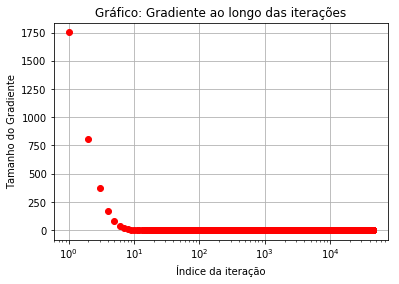

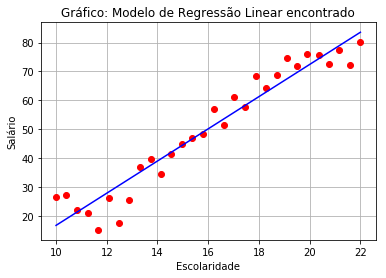

After 45470 iterations b = -38.9215049821, m = 5.56824547747, error = 29.8419569128


In [60]:

def step_gradient(b_current, m_current, points, learningRate):
    b_gradient = 0
    m_gradient = 0
    
    # gradient descent
    # cálculo das derivadas parciais
    N = float(len(points))
    for i in range(0, len(points)):
        x = points['year'][i]
        y = points['salary'][i]
        b_gradient += -(2/N) * (y - ((m_current * x) + b_current)) # o quanto b vai alterar
        m_gradient += -(2/N) * x * (y - ((m_current * x) + b_current)) # o quanto m vai alterar
    new_b = b_current - (learningRate * b_gradient)
    new_m = m_current - (learningRate * m_gradient)
    return [new_b, new_m, b_gradient, m_gradient]

def plot_gradient(values):

    plt.plot(values, 'ro')

    plt.grid(True)
    plt.title(u"Gráfico: Gradiente ao longo das iterações")
    plt.xlabel(u"Índice da iteração")
    plt.xscale('log')
    plt.ylabel("Tamanho do Gradiente")
    
    plt.show()
    
    
def gradient_descent_runner(points, starting_b, starting_m, learning_rate, tolerance):
    b = starting_b
    m = starting_m
    step = 0
    gradient_length = tolerance
    gradient_array = []
    gradient_array.append(0)
    
    # 4- Alteração do critério de parada do algoritmo
    while (gradient_length >= tolerance):
        step += 1
        b, m, b_gradient, m_gradient = step_gradient(b, m, array(points), learning_rate)
        gradient_length = math.sqrt(b_gradient**2 + m_gradient**2)
        gradient_array.append(gradient_length)
        
        # 2- Impressão do RSS a cada iteração do gradiente descendente
        print "Iteração {0}, gradient_length = {1} ".format(step, gradient_length)
        
    plot_gradient(gradient_array)
    return [b, m, step]

def run():
    points = genfromtxt("income.csv", delimiter=",", names=['year', 'salary'])
    # quão rápido deve ser o processo de aprendizagem
    learning_rate = 0.001
    # y = mx + b é o modelo linear que nós queremos
    initial_b = 0 # intercepta o y
    initial_m = 0 # a inclininação da reta
    tolerance = 0.05
    print "Starting gradient descent at b = {0}, m = {1}, error = {2}, taxa de aprendizagem = {3}".format(initial_b, initial_m, compute_error_for_line_given_points(initial_b, initial_m, points), learning_rate)
    print "Running..."
    [b, m, steps] = gradient_descent_runner(points, initial_b, initial_m, learning_rate, tolerance)
    plot_graph(points, m, b)
    print "After {0} iterations b = {1}, m = {2}, error = {3}".format(steps, b, m, compute_error_for_line_given_points(b, m, points))

if __name__ == '__main__':
    run()

Alterando o critério de parada, o algoritmo precisou de 45470 iterações para encontrar um modelo aceitável, mostrado no gráfico acima.

No gráfico do gradiente (primeiro logo acima), é possível perceber que ao longo das iterações o tamanho do gradiente diminui.

### 6. Encontrar um valor de tolerância para se aproximar dos parâmetros w0 = -39 e w1 = 5  

Starting gradient descent at b = 0, m = 0, error = 2946.63449705, taxa de aprendizagem = 0.001
Running...
Iteração 1, gradient_length = 1751.19875011 
Iteração 2, gradient_length = 806.324471027 
Iteração 3, gradient_length = 371.277120022 
Iteração 4, gradient_length = 170.982741862 
Iteração 5, gradient_length = 78.7981473381 
Iteração 6, gradient_length = 36.4360175799 
Iteração 7, gradient_length = 17.1077929715 
Iteração 8, gradient_length = 8.55987486048 
Iteração 9, gradient_length = 5.17250950776 
Iteração 10, gradient_length = 4.10987554975 
Iteração 11, gradient_length = 3.84679036876 
Iteração 12, gradient_length = 3.78838772747 
Iteração 13, gradient_length = 3.77560769218 
Iteração 14, gradient_length = 3.77261009045 
Iteração 15, gradient_length = 3.77169163115 
Iteração 16, gradient_length = 3.77121425086 
Iteração 17, gradient_length = 3.77083042647 
Iteração 18, gradient_length = 3.7704664654 
Iteração 19, gradient_length = 3.7701067427 
Iteração 20, gradient_length = 

Iteração 1249, gradient_length = 3.35388063314 
Iteração 1250, gradient_length = 3.3535616611 
Iteração 1251, gradient_length = 3.3532427194 
Iteração 1252, gradient_length = 3.35292380803 
Iteração 1253, gradient_length = 3.35260492699 
Iteração 1254, gradient_length = 3.35228607628 
Iteração 1255, gradient_length = 3.35196725589 
Iteração 1256, gradient_length = 3.35164846582 
Iteração 1257, gradient_length = 3.35132970608 
Iteração 1258, gradient_length = 3.35101097665 
Iteração 1259, gradient_length = 3.35069227753 
Iteração 1260, gradient_length = 3.35037360872 
Iteração 1261, gradient_length = 3.35005497022 
Iteração 1262, gradient_length = 3.34973636202 
Iteração 1263, gradient_length = 3.34941778413 
Iteração 1264, gradient_length = 3.34909923653 
Iteração 1265, gradient_length = 3.34878071923 
Iteração 1266, gradient_length = 3.34846223222 
Iteração 1267, gradient_length = 3.3481437755 
Iteração 1268, gradient_length = 3.34782534907 
Iteração 1269, gradient_length = 3.34750695

Iteração 1427, gradient_length = 3.2975788373 
Iteração 1428, gradient_length = 3.29726521986 
Iteração 1429, gradient_length = 3.29695163226 
Iteração 1430, gradient_length = 3.29663807447 
Iteração 1431, gradient_length = 3.29632454651 
Iteração 1432, gradient_length = 3.29601104836 
Iteração 1433, gradient_length = 3.29569758003 
Iteração 1434, gradient_length = 3.29538414151 
Iteração 1435, gradient_length = 3.29507073281 
Iteração 1436, gradient_length = 3.2947573539 
Iteração 1437, gradient_length = 3.29444400481 
Iteração 1438, gradient_length = 3.29413068551 
Iteração 1439, gradient_length = 3.29381739601 
Iteração 1440, gradient_length = 3.29350413631 
Iteração 1441, gradient_length = 3.2931909064 
Iteração 1442, gradient_length = 3.29287770628 
Iteração 1443, gradient_length = 3.29256453595 
Iteração 1444, gradient_length = 3.2922513954 
Iteração 1445, gradient_length = 3.29193828463 
Iteração 1446, gradient_length = 3.29162520365 
Iteração 1447, gradient_length = 3.291312152

Iteração 2964, gradient_length = 2.84910416737 
Iteração 2965, gradient_length = 2.84883320228 
Iteração 2966, gradient_length = 2.84856226297 
Iteração 2967, gradient_length = 2.84829134941 
Iteração 2968, gradient_length = 2.84802046163 
Iteração 2969, gradient_length = 2.84774959961 
Iteração 2970, gradient_length = 2.84747876335 
Iteração 2971, gradient_length = 2.84720795284 
Iteração 2972, gradient_length = 2.84693716809 
Iteração 2973, gradient_length = 2.8466664091 
Iteração 2974, gradient_length = 2.84639567585 
Iteração 2975, gradient_length = 2.84612496836 
Iteração 2976, gradient_length = 2.8458542866 
Iteração 2977, gradient_length = 2.8455836306 
Iteração 2978, gradient_length = 2.84531300033 
Iteração 2979, gradient_length = 2.8450423958 
Iteração 2980, gradient_length = 2.84477181701 
Iteração 2981, gradient_length = 2.84450126395 
Iteração 2982, gradient_length = 2.84423073662 
Iteração 2983, gradient_length = 2.84396023502 
Iteração 2984, gradient_length = 2.843689759

Iteração 3150, gradient_length = 2.79914546268 
Iteração 3151, gradient_length = 2.79887924893 
Iteração 3152, gradient_length = 2.7986130605 
Iteração 3153, gradient_length = 2.79834689739 
Iteração 3154, gradient_length = 2.79808075959 
Iteração 3155, gradient_length = 2.7978146471 
Iteração 3156, gradient_length = 2.79754855992 
Iteração 3157, gradient_length = 2.79728249805 
Iteração 3158, gradient_length = 2.79701646148 
Iteração 3159, gradient_length = 2.79675045021 
Iteração 3160, gradient_length = 2.79648446424 
Iteração 3161, gradient_length = 2.79621850357 
Iteração 3162, gradient_length = 2.79595256819 
Iteração 3163, gradient_length = 2.7956866581 
Iteração 3164, gradient_length = 2.7954207733 
Iteração 3165, gradient_length = 2.79515491379 
Iteração 3166, gradient_length = 2.79488907957 
Iteração 3167, gradient_length = 2.79462327063 
Iteração 3168, gradient_length = 2.79435748696 
Iteração 3169, gradient_length = 2.79409172858 
Iteração 3170, gradient_length = 2.793825995

Iteração 4530, gradient_length = 2.45484232968 
Iteração 4531, gradient_length = 2.45460886101 
Iteração 4532, gradient_length = 2.45437541454 
Iteração 4533, gradient_length = 2.45414199027 
Iteração 4534, gradient_length = 2.45390858821 
Iteração 4535, gradient_length = 2.45367520834 
Iteração 4536, gradient_length = 2.45344185066 
Iteração 4537, gradient_length = 2.45320851518 
Iteração 4538, gradient_length = 2.45297520189 
Iteração 4539, gradient_length = 2.45274191079 
Iteração 4540, gradient_length = 2.45250864188 
Iteração 4541, gradient_length = 2.45227539516 
Iteração 4542, gradient_length = 2.45204217061 
Iteração 4543, gradient_length = 2.45180896825 
Iteração 4544, gradient_length = 2.45157578806 
Iteração 4545, gradient_length = 2.45134263006 
Iteração 4546, gradient_length = 2.45110949422 
Iteração 4547, gradient_length = 2.45087638056 
Iteração 4548, gradient_length = 2.45064328907 
Iteração 4549, gradient_length = 2.45041021975 
Iteração 4550, gradient_length = 2.45017

Iteração 5705, gradient_length = 2.19527740318 
Iteração 5706, gradient_length = 2.19506862052 
Iteração 5707, gradient_length = 2.19485985772 
Iteração 5708, gradient_length = 2.19465111477 
Iteração 5709, gradient_length = 2.19444239168 
Iteração 5710, gradient_length = 2.19423368844 
Iteração 5711, gradient_length = 2.19402500505 
Iteração 5712, gradient_length = 2.1938163415 
Iteração 5713, gradient_length = 2.1936076978 
Iteração 5714, gradient_length = 2.19339907394 
Iteração 5715, gradient_length = 2.19319046992 
Iteração 5716, gradient_length = 2.19298188574 
Iteração 5717, gradient_length = 2.1927733214 
Iteração 5718, gradient_length = 2.1925647769 
Iteração 5719, gradient_length = 2.19235625223 
Iteração 5720, gradient_length = 2.19214774739 
Iteração 5721, gradient_length = 2.19193926238 
Iteração 5722, gradient_length = 2.1917307972 
Iteração 5723, gradient_length = 2.19152235184 
Iteração 5724, gradient_length = 2.19131392631 
Iteração 5725, gradient_length = 2.1911055206

Iteração 5878, gradient_length = 2.15945183138 
Iteração 5879, gradient_length = 2.15924645592 
Iteração 5880, gradient_length = 2.1590411 
Iteração 5881, gradient_length = 2.15883576361 
Iteração 5882, gradient_length = 2.15863044675 
Iteração 5883, gradient_length = 2.15842514942 
Iteração 5884, gradient_length = 2.15821987161 
Iteração 5885, gradient_length = 2.15801461332 
Iteração 5886, gradient_length = 2.15780937456 
Iteração 5887, gradient_length = 2.15760415531 
Iteração 5888, gradient_length = 2.15739895558 
Iteração 5889, gradient_length = 2.15719377537 
Iteração 5890, gradient_length = 2.15698861467 
Iteração 5891, gradient_length = 2.15678347349 
Iteração 5892, gradient_length = 2.15657835181 
Iteração 5893, gradient_length = 2.15637324964 
Iteração 5894, gradient_length = 2.15616816698 
Iteração 5895, gradient_length = 2.15596310382 
Iteração 5896, gradient_length = 2.15575806016 
Iteração 5897, gradient_length = 2.15555303601 
Iteração 5898, gradient_length = 2.155348031

Iteração 6984, gradient_length = 1.94383509157 
Iteração 6985, gradient_length = 1.94365022243 
Iteração 6986, gradient_length = 1.94346537087 
Iteração 6987, gradient_length = 1.94328053688 
Iteração 6988, gradient_length = 1.94309572048 
Iteração 6989, gradient_length = 1.94291092166 
Iteração 6990, gradient_length = 1.94272614041 
Iteração 6991, gradient_length = 1.94254137673 
Iteração 6992, gradient_length = 1.94235663062 
Iteração 6993, gradient_length = 1.94217190209 
Iteração 6994, gradient_length = 1.94198719112 
Iteração 6995, gradient_length = 1.94180249773 
Iteração 6996, gradient_length = 1.94161782189 
Iteração 6997, gradient_length = 1.94143316362 
Iteração 6998, gradient_length = 1.94124852292 
Iteração 6999, gradient_length = 1.94106389977 
Iteração 7000, gradient_length = 1.94087929418 
Iteração 7001, gradient_length = 1.94069470615 
Iteração 7002, gradient_length = 1.94051013567 
Iteração 7003, gradient_length = 1.94032558275 
Iteração 7004, gradient_length = 1.94014

Iteração 7158, gradient_length = 1.91193105086 
Iteração 7159, gradient_length = 1.91174921596 
Iteração 7160, gradient_length = 1.91156739835 
Iteração 7161, gradient_length = 1.91138559804 
Iteração 7162, gradient_length = 1.91120381502 
Iteração 7163, gradient_length = 1.91102204928 
Iteração 7164, gradient_length = 1.91084030083 
Iteração 7165, gradient_length = 1.91065856967 
Iteração 7166, gradient_length = 1.91047685579 
Iteração 7167, gradient_length = 1.9102951592 
Iteração 7168, gradient_length = 1.91011347988 
Iteração 7169, gradient_length = 1.90993181784 
Iteração 7170, gradient_length = 1.90975017308 
Iteração 7171, gradient_length = 1.9095685456 
Iteração 7172, gradient_length = 1.90938693539 
Iteração 7173, gradient_length = 1.90920534245 
Iteração 7174, gradient_length = 1.90902376678 
Iteração 7175, gradient_length = 1.90884220838 
Iteração 7176, gradient_length = 1.90866066724 
Iteração 7177, gradient_length = 1.90847914338 
Iteração 7178, gradient_length = 1.9082976

Iteração 8531, gradient_length = 1.67787460807 
Iteração 8532, gradient_length = 1.6777150332 
Iteração 8533, gradient_length = 1.6775554735 
Iteração 8534, gradient_length = 1.67739592897 
Iteração 8535, gradient_length = 1.67723639962 
Iteração 8536, gradient_length = 1.67707688544 
Iteração 8537, gradient_length = 1.67691738644 
Iteração 8538, gradient_length = 1.6767579026 
Iteração 8539, gradient_length = 1.67659843393 
Iteração 8540, gradient_length = 1.67643898042 
Iteração 8541, gradient_length = 1.67627954208 
Iteração 8542, gradient_length = 1.67612011891 
Iteração 8543, gradient_length = 1.6759607109 
Iteração 8544, gradient_length = 1.67580131804 
Iteração 8545, gradient_length = 1.67564194035 
Iteração 8546, gradient_length = 1.67548257781 
Iteração 8547, gradient_length = 1.67532323043 
Iteração 8548, gradient_length = 1.67516389821 
Iteração 8549, gradient_length = 1.67500458113 
Iteração 8550, gradient_length = 1.67484527921 
Iteração 8551, gradient_length = 1.674685992

Iteração 9740, gradient_length = 1.49561878645 
Iteração 9741, gradient_length = 1.49547654508 
Iteração 9742, gradient_length = 1.49533431724 
Iteração 9743, gradient_length = 1.49519210293 
Iteração 9744, gradient_length = 1.49504990214 
Iteração 9745, gradient_length = 1.49490771487 
Iteração 9746, gradient_length = 1.49476554113 
Iteração 9747, gradient_length = 1.49462338091 
Iteração 9748, gradient_length = 1.49448123421 
Iteração 9749, gradient_length = 1.49433910103 
Iteração 9750, gradient_length = 1.49419698136 
Iteração 9751, gradient_length = 1.49405487522 
Iteração 9752, gradient_length = 1.49391278258 
Iteração 9753, gradient_length = 1.49377070347 
Iteração 9754, gradient_length = 1.49362863786 
Iteração 9755, gradient_length = 1.49348658576 
Iteração 9756, gradient_length = 1.49334454718 
Iteração 9757, gradient_length = 1.4932025221 
Iteração 9758, gradient_length = 1.49306051053 
Iteração 9759, gradient_length = 1.49291851247 
Iteração 9760, gradient_length = 1.492776

Iteração 10046, gradient_length = 1.45271816752 
Iteração 10047, gradient_length = 1.45258000623 
Iteração 10048, gradient_length = 1.45244185808 
Iteração 10049, gradient_length = 1.45230372306 
Iteração 10050, gradient_length = 1.45216560119 
Iteração 10051, gradient_length = 1.45202749245 
Iteração 10052, gradient_length = 1.45188939685 
Iteração 10053, gradient_length = 1.45175131438 
Iteração 10054, gradient_length = 1.45161324504 
Iteração 10055, gradient_length = 1.45147518884 
Iteração 10056, gradient_length = 1.45133714576 
Iteração 10057, gradient_length = 1.45119911581 
Iteração 10058, gradient_length = 1.45106109899 
Iteração 10059, gradient_length = 1.4509230953 
Iteração 10060, gradient_length = 1.45078510473 
Iteração 10061, gradient_length = 1.45064712728 
Iteração 10062, gradient_length = 1.45050916296 
Iteração 10063, gradient_length = 1.45037121176 
Iteração 10064, gradient_length = 1.45023327368 
Iteração 10065, gradient_length = 1.45009534871 
Iteração 10066, gradi

Iteração 11090, gradient_length = 1.31540115259 
Iteração 11091, gradient_length = 1.31527605088 
Iteração 11092, gradient_length = 1.31515096108 
Iteração 11093, gradient_length = 1.31502588317 
Iteração 11094, gradient_length = 1.31490081715 
Iteração 11095, gradient_length = 1.31477576303 
Iteração 11096, gradient_length = 1.3146507208 
Iteração 11097, gradient_length = 1.31452569047 
Iteração 11098, gradient_length = 1.31440067202 
Iteração 11099, gradient_length = 1.31427566547 
Iteração 11100, gradient_length = 1.3141506708 
Iteração 11101, gradient_length = 1.31402568803 
Iteração 11102, gradient_length = 1.31390071713 
Iteração 11103, gradient_length = 1.31377575813 
Iteração 11104, gradient_length = 1.31365081101 
Iteração 11105, gradient_length = 1.31352587577 
Iteração 11106, gradient_length = 1.31340095241 
Iteração 11107, gradient_length = 1.31327604094 
Iteração 11108, gradient_length = 1.31315114134 
Iteração 11109, gradient_length = 1.31302625362 
Iteração 11110, gradie

Iteração 11273, gradient_length = 1.29270454325 
Iteração 11274, gradient_length = 1.29258160011 
Iteração 11275, gradient_length = 1.29245866867 
Iteração 11276, gradient_length = 1.29233574891 
Iteração 11277, gradient_length = 1.29221284085 
Iteração 11278, gradient_length = 1.29208994448 
Iteração 11279, gradient_length = 1.2919670598 
Iteração 11280, gradient_length = 1.2918441868 
Iteração 11281, gradient_length = 1.29172132549 
Iteração 11282, gradient_length = 1.29159847586 
Iteração 11283, gradient_length = 1.29147563792 
Iteração 11284, gradient_length = 1.29135281166 
Iteração 11285, gradient_length = 1.29122999708 
Iteração 11286, gradient_length = 1.29110719418 
Iteração 11287, gradient_length = 1.29098440296 
Iteração 11288, gradient_length = 1.29086162342 
Iteração 11289, gradient_length = 1.29073885555 
Iteração 11290, gradient_length = 1.29061609936 
Iteração 11291, gradient_length = 1.29049335485 
Iteração 11292, gradient_length = 1.29037062201 
Iteração 11293, gradie

Iteração 12327, gradient_length = 1.16939994326 
Iteração 12328, gradient_length = 1.16928872705 
Iteração 12329, gradient_length = 1.16917752142 
Iteração 12330, gradient_length = 1.16906632636 
Iteração 12331, gradient_length = 1.16895514189 
Iteração 12332, gradient_length = 1.16884396798 
Iteração 12333, gradient_length = 1.16873280465 
Iteração 12334, gradient_length = 1.16862165189 
Iteração 12335, gradient_length = 1.1685105097 
Iteração 12336, gradient_length = 1.16839937809 
Iteração 12337, gradient_length = 1.16828825704 
Iteração 12338, gradient_length = 1.16817714656 
Iteração 12339, gradient_length = 1.16806604665 
Iteração 12340, gradient_length = 1.1679549573 
Iteração 12341, gradient_length = 1.16784387852 
Iteração 12342, gradient_length = 1.1677328103 
Iteração 12343, gradient_length = 1.16762175265 
Iteração 12344, gradient_length = 1.16751070556 
Iteração 12345, gradient_length = 1.16739966903 
Iteração 12346, gradient_length = 1.16728864306 
Iteração 12347, gradien

Iteração 12623, gradient_length = 1.13693747467 
Iteração 12624, gradient_length = 1.13682934582 
Iteração 12625, gradient_length = 1.13672122725 
Iteração 12626, gradient_length = 1.13661311897 
Iteração 12627, gradient_length = 1.13650502096 
Iteração 12628, gradient_length = 1.13639693324 
Iteração 12629, gradient_length = 1.13628885579 
Iteração 12630, gradient_length = 1.13618078863 
Iteração 12631, gradient_length = 1.13607273174 
Iteração 12632, gradient_length = 1.13596468513 
Iteração 12633, gradient_length = 1.1358566488 
Iteração 12634, gradient_length = 1.13574862274 
Iteração 12635, gradient_length = 1.13564060695 
Iteração 12636, gradient_length = 1.13553260144 
Iteração 12637, gradient_length = 1.1354246062 
Iteração 12638, gradient_length = 1.13531662123 
Iteração 12639, gradient_length = 1.13520864653 
Iteração 12640, gradient_length = 1.13510068209 
Iteração 12641, gradient_length = 1.13499272793 
Iteração 12642, gradient_length = 1.13488478403 
Iteração 12643, gradie

Iteração 13653, gradient_length = 1.03084106649 
Iteração 13654, gradient_length = 1.03074302798 
Iteração 13655, gradient_length = 1.03064499879 
Iteração 13656, gradient_length = 1.03054697892 
Iteração 13657, gradient_length = 1.03044896837 
Iteração 13658, gradient_length = 1.03035096715 
Iteração 13659, gradient_length = 1.03025297524 
Iteração 13660, gradient_length = 1.03015499266 
Iteração 13661, gradient_length = 1.03005701939 
Iteração 13662, gradient_length = 1.02995905545 
Iteração 13663, gradient_length = 1.02986110082 
Iteração 13664, gradient_length = 1.0297631555 
Iteração 13665, gradient_length = 1.0296652195 
Iteração 13666, gradient_length = 1.02956729282 
Iteração 13667, gradient_length = 1.02946937544 
Iteração 13668, gradient_length = 1.02937146738 
Iteração 13669, gradient_length = 1.02927356864 
Iteração 13670, gradient_length = 1.0291756792 
Iteração 13671, gradient_length = 1.02907779907 
Iteração 13672, gradient_length = 1.02897992825 
Iteração 13673, gradien

Iteração 13872, gradient_length = 1.00959168138 
Iteração 13873, gradient_length = 1.00949566379 
Iteração 13874, gradient_length = 1.00939965534 
Iteração 13875, gradient_length = 1.00930365602 
Iteração 13876, gradient_length = 1.00920766583 
Iteração 13877, gradient_length = 1.00911168476 
Iteração 13878, gradient_length = 1.00901571283 
Iteração 13879, gradient_length = 1.00891975002 
Iteração 13880, gradient_length = 1.00882379634 
Iteração 13881, gradient_length = 1.00872785179 
Iteração 13882, gradient_length = 1.00863191636 
Iteração 13883, gradient_length = 1.00853599005 
Iteração 13884, gradient_length = 1.00844007287 
Iteração 13885, gradient_length = 1.00834416481 
Iteração 13886, gradient_length = 1.00824826587 
Iteração 13887, gradient_length = 1.00815237605 
Iteração 13888, gradient_length = 1.00805649536 
Iteração 13889, gradient_length = 1.00796062378 
Iteração 13890, gradient_length = 1.00786476131 
Iteração 13891, gradient_length = 1.00776890797 
Iteração 13892, grad

Iteração 15024, gradient_length = 0.904818763865 
Iteração 15025, gradient_length = 0.904732710747 
Iteração 15026, gradient_length = 0.904646665813 
Iteração 15027, gradient_length = 0.904560629063 
Iteração 15028, gradient_length = 0.904474600495 
Iteração 15029, gradient_length = 0.904388580109 
Iteração 15030, gradient_length = 0.904302567904 
Iteração 15031, gradient_length = 0.904216563879 
Iteração 15032, gradient_length = 0.904130568034 
Iteração 15033, gradient_length = 0.904044580367 
Iteração 15034, gradient_length = 0.903958600878 
Iteração 15035, gradient_length = 0.903872629567 
Iteração 15036, gradient_length = 0.903786666431 
Iteração 15037, gradient_length = 0.903700711471 
Iteração 15038, gradient_length = 0.903614764686 
Iteração 15039, gradient_length = 0.903528826075 
Iteração 15040, gradient_length = 0.903442895637 
Iteração 15041, gradient_length = 0.903356973372 
Iteração 15042, gradient_length = 0.903271059278 
Iteração 15043, gradient_length = 0.903185153356 


Iteração 16312, gradient_length = 0.800497275251 
Iteração 16313, gradient_length = 0.800421143666 
Iteração 16314, gradient_length = 0.800345019322 
Iteração 16315, gradient_length = 0.800268902217 
Iteração 16316, gradient_length = 0.800192792352 
Iteração 16317, gradient_length = 0.800116689726 
Iteração 16318, gradient_length = 0.800040594337 
Iteração 16319, gradient_length = 0.799964506185 
Iteração 16320, gradient_length = 0.799888425269 
Iteração 16321, gradient_length = 0.799812351589 
Iteração 16322, gradient_length = 0.799736285145 
Iteração 16323, gradient_length = 0.799660225934 
Iteração 16324, gradient_length = 0.799584173957 
Iteração 16325, gradient_length = 0.799508129214 
Iteração 16326, gradient_length = 0.799432091702 
Iteração 16327, gradient_length = 0.799356061422 
Iteração 16328, gradient_length = 0.799280038373 
Iteração 16329, gradient_length = 0.799204022554 
Iteração 16330, gradient_length = 0.799128013964 
Iteração 16331, gradient_length = 0.799052012604 


Iteração 16517, gradient_length = 0.785040730044 
Iteração 16518, gradient_length = 0.78496606846 
Iteração 16519, gradient_length = 0.784891413976 
Iteração 16520, gradient_length = 0.784816766593 
Iteração 16521, gradient_length = 0.784742126309 
Iteração 16522, gradient_length = 0.784667493123 
Iteração 16523, gradient_length = 0.784592867036 
Iteração 16524, gradient_length = 0.784518248045 
Iteração 16525, gradient_length = 0.784443636152 
Iteração 16526, gradient_length = 0.784369031354 
Iteração 16527, gradient_length = 0.784294433652 
Iteração 16528, gradient_length = 0.784219843045 
Iteração 16529, gradient_length = 0.784145259531 
Iteração 16530, gradient_length = 0.784070683111 
Iteração 16531, gradient_length = 0.783996113783 
Iteração 16532, gradient_length = 0.783921551548 
Iteração 16533, gradient_length = 0.783846996403 
Iteração 16534, gradient_length = 0.783772448349 
Iteração 16535, gradient_length = 0.783697907385 
Iteração 16536, gradient_length = 0.783623373511 
I

Iteração 17650, gradient_length = 0.704843716972 
Iteração 17651, gradient_length = 0.704776682554 
Iteração 17652, gradient_length = 0.704709654511 
Iteração 17653, gradient_length = 0.704642632843 
Iteração 17654, gradient_length = 0.704575617549 
Iteração 17655, gradient_length = 0.704508608629 
Iteração 17656, gradient_length = 0.704441606081 
Iteração 17657, gradient_length = 0.704374609906 
Iteração 17658, gradient_length = 0.704307620102 
Iteração 17659, gradient_length = 0.70424063667 
Iteração 17660, gradient_length = 0.704173659608 
Iteração 17661, gradient_length = 0.704106688915 
Iteração 17662, gradient_length = 0.704039724593 
Iteração 17663, gradient_length = 0.703972766638 
Iteração 17664, gradient_length = 0.703905815052 
Iteração 17665, gradient_length = 0.703838869833 
Iteração 17666, gradient_length = 0.703771930982 
Iteração 17667, gradient_length = 0.703704998496 
Iteração 17668, gradient_length = 0.703638072376 
Iteração 17669, gradient_length = 0.703571152621 
I

Iteração 17845, gradient_length = 0.691891860376 
Iteração 17846, gradient_length = 0.691826057749 
Iteração 17847, gradient_length = 0.69176026138 
Iteração 17848, gradient_length = 0.691694471269 
Iteração 17849, gradient_length = 0.691628687414 
Iteração 17850, gradient_length = 0.691562909816 
Iteração 17851, gradient_length = 0.691497138474 
Iteração 17852, gradient_length = 0.691431373387 
Iteração 17853, gradient_length = 0.691365614555 
Iteração 17854, gradient_length = 0.691299861976 
Iteração 17855, gradient_length = 0.691234115651 
Iteração 17856, gradient_length = 0.691168375579 
Iteração 17857, gradient_length = 0.691102641759 
Iteração 17858, gradient_length = 0.691036914191 
Iteração 17859, gradient_length = 0.690971192874 
Iteração 17860, gradient_length = 0.690905477807 
Iteração 17861, gradient_length = 0.69083976899 
Iteração 17862, gradient_length = 0.690774066423 
Iteração 17863, gradient_length = 0.690708370104 
Iteração 17864, gradient_length = 0.690642680033 
It

Iteração 19029, gradient_length = 0.618204659202 
Iteração 19030, gradient_length = 0.618145864623 
Iteração 19031, gradient_length = 0.618087075636 
Iteração 19032, gradient_length = 0.618028292239 
Iteração 19033, gradient_length = 0.617969514434 
Iteração 19034, gradient_length = 0.617910742218 
Iteração 19035, gradient_length = 0.617851975592 
Iteração 19036, gradient_length = 0.617793214555 
Iteração 19037, gradient_length = 0.617734459107 
Iteração 19038, gradient_length = 0.617675709246 
Iteração 19039, gradient_length = 0.617616964973 
Iteração 19040, gradient_length = 0.617558226287 
Iteração 19041, gradient_length = 0.617499493187 
Iteração 19042, gradient_length = 0.617440765673 
Iteração 19043, gradient_length = 0.617382043744 
Iteração 19044, gradient_length = 0.6173233274 
Iteração 19045, gradient_length = 0.61726461664 
Iteração 19046, gradient_length = 0.617205911464 
Iteração 19047, gradient_length = 0.617147211872 
Iteração 19048, gradient_length = 0.617088517861 
Ite

Iteração 20261, gradient_length = 0.549849269905 
Iteração 20262, gradient_length = 0.54979697629 
Iteração 20263, gradient_length = 0.549744687649 
Iteração 20264, gradient_length = 0.54969240398 
Iteração 20265, gradient_length = 0.549640125284 
Iteração 20266, gradient_length = 0.54958785156 
Iteração 20267, gradient_length = 0.549535582807 
Iteração 20268, gradient_length = 0.549483319025 
Iteração 20269, gradient_length = 0.549431060214 
Iteração 20270, gradient_length = 0.549378806373 
Iteração 20271, gradient_length = 0.549326557502 
Iteração 20272, gradient_length = 0.5492743136 
Iteração 20273, gradient_length = 0.549222074667 
Iteração 20274, gradient_length = 0.549169840701 
Iteração 20275, gradient_length = 0.549117611704 
Iteração 20276, gradient_length = 0.549065387673 
Iteração 20277, gradient_length = 0.54901316861 
Iteração 20278, gradient_length = 0.548960954513 
Iteração 20279, gradient_length = 0.548908745381 
Iteração 20280, gradient_length = 0.548856541215 
Iteraç

Iteração 20474, gradient_length = 0.538822272049 
Iteração 20475, gradient_length = 0.538771027161 
Iteração 20476, gradient_length = 0.538719787146 
Iteração 20477, gradient_length = 0.538668552005 
Iteração 20478, gradient_length = 0.538617321736 
Iteração 20479, gradient_length = 0.53856609634 
Iteração 20480, gradient_length = 0.538514875815 
Iteração 20481, gradient_length = 0.538463660162 
Iteração 20482, gradient_length = 0.53841244938 
Iteração 20483, gradient_length = 0.538361243468 
Iteração 20484, gradient_length = 0.538310042426 
Iteração 20485, gradient_length = 0.538258846253 
Iteração 20486, gradient_length = 0.53820765495 
Iteração 20487, gradient_length = 0.538156468515 
Iteração 20488, gradient_length = 0.538105286948 
Iteração 20489, gradient_length = 0.538054110249 
Iteração 20490, gradient_length = 0.538002938417 
Iteração 20491, gradient_length = 0.537951771452 
Iteração 20492, gradient_length = 0.537900609353 
Iteração 20493, gradient_length = 0.53784945212 
Iter

Iteração 21580, gradient_length = 0.485021997393 
Iteração 21581, gradient_length = 0.4849758692 
Iteração 21582, gradient_length = 0.484929745393 
Iteração 21583, gradient_length = 0.484883625973 
Iteração 21584, gradient_length = 0.48483751094 
Iteração 21585, gradient_length = 0.484791400292 
Iteração 21586, gradient_length = 0.484745294029 
Iteração 21587, gradient_length = 0.484699192152 
Iteração 21588, gradient_length = 0.484653094659 
Iteração 21589, gradient_length = 0.48460700155 
Iteração 21590, gradient_length = 0.484560912824 
Iteração 21591, gradient_length = 0.484514828482 
Iteração 21592, gradient_length = 0.484468748523 
Iteração 21593, gradient_length = 0.484422672947 
Iteração 21594, gradient_length = 0.484376601752 
Iteração 21595, gradient_length = 0.484330534939 
Iteração 21596, gradient_length = 0.484284472507 
Iteração 21597, gradient_length = 0.484238414456 
Iteração 21598, gradient_length = 0.484192360786 
Iteração 21599, gradient_length = 0.484146311495 
Iter

Iteração 22858, gradient_length = 0.429509478612 
Iteração 22859, gradient_length = 0.429468629957 
Iteração 22860, gradient_length = 0.429427785186 
Iteração 22861, gradient_length = 0.429386944301 
Iteração 22862, gradient_length = 0.429346107299 
Iteração 22863, gradient_length = 0.429305274181 
Iteração 22864, gradient_length = 0.429264444947 
Iteração 22865, gradient_length = 0.429223619596 
Iteração 22866, gradient_length = 0.429182798127 
Iteração 22867, gradient_length = 0.429141980541 
Iteração 22868, gradient_length = 0.429101166837 
Iteração 22869, gradient_length = 0.429060357014 
Iteração 22870, gradient_length = 0.429019551073 
Iteração 22871, gradient_length = 0.428978749012 
Iteração 22872, gradient_length = 0.428937950832 
Iteração 22873, gradient_length = 0.428897156532 
Iteração 22874, gradient_length = 0.428856366112 
Iteração 22875, gradient_length = 0.428815579571 
Iteração 22876, gradient_length = 0.428774796909 
Iteração 22877, gradient_length = 0.428734018126 


Iteração 23030, gradient_length = 0.422540334963 
Iteração 23031, gradient_length = 0.422500149111 
Iteração 23032, gradient_length = 0.422459967081 
Iteração 23033, gradient_length = 0.422419788872 
Iteração 23034, gradient_length = 0.422379614484 
Iteração 23035, gradient_length = 0.422339443917 
Iteração 23036, gradient_length = 0.422299277171 
Iteração 23037, gradient_length = 0.422259114244 
Iteração 23038, gradient_length = 0.422218955137 
Iteração 23039, gradient_length = 0.42217879985 
Iteração 23040, gradient_length = 0.422138648382 
Iteração 23041, gradient_length = 0.422098500732 
Iteração 23042, gradient_length = 0.4220583569 
Iteração 23043, gradient_length = 0.422018216887 
Iteração 23044, gradient_length = 0.421978080691 
Iteração 23045, gradient_length = 0.421937948312 
Iteração 23046, gradient_length = 0.42189781975 
Iteração 23047, gradient_length = 0.421857695004 
Iteração 23048, gradient_length = 0.421817574074 
Iteração 23049, gradient_length = 0.42177745696 
Itera

Iteração 24145, gradient_length = 0.380025131444 
Iteração 24146, gradient_length = 0.379988989015 
Iteração 24147, gradient_length = 0.379952850024 
Iteração 24148, gradient_length = 0.37991671447 
Iteração 24149, gradient_length = 0.379880582353 
Iteração 24150, gradient_length = 0.379844453672 
Iteração 24151, gradient_length = 0.379808328427 
Iteração 24152, gradient_length = 0.379772206618 
Iteração 24153, gradient_length = 0.379736088244 
Iteração 24154, gradient_length = 0.379699973305 
Iteração 24155, gradient_length = 0.379663861801 
Iteração 24156, gradient_length = 0.379627753731 
Iteração 24157, gradient_length = 0.379591649095 
Iteração 24158, gradient_length = 0.379555547893 
Iteração 24159, gradient_length = 0.379519450125 
Iteração 24160, gradient_length = 0.379483355789 
Iteração 24161, gradient_length = 0.379447264887 
Iteração 24162, gradient_length = 0.379411177417 
Iteração 24163, gradient_length = 0.379375093378 
Iteração 24164, gradient_length = 0.379339012772 
I

Iteração 25440, gradient_length = 0.335986198291 
Iteração 25441, gradient_length = 0.335954244201 
Iteração 25442, gradient_length = 0.335922293151 
Iteração 25443, gradient_length = 0.335890345139 
Iteração 25444, gradient_length = 0.335858400165 
Iteração 25445, gradient_length = 0.33582645823 
Iteração 25446, gradient_length = 0.335794519332 
Iteração 25447, gradient_length = 0.335762583472 
Iteração 25448, gradient_length = 0.33573065065 
Iteração 25449, gradient_length = 0.335698720864 
Iteração 25450, gradient_length = 0.335666794115 
Iteração 25451, gradient_length = 0.335634870402 
Iteração 25452, gradient_length = 0.335602949726 
Iteração 25453, gradient_length = 0.335571032085 
Iteração 25454, gradient_length = 0.33553911748 
Iteração 25455, gradient_length = 0.33550720591 
Iteração 25456, gradient_length = 0.335475297375 
Iteração 25457, gradient_length = 0.335443391875 
Iteração 25458, gradient_length = 0.335411489409 
Iteração 25459, gradient_length = 0.335379589977 
Iter

Iteração 26643, gradient_length = 0.299661315588 
Iteração 26644, gradient_length = 0.29963281619 
Iteração 26645, gradient_length = 0.299604319502 
Iteração 26646, gradient_length = 0.299575825524 
Iteração 26647, gradient_length = 0.299547334256 
Iteração 26648, gradient_length = 0.299518845698 
Iteração 26649, gradient_length = 0.299490359849 
Iteração 26650, gradient_length = 0.299461876709 
Iteração 26651, gradient_length = 0.299433396279 
Iteração 26652, gradient_length = 0.299404918557 
Iteração 26653, gradient_length = 0.299376443543 
Iteração 26654, gradient_length = 0.299347971237 
Iteração 26655, gradient_length = 0.299319501639 
Iteração 26656, gradient_length = 0.299291034749 
Iteração 26657, gradient_length = 0.299262570567 
Iteração 26658, gradient_length = 0.299234109091 
Iteração 26659, gradient_length = 0.299205650322 
Iteração 26660, gradient_length = 0.29917719426 
Iteração 26661, gradient_length = 0.299148740904 
Iteração 26662, gradient_length = 0.299120290254 
It

Iteração 28034, gradient_length = 0.262527289451 
Iteração 28035, gradient_length = 0.262502321698 
Iteração 28036, gradient_length = 0.262477356319 
Iteração 28037, gradient_length = 0.262452393315 
Iteração 28038, gradient_length = 0.262427432684 
Iteração 28039, gradient_length = 0.262402474428 
Iteração 28040, gradient_length = 0.262377518545 
Iteração 28041, gradient_length = 0.262352565035 
Iteração 28042, gradient_length = 0.262327613899 
Iteração 28043, gradient_length = 0.262302665136 
Iteração 28044, gradient_length = 0.262277718746 
Iteração 28045, gradient_length = 0.262252774728 
Iteração 28046, gradient_length = 0.262227833082 
Iteração 28047, gradient_length = 0.262202893809 
Iteração 28048, gradient_length = 0.262177956907 
Iteração 28049, gradient_length = 0.262153022377 
Iteração 28050, gradient_length = 0.262128090218 
Iteração 28051, gradient_length = 0.262103160431 
Iteração 28052, gradient_length = 0.262078233015 
Iteração 28053, gradient_length = 0.262053307969 


Iteração 29343, gradient_length = 0.231795656993 
Iteração 29344, gradient_length = 0.231773611983 
Iteração 29345, gradient_length = 0.231751569069 
Iteração 29346, gradient_length = 0.231729528252 
Iteração 29347, gradient_length = 0.231707489531 
Iteração 29348, gradient_length = 0.231685452905 
Iteração 29349, gradient_length = 0.231663418376 
Iteração 29350, gradient_length = 0.231641385942 
Iteração 29351, gradient_length = 0.231619355604 
Iteração 29352, gradient_length = 0.231597327361 
Iteração 29353, gradient_length = 0.231575301213 
Iteração 29354, gradient_length = 0.23155327716 
Iteração 29355, gradient_length = 0.231531255201 
Iteração 29356, gradient_length = 0.231509235337 
Iteração 29357, gradient_length = 0.231487217567 
Iteração 29358, gradient_length = 0.23146520189 
Iteração 29359, gradient_length = 0.231443188308 
Iteração 29360, gradient_length = 0.23142117682 
Iteração 29361, gradient_length = 0.231399167424 
Iteração 29362, gradient_length = 0.231377160122 
Ite

Iteração 30921, gradient_length = 0.199491732321 
Iteração 30922, gradient_length = 0.199472759587 
Iteração 30923, gradient_length = 0.199453788658 
Iteração 30924, gradient_length = 0.199434819532 
Iteração 30925, gradient_length = 0.199415852211 
Iteração 30926, gradient_length = 0.199396886694 
Iteração 30927, gradient_length = 0.199377922981 
Iteração 30928, gradient_length = 0.199358961071 
Iteração 30929, gradient_length = 0.199340000964 
Iteração 30930, gradient_length = 0.199321042661 
Iteração 30931, gradient_length = 0.199302086161 
Iteração 30932, gradient_length = 0.199283131463 
Iteração 30933, gradient_length = 0.199264178568 
Iteração 30934, gradient_length = 0.199245227476 
Iteração 30935, gradient_length = 0.199226278186 
Iteração 30936, gradient_length = 0.199207330699 
Iteração 30937, gradient_length = 0.199188385013 
Iteração 30938, gradient_length = 0.199169441129 
Iteração 30939, gradient_length = 0.199150499047 
Iteração 30940, gradient_length = 0.199131558766 


Iteração 32639, gradient_length = 0.169418842709 
Iteração 32640, gradient_length = 0.169402730068 
Iteração 32641, gradient_length = 0.16938661896 
Iteração 32642, gradient_length = 0.169370509384 
Iteração 32643, gradient_length = 0.16935440134 
Iteração 32644, gradient_length = 0.169338294828 
Iteração 32645, gradient_length = 0.169322189848 
Iteração 32646, gradient_length = 0.169306086399 
Iteração 32647, gradient_length = 0.169289984482 
Iteração 32648, gradient_length = 0.169273884097 
Iteração 32649, gradient_length = 0.169257785242 
Iteração 32650, gradient_length = 0.169241687919 
Iteração 32651, gradient_length = 0.169225592127 
Iteração 32652, gradient_length = 0.169209497865 
Iteração 32653, gradient_length = 0.169193405134 
Iteração 32654, gradient_length = 0.169177313934 
Iteração 32655, gradient_length = 0.169161224264 
Iteração 32656, gradient_length = 0.169145136124 
Iteração 32657, gradient_length = 0.169129049514 
Iteração 32658, gradient_length = 0.169112964435 
It

Iteração 34334, gradient_length = 0.144194452045 
Iteração 34335, gradient_length = 0.144180738379 
Iteração 34336, gradient_length = 0.144167026018 
Iteração 34337, gradient_length = 0.14415331496 
Iteração 34338, gradient_length = 0.144139605207 
Iteração 34339, gradient_length = 0.144125896757 
Iteração 34340, gradient_length = 0.144112189611 
Iteração 34341, gradient_length = 0.144098483769 
Iteração 34342, gradient_length = 0.14408477923 
Iteração 34343, gradient_length = 0.144071075995 
Iteração 34344, gradient_length = 0.144057374063 
Iteração 34345, gradient_length = 0.144043673434 
Iteração 34346, gradient_length = 0.144029974108 
Iteração 34347, gradient_length = 0.144016276085 
Iteração 34348, gradient_length = 0.144002579364 
Iteração 34349, gradient_length = 0.143988883947 
Iteração 34350, gradient_length = 0.143975189831 
Iteração 34351, gradient_length = 0.143961497018 
Iteração 34352, gradient_length = 0.143947805508 
Iteração 34353, gradient_length = 0.143934115299 
It

Iteração 36108, gradient_length = 0.121806998312 
Iteração 36109, gradient_length = 0.121795413813 
Iteração 36110, gradient_length = 0.121783830416 
Iteração 36111, gradient_length = 0.121772248121 
Iteração 36112, gradient_length = 0.121760666927 
Iteração 36113, gradient_length = 0.121749086834 
Iteração 36114, gradient_length = 0.121737507843 
Iteração 36115, gradient_length = 0.121725929953 
Iteração 36116, gradient_length = 0.121714353164 
Iteração 36117, gradient_length = 0.121702777476 
Iteração 36118, gradient_length = 0.121691202889 
Iteração 36119, gradient_length = 0.121679629403 
Iteração 36120, gradient_length = 0.121668057018 
Iteração 36121, gradient_length = 0.121656485733 
Iteração 36122, gradient_length = 0.121644915549 
Iteração 36123, gradient_length = 0.121633346465 
Iteração 36124, gradient_length = 0.121621778481 
Iteração 36125, gradient_length = 0.121610211597 
Iteração 36126, gradient_length = 0.121598645814 
Iteração 36127, gradient_length = 0.12158708113 
I

Iteração 37138, gradient_length = 0.110440247457 
Iteração 37139, gradient_length = 0.110429743997 
Iteração 37140, gradient_length = 0.110419241536 
Iteração 37141, gradient_length = 0.110408740074 
Iteração 37142, gradient_length = 0.110398239611 
Iteração 37143, gradient_length = 0.110387740146 
Iteração 37144, gradient_length = 0.11037724168 
Iteração 37145, gradient_length = 0.110366744212 
Iteração 37146, gradient_length = 0.110356247743 
Iteração 37147, gradient_length = 0.110345752271 
Iteração 37148, gradient_length = 0.110335257799 
Iteração 37149, gradient_length = 0.110324764324 
Iteração 37150, gradient_length = 0.110314271847 
Iteração 37151, gradient_length = 0.110303780368 
Iteração 37152, gradient_length = 0.110293289887 
Iteração 37153, gradient_length = 0.110282800403 
Iteração 37154, gradient_length = 0.110272311917 
Iteração 37155, gradient_length = 0.110261824429 
Iteração 37156, gradient_length = 0.110251337938 
Iteração 37157, gradient_length = 0.110240852444 
I

Iteração 38637, gradient_length = 0.0957657310491 
Iteração 38638, gradient_length = 0.0957566232144 
Iteração 38639, gradient_length = 0.0957475162459 
Iteração 38640, gradient_length = 0.0957384101436 
Iteração 38641, gradient_length = 0.0957293049072 
Iteração 38642, gradient_length = 0.0957202005368 
Iteração 38643, gradient_length = 0.0957110970323 
Iteração 38644, gradient_length = 0.0957019943936 
Iteração 38645, gradient_length = 0.0956928926206 
Iteração 38646, gradient_length = 0.0956837917132 
Iteração 38647, gradient_length = 0.0956746916714 
Iteração 38648, gradient_length = 0.095665592495 
Iteração 38649, gradient_length = 0.0956564941841 
Iteração 38650, gradient_length = 0.0956473967384 
Iteração 38651, gradient_length = 0.0956383001579 
Iteração 38652, gradient_length = 0.0956292044425 
Iteração 38653, gradient_length = 0.0956201095923 
Iteração 38654, gradient_length = 0.0956110156069 
Iteração 38655, gradient_length = 0.0956019224865 
Iteração 38656, gradient_length 

Iteração 40137, gradient_length = 0.0830331626022 
Iteração 40138, gradient_length = 0.083025265703 
Iteração 40139, gradient_length = 0.0830173695549 
Iteração 40140, gradient_length = 0.0830094741578 
Iteração 40141, gradient_length = 0.0830015795115 
Iteração 40142, gradient_length = 0.0829936856161 
Iteração 40143, gradient_length = 0.0829857924714 
Iteração 40144, gradient_length = 0.0829779000774 
Iteração 40145, gradient_length = 0.082970008434 
Iteração 40146, gradient_length = 0.0829621175412 
Iteração 40147, gradient_length = 0.0829542273988 
Iteração 40148, gradient_length = 0.0829463380068 
Iteração 40149, gradient_length = 0.0829384493652 
Iteração 40150, gradient_length = 0.0829305614737 
Iteração 40151, gradient_length = 0.0829226743325 
Iteração 40152, gradient_length = 0.0829147879414 
Iteração 40153, gradient_length = 0.0829069023003 
Iteração 40154, gradient_length = 0.0828990174092 
Iteração 40155, gradient_length = 0.082891133268 
Iteração 40156, gradient_length = 

Iteração 41636, gradient_length = 0.0720003051515 
Iteração 41637, gradient_length = 0.0719934575363 
Iteração 41638, gradient_length = 0.0719866105723 
Iteração 41639, gradient_length = 0.0719797642595 
Iteração 41640, gradient_length = 0.0719729185978 
Iteração 41641, gradient_length = 0.0719660735872 
Iteração 41642, gradient_length = 0.0719592292276 
Iteração 41643, gradient_length = 0.0719523855189 
Iteração 41644, gradient_length = 0.0719455424611 
Iteração 41645, gradient_length = 0.0719387000541 
Iteração 41646, gradient_length = 0.0719318582978 
Iteração 41647, gradient_length = 0.0719250171923 
Iteração 41648, gradient_length = 0.0719181767373 
Iteração 41649, gradient_length = 0.071911336933 
Iteração 41650, gradient_length = 0.0719044977791 
Iteração 41651, gradient_length = 0.0718976592757 
Iteração 41652, gradient_length = 0.0718908214226 
Iteração 41653, gradient_length = 0.0718839842199 
Iteração 41654, gradient_length = 0.0718771476674 
Iteração 41655, gradient_length 

Iteração 43136, gradient_length = 0.062427477758 
Iteração 43137, gradient_length = 0.06242154057 
Iteração 43138, gradient_length = 0.0624156039467 
Iteração 43139, gradient_length = 0.0624096678879 
Iteração 43140, gradient_length = 0.0624037323938 
Iteração 43141, gradient_length = 0.0623977974641 
Iteração 43142, gradient_length = 0.0623918630989 
Iteração 43143, gradient_length = 0.062385929298 
Iteração 43144, gradient_length = 0.0623799960615 
Iteração 43145, gradient_length = 0.0623740633893 
Iteração 43146, gradient_length = 0.0623681312813 
Iteração 43147, gradient_length = 0.0623621997375 
Iteração 43148, gradient_length = 0.0623562687578 
Iteração 43149, gradient_length = 0.0623503383421 
Iteração 43150, gradient_length = 0.0623444084905 
Iteração 43151, gradient_length = 0.0623384792028 
Iteração 43152, gradient_length = 0.0623325504791 
Iteração 43153, gradient_length = 0.0623266223192 
Iteração 43154, gradient_length = 0.0623206947231 
Iteração 43155, gradient_length = 0

Iteração 44538, gradient_length = 0.0546342767973 
Iteração 44539, gradient_length = 0.0546290807845 
Iteração 44540, gradient_length = 0.0546238852659 
Iteração 44541, gradient_length = 0.0546186902414 
Iteração 44542, gradient_length = 0.054613495711 
Iteração 44543, gradient_length = 0.0546083016746 
Iteração 44544, gradient_length = 0.0546031081322 
Iteração 44545, gradient_length = 0.0545979150837 
Iteração 44546, gradient_length = 0.0545927225291 
Iteração 44547, gradient_length = 0.0545875304684 
Iteração 44548, gradient_length = 0.0545823389014 
Iteração 44549, gradient_length = 0.0545771478282 
Iteração 44550, gradient_length = 0.0545719572487 
Iteração 44551, gradient_length = 0.0545667671629 
Iteração 44552, gradient_length = 0.0545615775706 
Iteração 44553, gradient_length = 0.0545563884719 
Iteração 44554, gradient_length = 0.0545511998668 
Iteração 44555, gradient_length = 0.054546011755 
Iteração 44556, gradient_length = 0.0545408241368 
Iteração 44557, gradient_length =

Iteração 45914, gradient_length = 0.0479323317863 
Iteração 45915, gradient_length = 0.0479277731644 
Iteração 45916, gradient_length = 0.0479232149761 
Iteração 45917, gradient_length = 0.0479186572213 
Iteração 45918, gradient_length = 0.0479140999 
Iteração 45919, gradient_length = 0.0479095430121 
Iteração 45920, gradient_length = 0.0479049865576 
Iteração 45921, gradient_length = 0.0479004305364 
Iteração 45922, gradient_length = 0.0478958749485 
Iteração 45923, gradient_length = 0.0478913197939 
Iteração 45924, gradient_length = 0.0478867650725 
Iteração 45925, gradient_length = 0.0478822107843 
Iteração 45926, gradient_length = 0.0478776569292 
Iteração 45927, gradient_length = 0.0478731035072 
Iteração 45928, gradient_length = 0.0478685505183 
Iteração 45929, gradient_length = 0.0478639979623 
Iteração 45930, gradient_length = 0.0478594458394 
Iteração 45931, gradient_length = 0.0478548941494 
Iteração 45932, gradient_length = 0.0478503428923 
Iteração 45933, gradient_length = 

Iteração 47134, gradient_length = 0.0426811000306 
Iteração 47135, gradient_length = 0.042677040829 
Iteração 47136, gradient_length = 0.0426729820135 
Iteração 47137, gradient_length = 0.042668923584 
Iteração 47138, gradient_length = 0.0426648655405 
Iteração 47139, gradient_length = 0.042660807883 
Iteração 47140, gradient_length = 0.0426567506113 
Iteração 47141, gradient_length = 0.0426526937255 
Iteração 47142, gradient_length = 0.0426486372256 
Iteração 47143, gradient_length = 0.0426445811114 
Iteração 47144, gradient_length = 0.042640525383 
Iteração 47145, gradient_length = 0.0426364700403 
Iteração 47146, gradient_length = 0.0426324150833 
Iteração 47147, gradient_length = 0.0426283605119 
Iteração 47148, gradient_length = 0.0426243063262 
Iteração 47149, gradient_length = 0.042620252526 
Iteração 47150, gradient_length = 0.0426161991114 
Iteração 47151, gradient_length = 0.0426121460823 
Iteração 47152, gradient_length = 0.0426080934386 
Iteração 47153, gradient_length = 0.

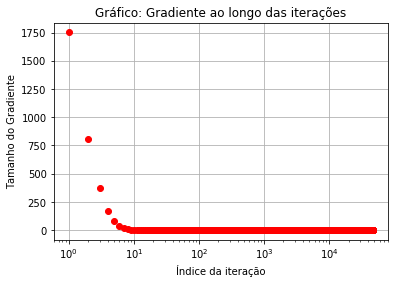

After 47817 iterations b = -39.0264886326, m = 5.57449493974, error = 29.8372249212, execution time = 7.93931603432 s


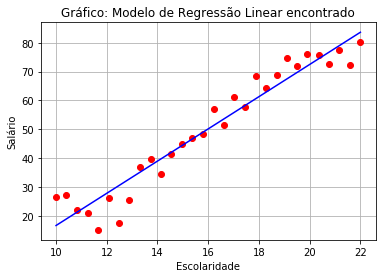

In [61]:
import time

def run():
    points = genfromtxt("income.csv", delimiter=",", names=['year', 'salary'])
    # quão rápido deve ser o processo de aprendizagem
    learning_rate = 0.001
    # y = mx + b é o modelo linear que nós queremos
    initial_b = 0 # intercepta o y
    initial_m = 0 # a inclininação da reta
    tolerance = 0.04
    
    print "Starting gradient descent at b = {0}, m = {1}, error = {2}, taxa de aprendizagem = {3}".format(initial_b, initial_m, compute_error_for_line_given_points(initial_b, initial_m, points), learning_rate)
    print "Running..."
    
    initial_time = time.time()
    
    [b, m, steps] = gradient_descent_runner(points, initial_b, initial_m, learning_rate, tolerance)
    
    final_time = time.time()
    execution_time = final_time - initial_time
    print "After {0} iterations b = {1}, m = {2}, error = {3}, execution time = {4} s".format(steps, b, m, compute_error_for_line_given_points(b, m, points), execution_time)
    plot_graph(points, m, b)

if __name__ == '__main__':
    run()

Alterando a tolerância para __0.04__ foi possível chegar aos parâmetros desejados: w0 = -39 e w1 = 5 com um pouco mais de iterações: 47817.

### 7. Implementar a forma fechada (equações normais) de calcular os coeficientes da regressão

Os algoritmos acima usam as técninas de Machine Learning (Aprendizagem de Máquina) para encontrar os coeficientes do modelo que descreve a relação entre a escolaridade de uma pessoa e o seu salário.

Abaixo, será mostrado um algoritmo que calcula esses coeficientes a partir de uma forma fechada e em uma única iteração nos dados.

Running Simple Linear Regression...
After 1 iteration m = 5.59948287412, b = -39.4462566791, execution time = 6.69956207275e-05 s


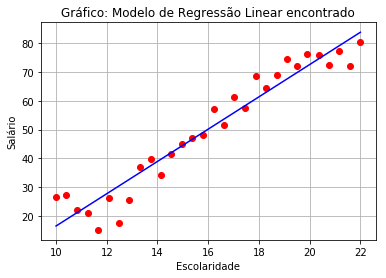

In [62]:

# TODO 7- Cálculo dos coeficientes a partir de equações normais
def linear_regression(points):
    sum_x = 0
    sum_y = 0
    N = float(len(points))
    for i in range(0, len(points)):
        x = points['year'][i]
        y = points['salary'][i]
        sum_x += x
        sum_y += y
    
    average_x = sum_x/N
    average_y = sum_y/N
    
    a = 0
    b = 0
    for i in range(0, len(points)):
        x = points['year'][i]
        y = points['salary'][i]
        a += ((x - average_x) * (y - average_y))
        b += ((x - average_x)**2)
    
    m = a/b # w1
    b = average_y - m*average_x # w0
    return [m,b]

def run():
    points = genfromtxt("income.csv", delimiter=",", names=['year', 'salary'])
    # y = mx + b é o modelo linear que nós queremos
    print "Running Simple Linear Regression..."
    
    initial_time = time.time()
    
    [m, b] = linear_regression(points)
    
    final_time = time.time()
    execution_time = final_time - initial_time
    print "After {0} iteration m = {1}, b = {2}, execution time = {3} s".format(1, m, b, execution_time)
    plot_graph(points, m, b)

if __name__ == '__main__':
    run()

Após a execução do algoritmo, o modelo gerado é da seguinte forma: __y = 5.6x - 39.44__, como mostrado no gráfico acima, representando a relação existente nos dados.

Assim, concluímos que foi possível encontrar um modelo que represente a relação entre os dados, através de forma fechada, e com tempo de execução bem inferior ao algoritmo de Aprendizagem de Máquina com Gradiente Descendente.